<a href="https://colab.research.google.com/github/Ritesh-GitHub-Ranjan/credit-card-fraud-detection/blob/main/Credit_Card_Fraud_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Fraud Detection

## Problem Statement
Credit card fraud poses a significant threat to financial institutions and their customers, leading to substantial financial losses, erosion of trust, and damage to credibility. With the increasing prevalence of digital payment channels, the number of fraudulent transactions is rising, making it imperative for banks to implement robust fraud detection systems.

In this project, we aim to predict fraudulent credit card transactions using machine learning models. The dataset comprises **284,807 transactions** over a period of two days, of which **492 are fraudulent**. Due to the **high imbalance** in the data, with fraudulent transactions accounting for only 0.172% of the total, appropriate handling techniques are necessary before building the model.

### Understanding and Defining Fraud
Credit card fraud involves any dishonest act or behavior to obtain information without proper authorization from the account holder for financial gain. Common methods of committing fraud include:
- **Skimming**: Duplicating information from the magnetic strip of the card.
- **Manipulation/Alteration**: Altering genuine cards to commit fraud.
- **Counterfeit Cards**: Creating fake cards to perform unauthorized transactions.
- **Stealing/Loss of Cards**: Using lost or stolen cards for fraudulent activities.
- **Fraudulent Telemarketing**: Using telemarketing techniques to obtain card details fraudulently.

### Data Dictionary
The dataset includes credit card transactions made by European cardholders in September 2013. The features are as follows:
- **Time**: Seconds elapsed between the first transaction and subsequent transactions.
- **V1 to V28**: Principal components obtained using PCA to ensure confidentiality.
- **Amount**: Transaction amount.
- **Class**: Class label (1 for fraud, 0 for non-fraud).

## Objective
The primary objective of this project is to develop a machine learning model that accurately identifies fraudulent transactions. By achieving this, we aim to help banks and financial institutions:
- **Reduce Financial Losses**: Minimize the monetary impact of fraudulent transactions.
- **Maintain Trust and Credibility**: Ensure customers' trust in the banking system.
- **Minimize Manual Review**: Reduce the time and effort spent on manual transaction reviews.
- **Proactive Monitoring**: Implement proactive fraud detection mechanisms to prevent fraud before it occurs.

## Step 1: Importing necessary libraries

In [3]:
# Importing python libraries :

import numpy as np
import pandas as pd
import time

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import machine learning and stats libraries:
from scipy import stats
from scipy.stats import norm, skew
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

import sklearn
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import average_precision_score, precision_recall_curve

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, PowerTransformer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold

from sklearn.svm import SVC
from sklearn import linear_model
from sklearn.linear_model import Ridge, Lasso, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn import over_sampling
from imblearn.over_sampling import ADASYN

# Install xgboost if not already installed
!pip install xgboost
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance

# Install scikit-optimize if not already installed
!pip install scikit-optimize
from skopt import BayesSearchCV

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.7 MB/s eta 0:00:00


In [4]:
from google.colab import files
uploaded = files.upload()

Saving creditcard.csv to creditcard.csv


## Step 2: Exploratory Data Analysis and Data Preparation

In [5]:
# Read the creditcard.csv file containing the data
df = pd.read_csv('creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [6]:
# Examining the Dataset Shape
df.shape

(284807, 31)

In [7]:
# Checking the Numeric Distribution of the Data
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.759061e-12,-8.251130e-13,-9.654937e-13,8.321385e-13,1.649999e-13,4.248366e-13,-3.054600e-13,8.777971e-14,-1.179749e-12,...,-3.405756e-13,-5.723197e-13,-9.725856e-13,1.464150e-12,-6.987102e-13,-5.617874e-13,3.332082e-12,-3.518874e-12,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [8]:
# Examining the DataFrame for Shape, Data Types, and Null Values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

### 2.1 Data Quality Check

In [9]:
# Checking for empty rows and columns in the dataframe
print(df.isnull().all(axis=1).sum())
print(df.isnull().all(axis=0).sum())

0
0


There are no empty rows or columns in our dataframe

In [10]:
# Calculating null counts for all the columns in the dataframe
null_columns_df = df.columns[df.isna().any()]
null_counts = df[null_columns_df].isna().sum()
print(null_counts)

Series([], dtype: float64)


Seems like there are no columns which are having null values in the dataframe.

In [11]:
# Calculating null value percentage for all the columns and making sure the above statement stands corrected.
null_percentage = df.isna().mean() * 100
null_percentage_sorted = null_percentage.sort_values(ascending=False)

print(null_percentage_sorted)

Time      0.0
V1        0.0
V2        0.0
V3        0.0
V4        0.0
V5        0.0
V6        0.0
V7        0.0
V8        0.0
V9        0.0
V10       0.0
V11       0.0
V12       0.0
V13       0.0
V14       0.0
V15       0.0
V16       0.0
V17       0.0
V18       0.0
V19       0.0
V20       0.0
V21       0.0
V22       0.0
V23       0.0
V24       0.0
V25       0.0
V26       0.0
V27       0.0
V28       0.0
Amount    0.0
Class     0.0
dtype: float64


There are no null values present in any of the columns in our dataframe

### 2.2 Finding the class distribution

In [12]:
# Check the fraud/non-fraud related records
fraud_non_fraud_counts = df['Class'].value_counts()

# Find % values of class
class_percentages = df['Class'].value_counts(normalize=True) * 100

# Display the class distribution
print("Fraud/Non-Fraud Related Records:")
print(fraud_non_fraud_counts)
print("-" * 40)  # Separator line
print("Percentage of Each Class:")
print(class_percentages)

Fraud/Non-Fraud Related Records:
Class
0    284315
1       492
Name: count, dtype: int64
----------------------------------------
Percentage of Each Class:
Class
0    99.827251
1     0.172749
Name: proportion, dtype: float64


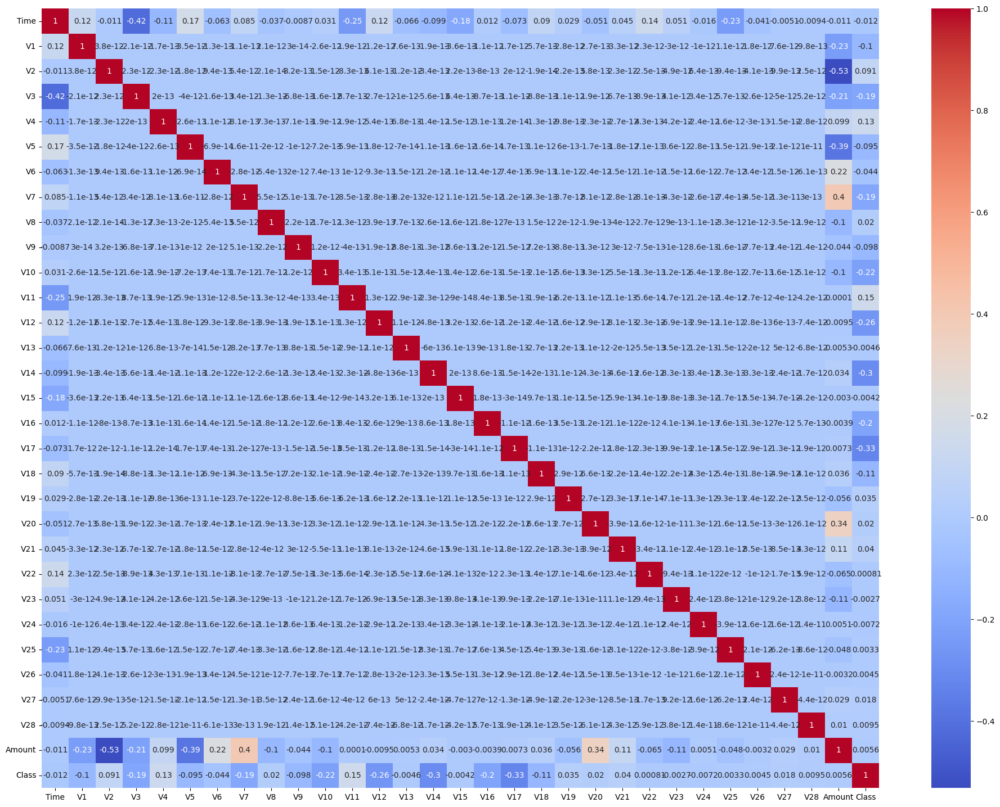

In [13]:
# Plotting correlations on a heatmap

# Compute the correlation matrix
correlation_matrix = df.corr()

# Set the figure size
plt.figure(figsize=(24, 18))

# Plot the heatmap
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=True)

# Display the plot
plt.show()

#### 2.2.1 Defining helper functions

In [14]:
# Plots a bar chart showing counts and percentages of different categories with customizable labels and title.

def plot_bar_chart(labels, counts, percentages, x_label='Transaction Type', y_label='Number of Transactions', title='Number and Percentage of Fraudulent vs Non-Fraudulent Transactions', bar_label='Number of Transactions'):

    fig, ax1 = plt.subplots()

    ax1.bar(labels, counts, color='lightcoral', label=bar_label)
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.tick_params(axis='y', labelcolor='darkred')

    for i, percentage in enumerate(percentages):
        ax1.text(i, counts[i] * 1.01, f'{percentage:.2f}%', ha='center', color='darkorange')

    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [15]:
# Creates a scatter plot with customizable x and y axes, color-coded by a specified column and faceted by another column.

def plot_scatter(df, x_col, y_col, col_col, hue_col, title, xlabel, ylabel, palette='viridis'):

    # Create the scatter plot
    g = sns.relplot(x=x_col, y=y_col, col=col_col, hue=hue_col, kind="scatter", data=df, palette=palette)

    # Set titles and labels
    g.fig.suptitle(title, size=16, y=1.05)  # Adjust y to move title up
    g.set_axis_labels(xlabel, ylabel)

    # Adjust tick parameters for all facets
    g.set_xticklabels(rotation=45, size=12)
    g.set_yticklabels(size=12)

    # Adjust layout to prevent overlap
    plt.subplots_adjust(top=0.9)  # Adjust top margin to ensure title fits
    plt.show()

In [16]:
# Plots a scatter plot with x values and index as y values, color-coded by a hue column, using a symlog scale for the x-axis.

def plot_transaction_distribution(df, x_col, hue_col, title, xlabel, ylabel, non_fraud_label='Non-Fraudulent', fraud_label='Fraudulent'):

    plt.figure(figsize=(12, 6))

    # Plotting non-fraudulent transactions
    plt.scatter(df[df[hue_col] == 0][x_col], df[df[hue_col] == 0].index, alpha=0.5, label=non_fraud_label, s=10, color='skyblue')

    # Plotting fraudulent transactions
    plt.scatter(df[df[hue_col] == 1][x_col], df[df[hue_col] == 1].index, color='darkorange', label=fraud_label, s=10)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='upper right')
    plt.xscale('symlog')  # Using a symlog scale due to the wide range of transaction amounts
    plt.xlim(left=0)  # Start the x-axis from 0
    plt.show()

In [17]:
# Creates a scatter plot showing transactions over time, with different colors for non-fraudulent and fraudulent transactions.

def plot_fraud_vs_nonfraud_transactions(df, time_col, amount_col, class_col, title='Distribution of Transactions over Time', xlabel='Time (in seconds)', ylabel='Transaction Amount', non_fraud_label='Non-Fraudulent', fraud_label='Fraudulent', non_fraud_color='skyblue', fraud_color='darkorange'):

    plt.figure(figsize=(12, 6))

    # Plot non-fraudulent transactions
    plt.scatter(df[df[class_col] == 0][time_col], df[df[class_col] == 0][amount_col], alpha=0.5, label=non_fraud_label, s=10, color=non_fraud_color)

    # Plot fraudulent transactions
    plt.scatter(df[df[class_col] == 1][time_col], df[df[class_col] == 1][amount_col], color=fraud_color, label=fraud_label, s=10)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

In [18]:
# Calculate shares
classes = df['Class'].value_counts()
normal_share = classes[0] / df['Class'].count() * 100
fraud_share = classes[1] / df['Class'].count() * 100

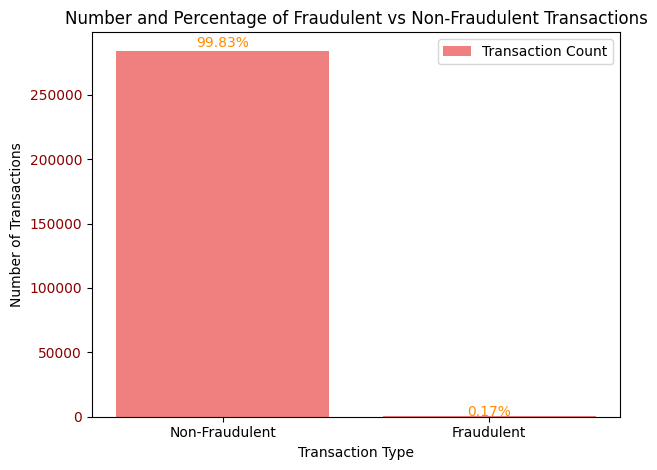

In [19]:
# Plot bar chart
labels = ['Non-Fraudulent', 'Fraudulent']
counts = [classes[0], classes[1]]
percentages = [normal_share, fraud_share]
plot_bar_chart(labels, counts, percentages, bar_label='Transaction Count')

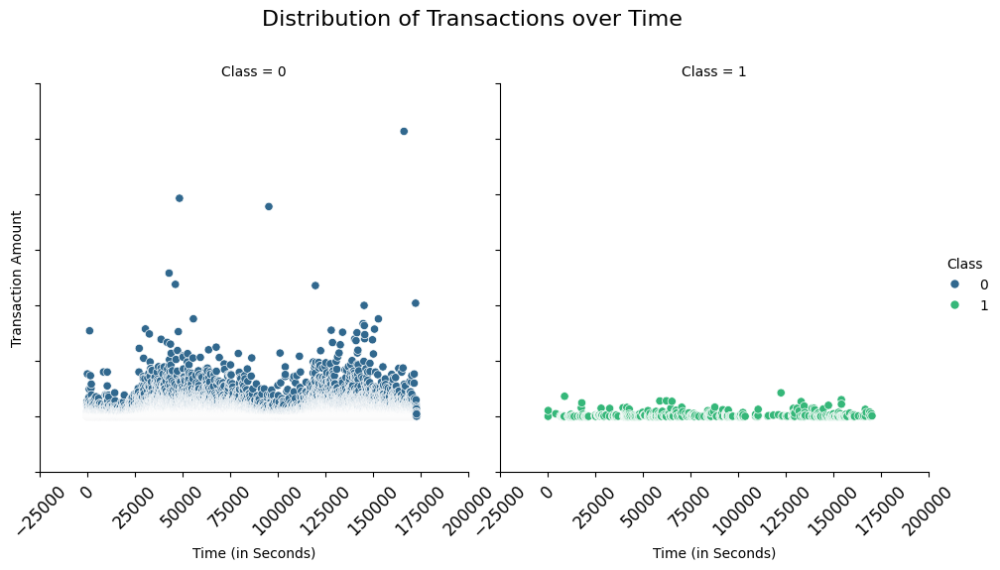

In [20]:
# Generate a scatter plot to visualize the distribution of transaction classes over time
plot_scatter(
    df,
    x_col='Time',
    y_col='Amount',
    col_col='Class',
    hue_col='Class',
    title='Distribution of Transactions over Time',
    xlabel='Time (in Seconds)',
    ylabel='Transaction Amount'
)

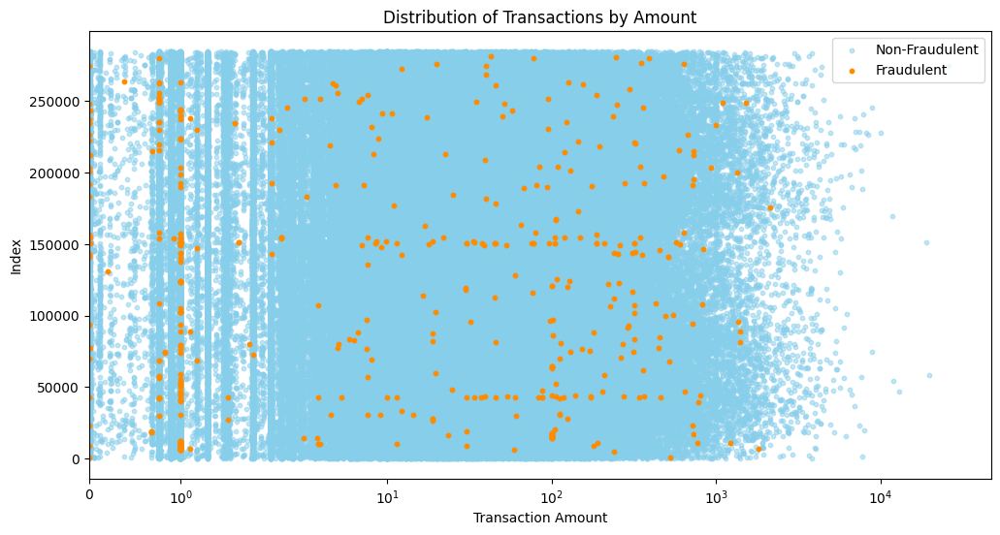

In [21]:
# Generate a scatter plot to visualize the distribution of classes based on transaction amounts
plot_transaction_distribution(
    df,
    x_col='Amount',
    hue_col='Class',
    title='Distribution of Transactions by Amount',
    xlabel='Transaction Amount',
    ylabel='Index',
    non_fraud_label='Non-Fraudulent',
    fraud_label='Fraudulent'
)

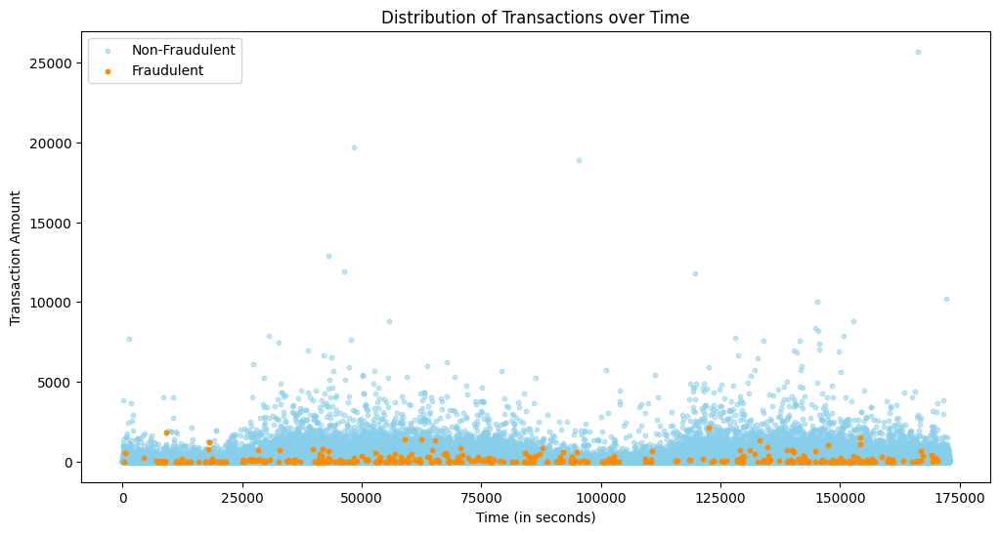

In [22]:
# Plotting distributions of transactions over time
plot_fraud_vs_nonfraud_transactions(
    df,
    time_col='Time',
    amount_col='Amount',
    class_col='Class',
    title='Distribution of Transactions over Time',
    xlabel='Time (in seconds)',
    ylabel='Transaction Amount',
    non_fraud_label='Non-Fraudulent',
    fraud_label='Fraudulent'
)

In [23]:
# Print shares
print("Normal Share: ", normal_share, "\nFraud Share: ", fraud_share)

Normal Share:  99.82725143693798 
Fraud Share:  0.1727485630620034



1. **Imbalanced Dataset:** Out of a total o284,31507 credit card transactions, only 492 are classified as fraudulent.
   
2. **Significant Imbalance:** The distribution of fraudulent transactions (0.172%) is markedly lower compared to genuine transactions.

3. **Impact on Model Performance:** This imbalance can lead models to achieve high accuracy by favoring predictions of the majority class (non-fraudulent transactions).

4. **Focus on Alternative Metrics:** To address this challenge, we will prioritize alternative evaluation metrics such as ROC-AUC, precision, and recall.

5. **Enhanced Assessment:** These metrics provide a more nuanced evaluation of the model's performance, especially in scenarios with imbalanced datasets, offering insights beyond traditional accuracy measurement.

In [24]:
# Plots the distribution of fraudulent and non-fraudulent transactions by day and hour.
def plot_fraud_vs_nonfraud_by_time(df, time_col='Time', class_col='Class'):

    # Convert time to timedelta
    Delta_Time = pd.to_timedelta(df[time_col], unit='s')

    # Create derived columns
    df['Time_Day'] = (Delta_Time.dt.components.days).astype(int)
    df['Time_Hour'] = (Delta_Time.dt.components.hours).astype(int)
    df['Time_Min'] = (Delta_Time.dt.components.minutes).astype(int)

    # Plot Fraud Vs Normal Transactions by Day
    plt.figure(figsize=(5, 5))
    sns.distplot(df[df[class_col] == 0]["Time_Day"], color='blue', label='Non-Fraudulent')
    sns.distplot(df[df[class_col] == 1]["Time_Day"], color='orange', label='Fraudulent')
    plt.title('Fraud Vs Normal Transactions by Day', fontsize=17)
    plt.legend()
    plt.show()

    # Plot Fraud Vs Normal Transactions by Hour
    plt.figure(figsize=(15, 5))
    sns.distplot(df[df[class_col] == 0]["Time_Hour"], color='blue', label='Non-Fraudulent')
    sns.distplot(df[df[class_col] == 1]["Time_Hour"], color='orange', label='Fraudulent')
    plt.title('Fraud Vs Normal Transactions by Hour', fontsize=17)
    plt.legend()
    plt.show()

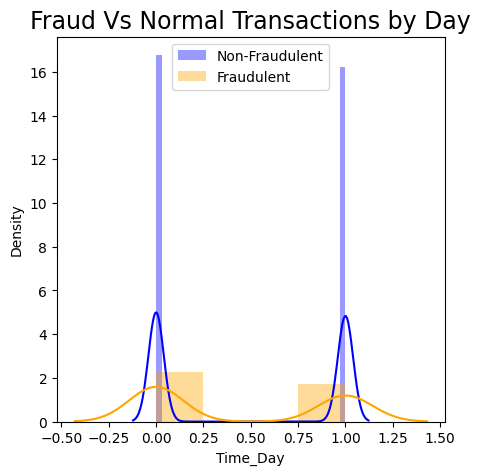

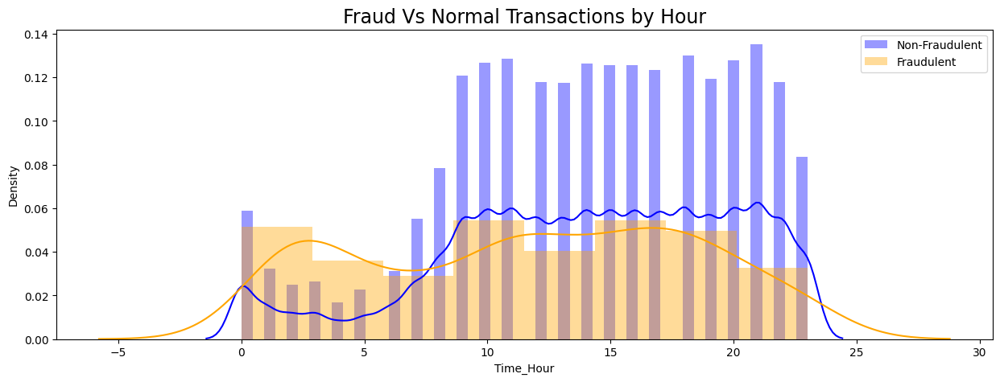

In [25]:
plot_fraud_vs_nonfraud_by_time(df, time_col='Time', class_col='Class')

**Observations**:
- **Temporal Patterns**: Both plots indicate that there are temporal patterns in transaction data. Understanding these patterns can help in developing more effective fraud detection models.
- **Challenge in Distinction**: The overlap in the distribution of non-fraudulent and fraudulent transactions suggests that time alone may not be a sufficient feature for distinguishing between the two classes. Additional features and more sophisticated models will likely be needed.
- **Focus on Peaks**: The peaks in fraudulent transactions can be particularly useful for targeted fraud detection. By focusing on these peak times, it may be possible to develop more efficient and effective fraud detection strategies.

In [26]:
# Plots histograms of a specified feature for fraudulent and non-fraudulent transactions.
def plot_transaction_data(df, feature, class_column='Class', bins=50, log_scale=False):
    # Create subplots
    f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 4))

    # Plot histograms
    ax1.hist(df[feature][df[class_column] == 1], bins=bins)
    ax1.set_title('Fraud')

    ax2.hist(df[feature][df[class_column] == 0], bins=bins)
    ax2.set_title('Normal')

    # Set common labels
    plt.xlabel(feature)
    plt.ylabel('Number of Transactions')

    # Apply logarithmic scale if specified
    if log_scale:
        plt.yscale('log')

    # Show plot
    plt.show()

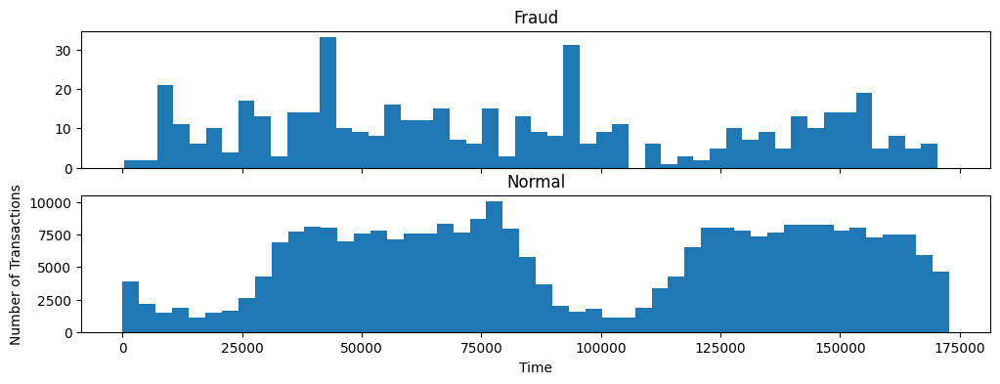

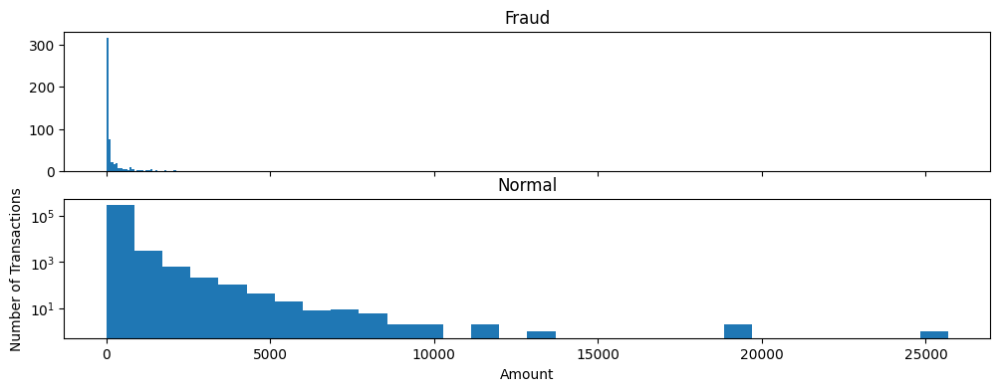

In [27]:
plot_transaction_data(df, 'Time', bins=50)
plot_transaction_data(df, 'Amount', bins=30, log_scale=True)

**Observations:**
Fraudulent transactions are sparse and irregular over time, while non-fraudulent transactions show consistent activity. Fraudulent transaction amounts are generally low, with a few high outliers, whereas non-fraudulent transactions have a broader and more evenly distributed range of amounts.

Fraud Transaction Amount Statistics:
count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

Regular Transaction Amount Statistics:
count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64



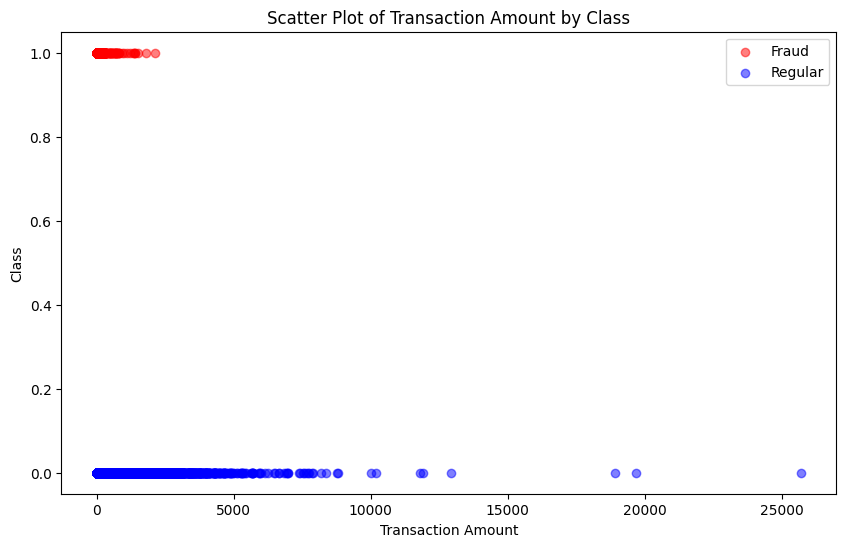

In [28]:
# Calculate and print statistics for both fraud and regular transactions
for class_type, label in [(1, 'Fraud'), (0, 'Regular')]:
    stats = df[df['Class'] == class_type]['Amount'].describe()
    print(f"{label} Transaction Amount Statistics:\n{stats}\n")

# Create a scatter plot to observe the distribution of classes with Amount
plt.figure(figsize=(10, 6))
plt.scatter(df[df['Class'] == 1]['Amount'], [1]*len(df[df['Class'] == 1]), alpha=0.5, label='Fraud', color='red')
plt.scatter(df[df['Class'] == 0]['Amount'], [0]*len(df[df['Class'] == 0]), alpha=0.5, label='Regular', color='blue')
plt.xlabel('Transaction Amount')
plt.ylabel('Class')
plt.title('Scatter Plot of Transaction Amount by Class')
plt.legend()
plt.show()

1. **Univariate Analysis:**
   - Most features, being principal components, are centered around 0 as expected.
   - The 'amount' feature exhibits a right-skewed distribution, suggesting potential need for transformation.

2. **Bivariate Analysis:**
   - Fraudulent transactions display distinct distributions compared to non-fraudulent transactions, particularly noticeable in certain principal components.

3. **Data Integrity:**
   - There are no missing values present in the dataset.

### 2.3 Understanding more on the correlation in data

In [29]:
# A function to find correlations with the target variabel 'Class'
def plot_strong_correlation_heatmap(df, target_variable, threshold=0.09, figsize=(10, 8)):
    # Step 1: Calculate correlation matrix
    cor = df.corr()

    # Step 2: Extract and sort correlation values for the target variable
    corr_initial = cor[target_variable].abs().sort_values(ascending=False)

    # Step 3: Select features with correlation > threshold
    top_features = corr_initial[corr_initial > threshold].index

    # Step 4: Print the top correlations
    print("Top correlations with the target variable:")
    print(corr_initial[corr_initial > threshold])

    # Step 5: Plot heatmap for these features
    plt.figure(figsize=figsize)
    heatmap = sns.heatmap(df[top_features].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, linecolor='black')

    # Customize grid lines
    heatmap.set_xticks([x + 0.5 for x in range(len(top_features))], minor=True)
    heatmap.set_yticks([y + 0.5 for y in range(len(top_features))], minor=True)
    heatmap.grid(which='minor', color='black', linestyle='-', linewidth=1)

    plt.title(f'Heatmap of Features with Correlation > {threshold} with Target Variable')
    plt.show()

Top correlations with the target variable:
Class    1.000000
V17      0.326481
V14      0.302544
V12      0.260593
V10      0.216883
V16      0.196539
V3       0.192961
V7       0.187257
V11      0.154876
V4       0.133447
V18      0.111485
V1       0.101347
V9       0.097733
V5       0.094974
V2       0.091289
Name: Class, dtype: float64


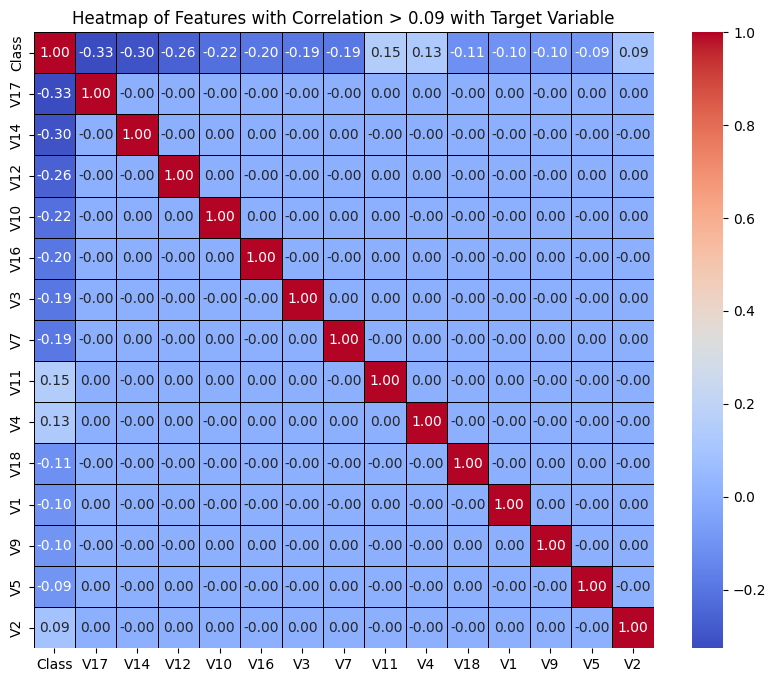

In [30]:
plot_strong_correlation_heatmap(df, 'Class')

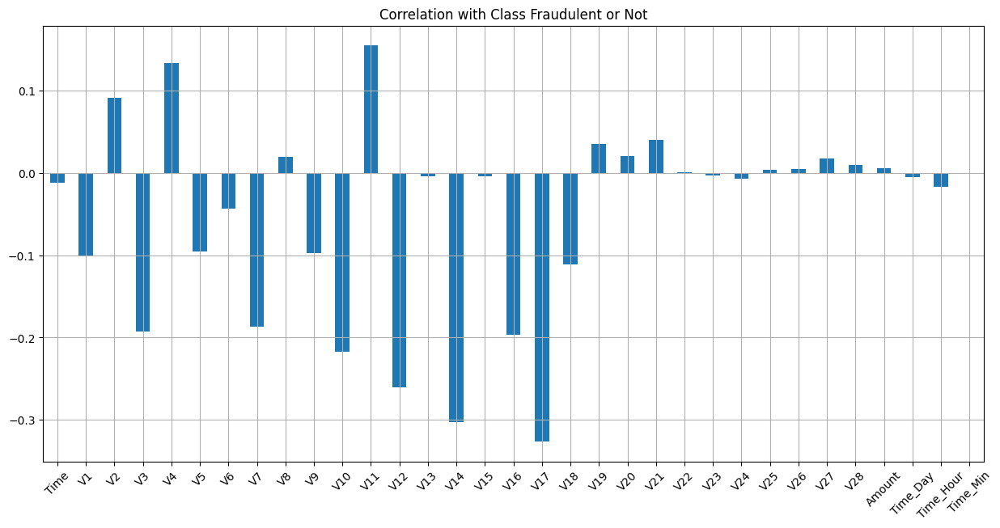

In [31]:
## Linear Correlation with Response Variable
# Plot correlation with 'Class'
df.drop(columns=['Class']).corrwith(df['Class']).plot.bar(
    figsize=(15, 7), title="Correlation with Class Fraudulent or Not", fontsize=10,
    rot=45, grid=True
)
plt.show()

In [32]:
# Drop unnecessary columns
columns_to_drop = ['Time', 'Time_Day', 'Time_Min']
df.drop(columns=columns_to_drop, inplace=True)

In [33]:
# Drop rows with any missing values
df.dropna(inplace=True)

In [34]:
# Normalize 'Amount' and drop the original 'Amount' column
df['normalizedAmount'] = StandardScaler().fit_transform(df[['Amount']])
df.drop(columns=['Amount'], inplace=True)

### 2.4 Splitting data into 'Test' and 'Train' set

In [35]:
#Create X and y dataset for independent and dependent data
y= df['Class']
X = df.drop(['Class'], axis=1)

In [36]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Time_Hour,normalizedAmount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,0.244964
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,-0.342475
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,1.160686
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,0.140534
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,-0.073403


In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.20)

In [38]:
# Checking the shapes of y_train, X_test, and X_train

# Check the shape of X_train
X_train_shape = X_train.shape
print(f"The shape of X_train is: {X_train_shape}")

# Check the shape of X_test
X_test_shape = X_test.shape
print(f"The shape of X_test is: {X_test_shape}")

# Check the shape of y_train
y_train_shape = y_train.shape
print(f"The shape of y_train is: {y_train_shape}")

The shape of X_train is: (227845, 30)
The shape of X_test is: (56962, 30)
The shape of y_train is: (227845,)


##### Preserve X_test & y_test to evaluate on the test data once you build the model

In [39]:
print(np.sum(y))
print(np.sum(y_train))
print(np.sum(y_test))

492
396
96


In [40]:
# Check the shape of X_train columns
cols = list(X_train.columns.values)

# Print the number of columns in X_train
num_cols = len(cols)
print(f"The number of columns in X_train is: {num_cols}")

# Print the column names
print("The columns in X_train are:")
for col in cols:
    print(col)

The number of columns in X_train is: 30
The columns in X_train are:
V1
V2
V3
V4
V5
V6
V7
V8
V9
V10
V11
V12
V13
V14
V15
V16
V17
V18
V19
V20
V21
V22
V23
V24
V25
V26
V27
V28
Time_Hour
normalizedAmount


#### 2.4.1 Charting the Distribution of a Variable

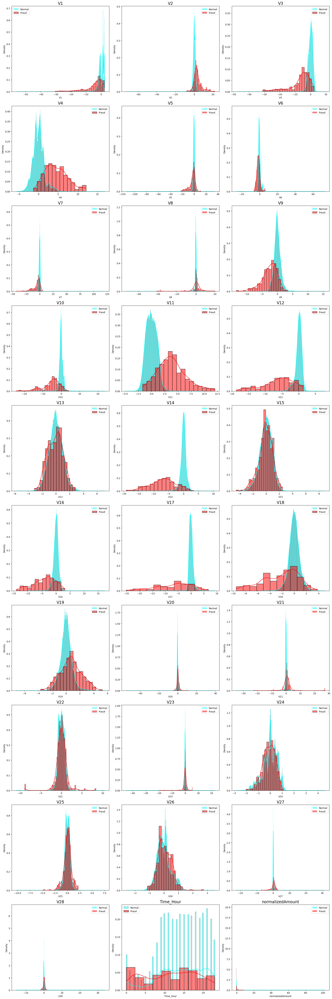

In [41]:
# Define the normal and fraud records
normal_records = df['Class'] == 0
fraud_records = df['Class'] == 1

# Set up the figure size and layout
plt.figure(figsize=(20, 60))

# Loop through each column and plot the histograms with density
for n, col in enumerate(cols):
    plt.subplot(10, 3, n + 1)
    sns.histplot(df[col][normal_records], color='cyan', kde=True, label='Normal', stat='density')
    sns.histplot(df[col][fraud_records], color='red', kde=True, label='Fraud', stat='density')
    plt.title(col, fontsize=17)
    plt.legend()

# Display the plots
plt.tight_layout()
plt.show()

**Observations:**

- The dataset comprises 284,807 transactions, of which 492 are identified as fraudulent.
- The dataset exhibits a significant class imbalance, with fraudulent transactions accounting for only 0.172% of the total.
- Features include 'time', 'amount', and 28 principal components (V1 to V28) derived from PCA.
- The target variable 'class' denotes fraud with 1 and non-fraud with 0.raud.

## Step 3 Handling Skewness in the Distribution

- Use the **PowerTransformer** class from the **preprocessing module in sklearn** to transform the distribution to be more Gaussian.

In [42]:
# Apply PowerTransformer and fit-transform on training data, then transform test data
pt = PowerTransformer()
X_train_pt = pt.fit_transform(X_train)
X_test_pt = pt.transform(X_test)

# Create DataFrames
X_train_pt_df = pd.DataFrame(X_train_pt, columns=cols)
X_test_pt_df = pd.DataFrame(X_test_pt, columns=cols)

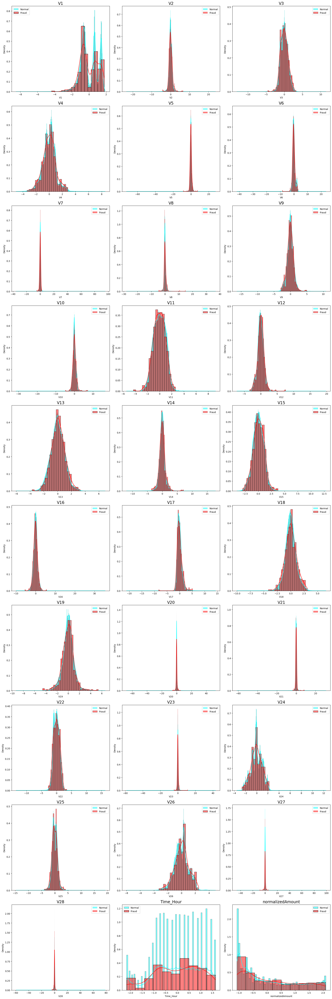

In [43]:
# Visualize the distribution of variables from the training dataset using histograms

# Set up the figure size and layout
plt.figure(figsize=(20, 60))

# Loop through each column and plot the histograms with density
for n, col in enumerate(cols):
    plt.subplot(10, 3, n + 1)
    sns.histplot(X_train_pt_df[col][normal_records], color='cyan', kde=True, label='Normal', stat='density')
    sns.histplot(X_train_pt_df[col][fraud_records], color='red', kde=True, label='Fraud', stat='density')
    plt.title(col, fontsize=17)
    plt.legend()

# Display the plots
plt.tight_layout()
plt.show()

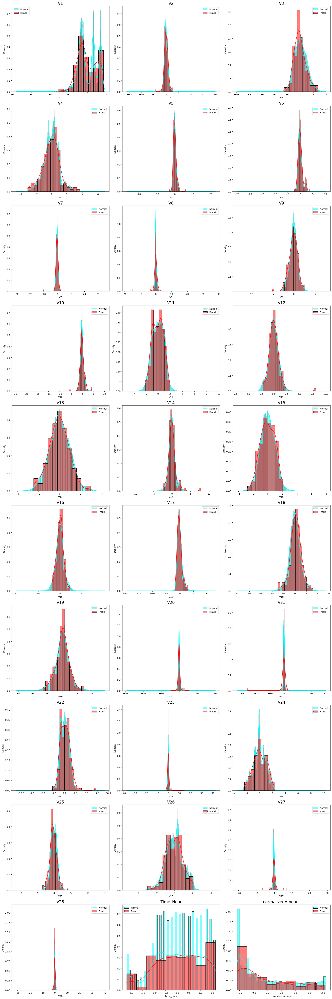

In [44]:
# Visualize the distribution of variables from the test dataset using histograms

plt.figure(figsize=(20, 60))

# Loop through each column and plot the histograms with density for the test dataset
for n, col in enumerate(cols):
    plt.subplot(10, 3, n + 1)
    sns.histplot(X_test_pt_df[col][normal_records], color='cyan', kde=True, label='Normal', stat='density')
    sns.histplot(X_test_pt_df[col][fraud_records], color='red', kde=True, label='Fraud', stat='density')
    plt.title(col, fontsize=17)
    plt.legend()

# Display the plots
plt.tight_layout()
plt.show()

## Step 4: Model Engineering

#### 4.1 Build Model Functions for  Logistic Regression, K-Nearest Neighbors (KNN), Support Vector Machine (SVM), Decision Tree, Random Forest, and XGBoost

In [45]:
# Set Up a DataFrame to Record Results
df_Results = pd.DataFrame(columns=['Data_Imbalance_Handling','Model','Accuracy','roc_value','threshold'])

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, roc_auc_score, classification_report, roc_curve, auc
from sklearn.model_selection import KFold

In [47]:
# A function to plot confusion matrix
def plot_confusion_matrix(y_test, pred_test, model_name):
    cm = confusion_matrix(y_test, pred_test)
    class_names = ['Non-Fraudulent', 'Fraudulent']

    fig, ax = plt.subplots()
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    ax.set_title(f'Confusion Matrix - {model_name}')
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('True label')

    tick_marks = np.arange(len(class_names))
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(class_names, rotation=45)
    ax.set_yticklabels(class_names)

    s = [['TN', 'FP'], ['FN', 'TP']]

    for i in range(2):
        for j in range(2):
            color = 'white' if cm[i, j] > cm.max() / 2 else 'black'
            ax.text(j, i, f'{s[i][j]} = {cm[i, j]}', ha='center', va='center', color=color, fontsize=12)

    plt.tight_layout()
    plt.show()


In [48]:
# Evaluate the trained model and return predictions and probabilities
def evaluate_model(model, X_test, y_test, model_name):
    # Evaluate the trained model and return predictions and probabilities
    y_pred = model.predict(X_test)
    y_pred_probs = model.predict_proba(X_test)[:, 1]
    accuracy = metrics.accuracy_score(y_test, y_pred)
    roc_value = roc_auc_score(y_test, y_pred_probs)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs)
    threshold = thresholds[np.argmax(tpr - fpr)]

    # Plot confusion matrix
    plot_confusion_matrix(y_test, y_pred, model_name)

    return y_pred, y_pred_probs, accuracy, roc_value, fpr, tpr, threshold

In [49]:
# Print evaluation metrics
def print_evaluation_metrics(y_test, y_pred, model_name):
    print(f"Accuracy of {model_name}: {metrics.accuracy_score(y_test, y_pred)}")
    print("Classification Report")
    print(classification_report(y_test, y_pred))

In [50]:
# Append results to the dataframe using pd.concat
def append_results(df_Results, DataImabalance, model_name, accuracy, roc_value, threshold):
    new_row = pd.DataFrame({
        'Data_Imbalance_Handling': [DataImabalance],
        'Model': [model_name],
        'Accuracy': [accuracy],
        'roc_value': [roc_value],
        'threshold': [threshold]
    })
    return pd.concat([df_Results, new_row], ignore_index=True)

In [51]:
# Plot ROC curve
def plot_roc_curve(fpr, tpr, roc_auc, model_name):
    plt.plot(fpr, tpr, label=f"{model_name}, auc={roc_auc:.4f}")
    plt.legend(loc=4)
    plt.title(f"ROC Curve - {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.show()

In [52]:
# Helper function to print model parameters
def print_model_parameters(model, regularization_type):
    print(f"Parameters for {regularization_type} regularization")
    print(model.coef_)
    print(model.intercept_)
    print(model.scores_)

- Logistic Regression Model

In [53]:
# Train logistic regression model with specified penalty and solver
def train_logistic_model(X_train, y_train, num_C, cv_num, penalty, solver):
    searchCV = LogisticRegressionCV(
        Cs=num_C, penalty=penalty, scoring='roc_auc', cv=cv_num, random_state=42,
        max_iter=10000, fit_intercept=True, solver=solver, tol=10
    )
    searchCV.fit(X_train, y_train)
    return searchCV

In [54]:
# Main function to build and evaluate logistic regression models with L1 and L2 regularization
def buildAndRunLogisticModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    num_C = np.power(10.0, np.arange(-10, 10))
    cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

    # Train models
    searchCV_l2 = train_logistic_model(X_train, y_train, num_C, cv_num, 'l2', 'newton-cg')
    searchCV_l1 = train_logistic_model(X_train, y_train, num_C, cv_num, 'l1', 'liblinear')

    # Print model parameters
    print_model_parameters(searchCV_l2, 'l2')
    print_model_parameters(searchCV_l1, 'l1')


    # Evaluate models
    y_pred_l2, y_pred_probs_l2, Accuracy_l2, l2_roc_value, fpr_l2, tpr_l2, threshold_l2 = evaluate_model(searchCV_l2, X_test, y_test, "Logistic model with l2 regularisation")
    y_pred_l1, y_pred_probs_l1, Accuracy_l1, l1_roc_value, fpr_l1, tpr_l1, threshold_l1 = evaluate_model(searchCV_l1, X_test, y_test, "Logistic model with l1 regularisation")

    # Print evaluation metrics
    print_evaluation_metrics(y_test, y_pred_l2, "Logistic model with l2 regularisation")
    print_evaluation_metrics(y_test, y_pred_l1, "Logistic model with l1 regularisation")

    # Print additional details for L2
    print(f"l2 roc_value: {l2_roc_value:.10f} l2 threshold: {threshold_l2:.10f} ROC for the test dataset {l2_roc_value*100:.1f}%")
    # Plot ROC curve for L2
    plot_roc_curve(fpr_l2, tpr_l2, l2_roc_value, "Logistic model with l2 regularisation")

    # Print additional details for L1
    print(f"l1 roc_value: {l1_roc_value:.10f} l1 threshold: {threshold_l1:.10f} ROC for the test dataset {l1_roc_value*100:.1f}%")
    # Plot ROC curve for L1
    plot_roc_curve(fpr_l1, tpr_l1, l1_roc_value, "Logistic model with l1 regularisation")

    # Append results
    df_Results = append_results(df_Results, DataImabalance, 'Logistic Regression with L2 Regularisation', Accuracy_l2, l2_roc_value, threshold_l2)
    df_Results = append_results(df_Results, DataImabalance, 'Logistic Regression with L1 Regularisation', Accuracy_l1, l1_roc_value, threshold_l1)

    return df_Results

- KNN Model

In [55]:
# Train KNN model
def train_knn_model(X_train, y_train, n_neighbors=5, n_jobs=16):
    knn = KNeighborsClassifier(n_neighbors=n_neighbors, n_jobs=n_jobs)
    knn.fit(X_train, y_train)
    return knn

In [56]:
# Main function to build and evaluate KNN model
def buildAndRunKNNModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Train KNN model
    knn = train_knn_model(X_train, y_train)

    # Evaluate KNN model
    y_pred, knn_probs, accuracy, roc_value, fpr, tpr, threshold = evaluate_model(knn, X_test, y_test, "KNN model")

    # Print evaluation metrics
    print_evaluation_metrics(y_test, y_pred, "KNN model")

    # Print additional details for KNN
    print(f"KNN roc_value: {roc_value:.10f} KNN threshold: {threshold:.10f} ROC for the test dataset {roc_value*100:.1f}%")

    # Plot ROC curve for KNN
    plot_roc_curve(fpr, tpr, roc_value, "KNN model")

    # Append results
    df_Results = append_results(df_Results, DataImabalance, 'KNN', accuracy, roc_value, threshold)

    return df_Results

- SVM Model

In [57]:
# Train SVM model with specified kernel
def train_svm_model(X_train, y_train, kernel='sigmoid', probability=True, random_state=42):
    svm = SVC(kernel=kernel, probability=probability, random_state=random_state)
    svm.fit(X_train, y_train)
    return svm

In [58]:
# Main function to build and evaluate SVM model with sigmoid kernel
def buildAndRunSVMModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Train SVM model
    svm = train_svm_model(X_train, y_train)

    # Evaluate SVM model
    y_pred, svm_probs, accuracy, roc_value, fpr, tpr, threshold = evaluate_model(svm, X_test, y_test, "SVM model with sigmoid kernel")

    # Print evaluation metrics
    print_evaluation_metrics(y_test, y_pred, "SVM model with sigmoid kernel")

    # Print additional details for SVM
    print(f"SVM roc_value: {roc_value:.10f} SVM threshold: {threshold:.10f} ROC for the test dataset {roc_value*100:.1f}%")

    # Plot ROC curve for SVM
    plot_roc_curve(fpr, tpr, roc_value, "SVM model with sigmoid kernel")

    # Append results
    df_Results = append_results(df_Results, DataImabalance, 'SVM', accuracy, roc_value, threshold)

    return df_Results

- Decision Tree model

In [59]:
# Train Decision Tree model with specified criterion
def train_tree_model(X_train, y_train, criterion='gini', random_state=42):
    tree = DecisionTreeClassifier(criterion=criterion, random_state=random_state)
    tree.fit(X_train, y_train)
    return tree

In [60]:
# Main function to build and evaluate Decision Tree models with 'gini' & 'entropy' criteria
def buildAndRunTreeModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    criteria = ['gini', 'entropy']

    for c in criteria:
        # Train Decision Tree model
        tree = train_tree_model(X_train, y_train, criterion=c)

        # Evaluate Decision Tree model
        y_pred, tree_probs, accuracy, roc_value, fpr, tpr, threshold = evaluate_model(tree, X_test, y_test, f"Tree model with {c} criterion")

        # Print evaluation metrics
        print_evaluation_metrics(y_test, y_pred, f"Tree model with {c} criterion")

        # Print additional details for Decision Tree
        print(f"Tree model with {c} criterion roc_value: {roc_value:.10f} threshold: {threshold:.10f} ROC for the test dataset {roc_value*100:.1f}%")

        # Plot ROC curve for Decision Tree
        plot_roc_curve(fpr, tpr, roc_value, f"Tree model with {c} criterion")

        # Append results
        df_Results = append_results(df_Results, DataImabalance, f'Tree Model with {c} criteria', accuracy, roc_value, threshold)

    return df_Results

- Random Forest model

In [61]:
# Train Random Forest model
def train_random_forest_model(X_train, y_train, n_estimators=100, max_features='sqrt', random_state=42):
    rf = RandomForestClassifier(n_estimators=n_estimators, bootstrap=True, max_features=max_features, random_state=random_state)
    rf.fit(X_train, y_train)
    return rf

In [62]:
# Main function to build and evaluate Random Forest model
def buildAndRunRandomForestModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Train Random Forest model
    rf = train_random_forest_model(X_train, y_train)

    # Evaluate Random Forest model
    y_pred, rf_probs, accuracy, roc_value, fpr, tpr, threshold = evaluate_model(rf, X_test, y_test, "Random Forest model")

    # Print evaluation metrics
    print_evaluation_metrics(y_test, y_pred, "Random Forest model")

    # Print additional details for Random Forest
    print(f"Random Forest roc_value: {roc_value:.10f} threshold: {threshold:.10f} ROC for the test dataset {roc_value*100:.1f}%")

    # Plot ROC curve for Random Forest
    plot_roc_curve(fpr, tpr, roc_value, "Random Forest model")

    # Append results
    df_Results = append_results(df_Results, DataImabalance, 'Random Forest', accuracy, roc_value, threshold)

    return df_Results

- XGBoost Model

In [63]:
# Train XGBoost model
def train_xgboost_model(X_train, y_train, random_state=42):
    xgb = XGBClassifier(random_state=random_state)
    xgb.fit(X_train, y_train)
    return xgb

In [64]:
# Main function to build and evaluate XGBoost model
def buildAndRunXGBoostModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test):
    # Train XGBoost model
    xgb = train_xgboost_model(X_train, y_train)

    # Evaluate XGBoost model
    y_pred, xgb_probs, accuracy, roc_value, fpr, tpr, threshold = evaluate_model(xgb, X_test, y_test, "XGBoost model")

    # Print evaluation metrics
    print_evaluation_metrics(y_test, y_pred, "XGBoost model")

    # Print additional details for XGBoost
    print(f"XGBoost roc_value: {roc_value:.10f} threshold: {threshold:.10f} ROC for the test dataset {roc_value*100:.1f}%")

    # Plot ROC curve for XGBoost
    plot_roc_curve(fpr, tpr, roc_value, "XGBoost model")

    # Append results
    df_Results = append_results(df_Results, DataImabalance, 'XGBoost', accuracy, roc_value, threshold)

    return df_Results

#### 4.2 Building Models

- Develop and evaluate various models on the imbalanced dataset to compare their performance

In [65]:
# A function to run all the models
def run_all_models(df_Results, DataImabalance, X_train, y_train, X_test, y_test, run_svm=True):
    separator = '=' * 100

    # Run Logistic Regression with L1 And L2 Regularisation
    print("Logistic Regression with L1 And L2 Regularisation")
    print(separator)
    start_time = time.time()
    df_Results = buildAndRunLogisticModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
    print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
    print(separator)

    # Run KNN Model
    print("KNN Model")
    print(separator)
    start_time = time.time()
    df_Results = buildAndRunKNNModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
    print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
    print(separator)

    # Run Decision Tree Models with 'gini' & 'entropy' criteria
    print("Decision Tree Models with 'gini' & 'entropy' criteria")
    print(separator)
    start_time = time.time()
    df_Results = buildAndRunTreeModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
    print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
    print(separator)

    # Run Random Forest Model
    print("Random Forest Model")
    print(separator)
    start_time = time.time()
    df_Results = buildAndRunRandomForestModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
    print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
    print(separator)

    # Run XGBoost Model
    print("XGBoost Model")
    print(separator)
    start_time = time.time()
    df_Results = buildAndRunXGBoostModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
    print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
    print(separator)

    # Run SVM Model with Sigmoid Kernel if run_svm is True
    if run_svm:
        print("SVM Model with Sigmoid Kernel")
        print(separator)
        start_time = time.time()
        df_Results = buildAndRunSVMModels(df_Results, DataImabalance, X_train, y_train, X_test, y_test)
        print("Time Taken by Model: --- %s seconds ---" % (time.time() - start_time))
        print(separator)

    return df_Results

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

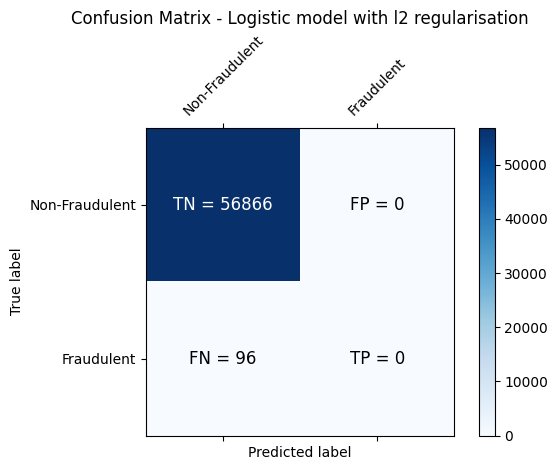

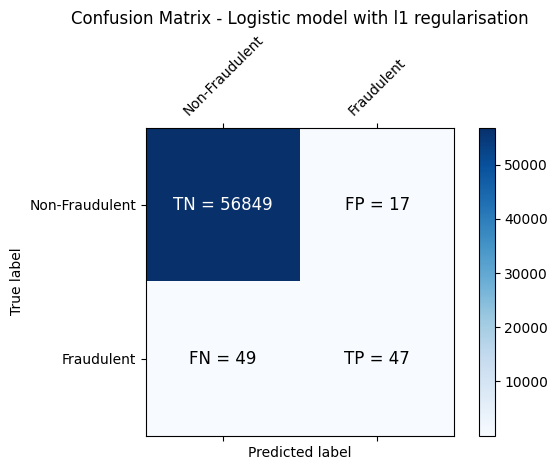

Accuracy of Logistic model with l2 regularisation: 0.9983146659176293
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.00      0.00      0.00        96

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962

Accuracy of Logistic model with l1 regularisation: 0.9988413328183702
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.73      0.49      0.59        96

    accuracy                           1.00     56962
   macro avg       0.87      0.74      0.79     56962
weighted avg       1.00      1.00      1.00     56962

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


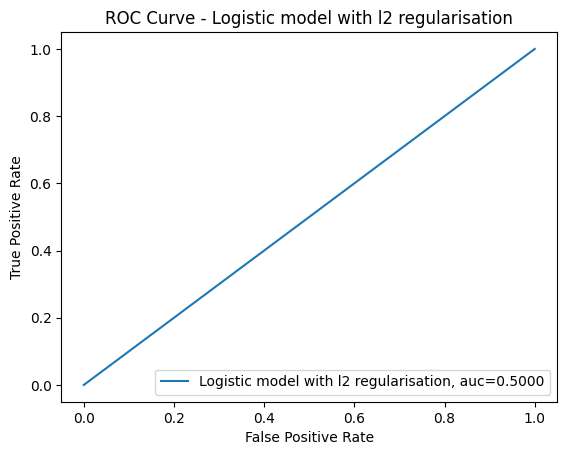

l1 roc_value: 0.9641399298 l1 threshold: 0.0092244017 ROC for the test dataset 96.4%


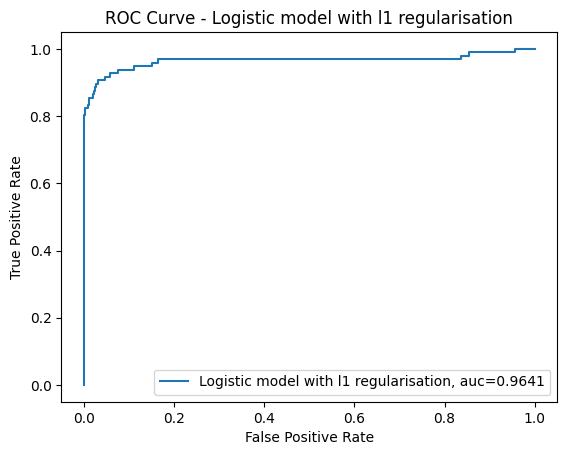

Time Taken by Model: --- 134.01104068756104 seconds ---
KNN Model


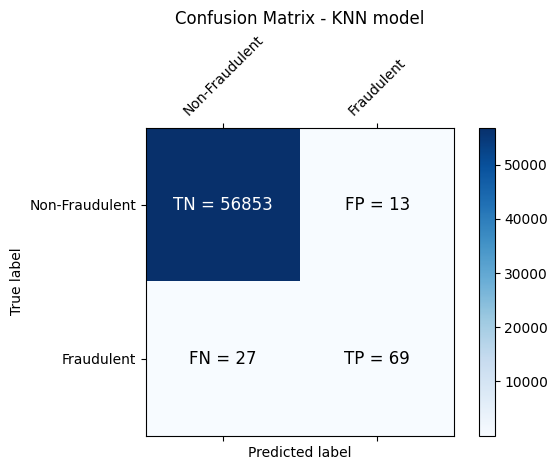

Accuracy of KNN model: 0.9992977774656788
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.84      0.72      0.78        96

    accuracy                           1.00     56962
   macro avg       0.92      0.86      0.89     56962
weighted avg       1.00      1.00      1.00     56962

KNN roc_value: 0.9008458481 KNN threshold: 0.2000000000 ROC for the test dataset 90.1%


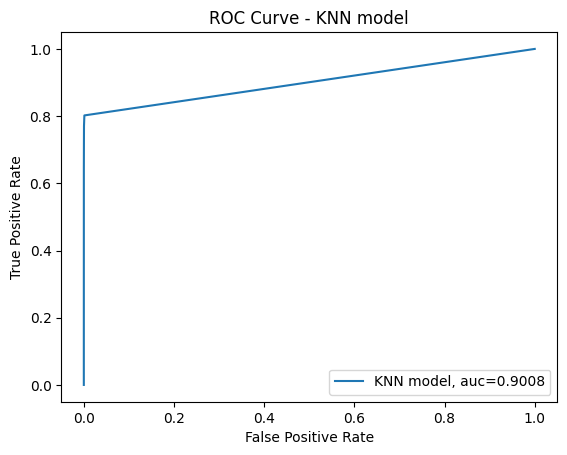

Time Taken by Model: --- 186.25312280654907 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


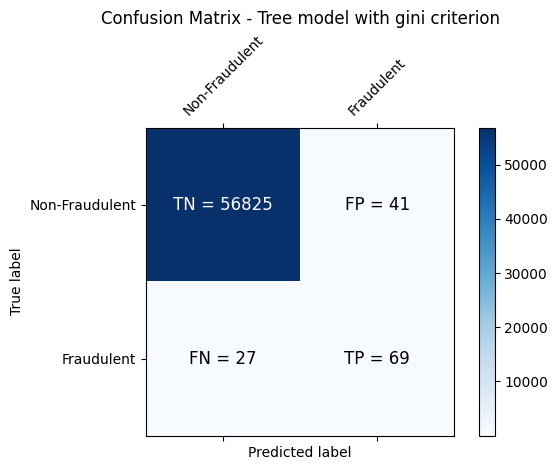

Accuracy of Tree model with gini criterion: 0.9988062216916541
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.63      0.72      0.67        96

    accuracy                           1.00     56962
   macro avg       0.81      0.86      0.83     56962
weighted avg       1.00      1.00      1.00     56962

Tree model with gini criterion roc_value: 0.8590145034 threshold: 1.0000000000 ROC for the test dataset 85.9%


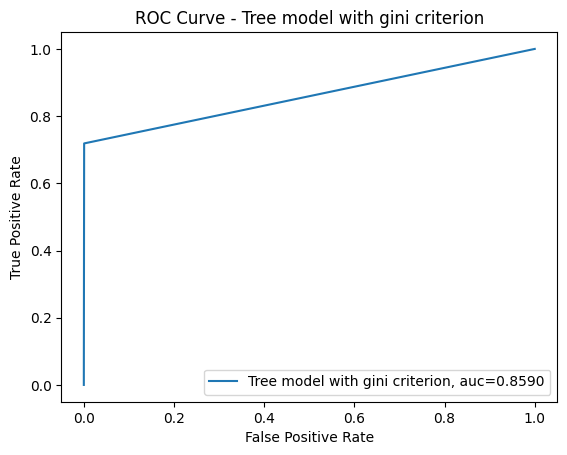

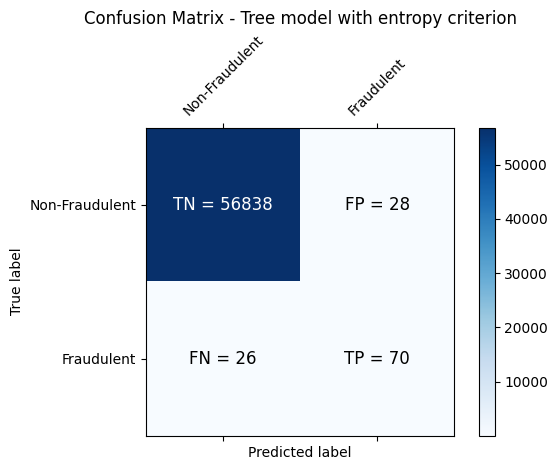

Accuracy of Tree model with entropy criterion: 0.9990519995786665
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.71      0.73      0.72        96

    accuracy                           1.00     56962
   macro avg       0.86      0.86      0.86     56962
weighted avg       1.00      1.00      1.00     56962

Tree model with entropy criterion roc_value: 0.8643371405 threshold: 1.0000000000 ROC for the test dataset 86.4%


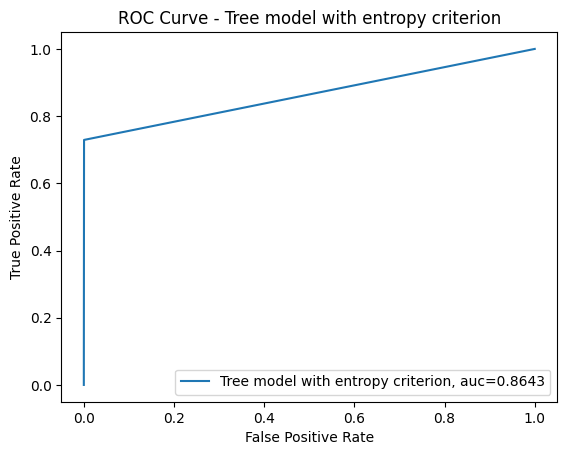

Time Taken by Model: --- 60.60329723358154 seconds ---
Random Forest Model


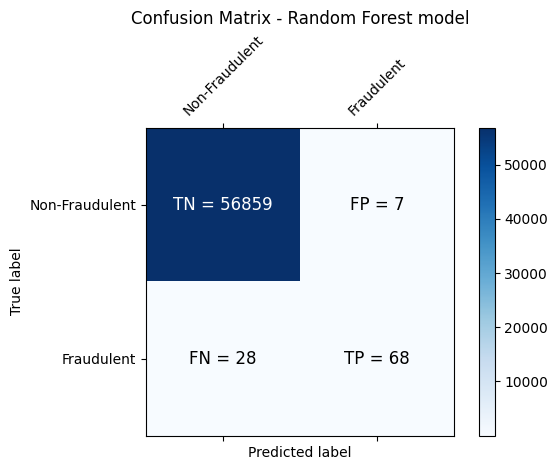

Accuracy of Random Forest model: 0.999385555282469
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.91      0.71      0.80        96

    accuracy                           1.00     56962
   macro avg       0.95      0.85      0.90     56962
weighted avg       1.00      1.00      1.00     56962

Random Forest roc_value: 0.9301616593 threshold: 0.0100000000 ROC for the test dataset 93.0%


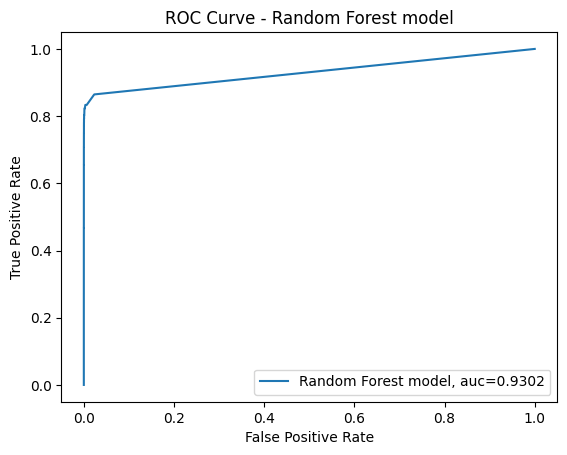

Time Taken by Model: --- 449.45584082603455 seconds ---
XGBoost Model


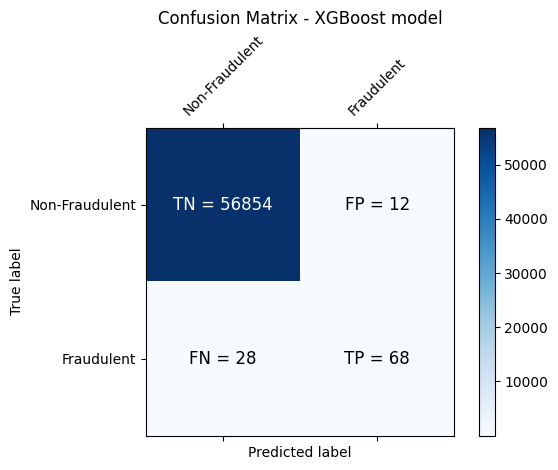

Accuracy of XGBoost model: 0.9992977774656788
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.85      0.71      0.77        96

    accuracy                           1.00     56962
   macro avg       0.92      0.85      0.89     56962
weighted avg       1.00      1.00      1.00     56962

XGBoost roc_value: 0.9277588981 threshold: 0.0000279914 ROC for the test dataset 92.8%


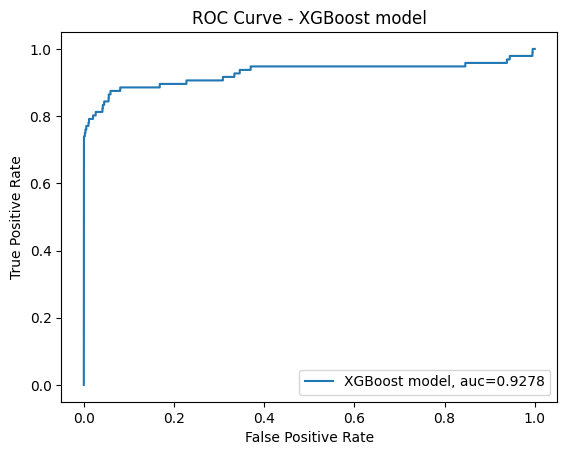

Time Taken by Model: --- 5.589016914367676 seconds ---
SVM Model with Sigmoid Kernel


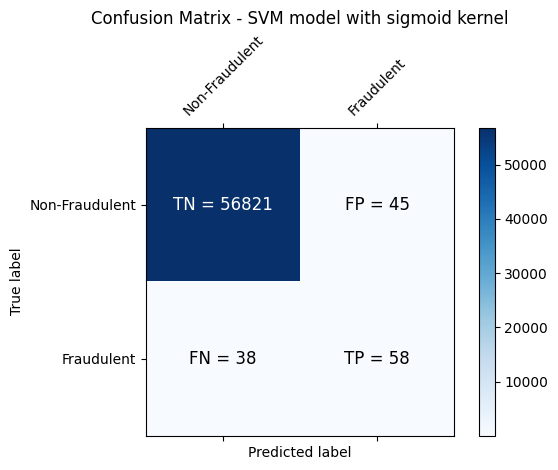

Accuracy of SVM model with sigmoid kernel: 0.9985428882412837
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.56      0.60      0.58        96

    accuracy                           1.00     56962
   macro avg       0.78      0.80      0.79     56962
weighted avg       1.00      1.00      1.00     56962

SVM roc_value: 0.8882665682 SVM threshold: 0.0010272162 ROC for the test dataset 88.8%


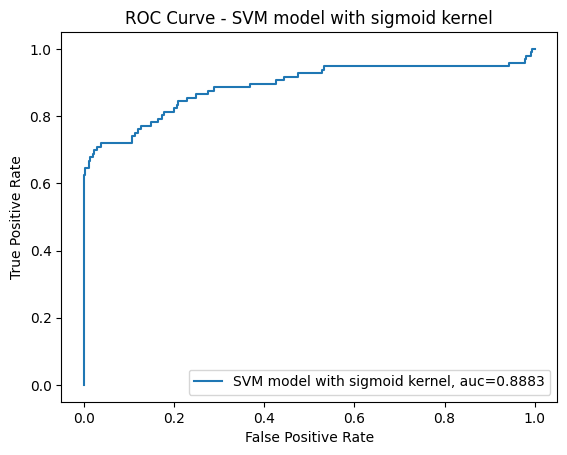

Time Taken by Model: --- 130.0273950099945 seconds ---


In [66]:
DataImabalance = "Power Transformer"
df_Results = run_all_models(df_Results, DataImabalance, X_train_pt_df, y_train, X_test_pt_df, y_test)

In [67]:
df_Results.head()

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000


#### 4.3 Utilize RepeatedKFold for enhanced cross-validation

In [68]:
# A function to perfrom RepeatedKFold and check the results
rkf = RepeatedKFold(n_splits=5, n_repeats=10, random_state=None)
# X is the feature set and y is the target
for train_index, test_index in rkf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_cv, y_test_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [     0      1      3 ... 284801 284804 284806] TEST: [     2     17     19 ... 284802 284803 284805]
TRAIN: [     0      1      2 ... 284803 284805 284806] TEST: [     3      7      8 ... 284800 284801 284804]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     5      6     10 ... 284785 284790 284796]
TRAIN: [     0      2      3 ... 284803 284804 284805] TEST: [     1      9     13 ... 284792 284795 284806]
TRAIN: [     1      2      3 ... 284804 284805 284806] TEST: [     0      4     12 ... 284797 284798 284799]
TRAIN: [     0      1      2 ... 284803 284804 284805] TEST: [     3      9     10 ... 284793 284799 284806]
TRAIN: [     0      2      3 ... 284804 284805 284806] TEST: [     1      7     12 ... 284788 284794 284800]
TRAIN: [     0      1      3 ... 284800 284804 284806] TEST: [     2      4     11 ... 284802 284803 284805]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [     5      8     13 ... 284784 284795 284797]
TRAIN: [     1     

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

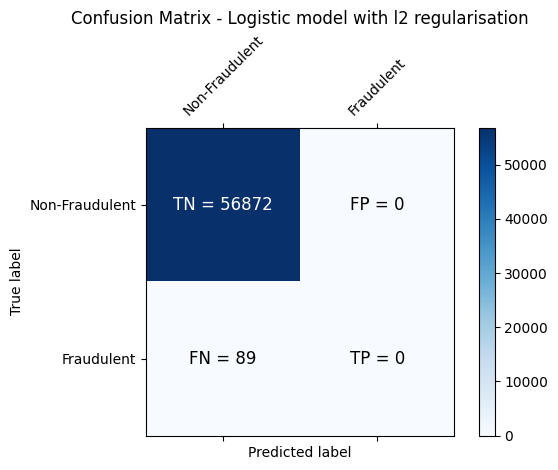

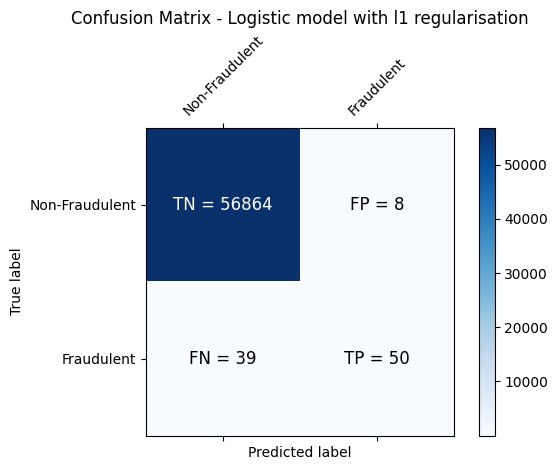

Accuracy of Logistic model with l2 regularisation: 0.9984375274310493
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.00      0.00      0.00        89

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

Accuracy of Logistic model with l1 regularisation: 0.9991748740366215
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.86      0.56      0.68        89

    accuracy                           1.00     56961
   macro avg       0.93      0.78      0.84     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


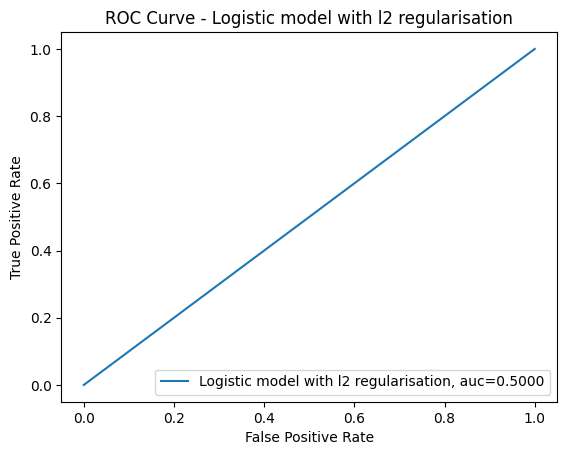

l1 roc_value: 0.9109472721 l1 threshold: 0.0322350412 ROC for the test dataset 91.1%


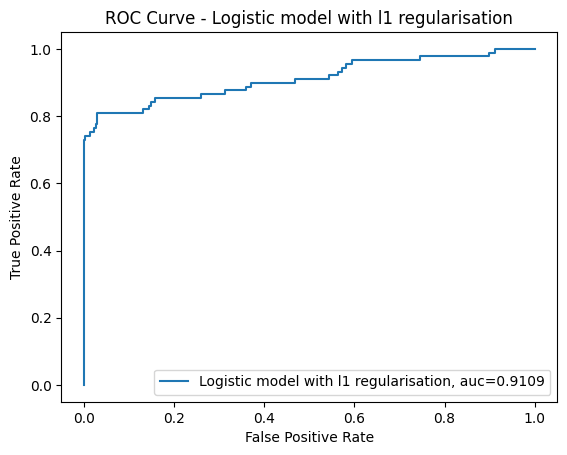

Time Taken by Model: --- 143.64391493797302 seconds ---
KNN Model


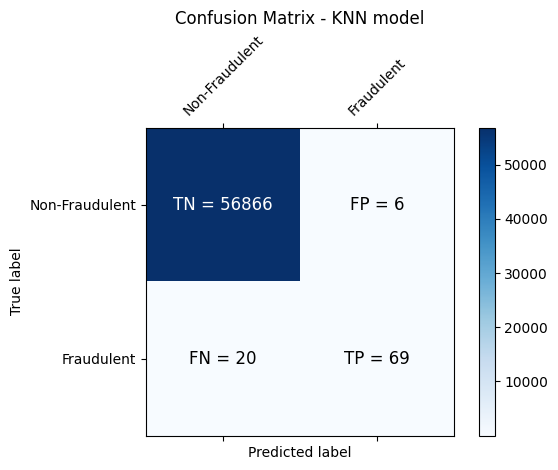

Accuracy of KNN model: 0.9995435473394076
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.92      0.78      0.84        89

    accuracy                           1.00     56961
   macro avg       0.96      0.89      0.92     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.9212425182 KNN threshold: 0.2000000000 ROC for the test dataset 92.1%


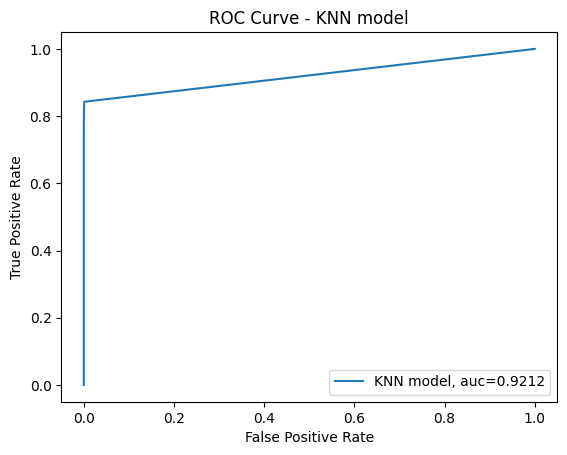

Time Taken by Model: --- 188.47050976753235 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


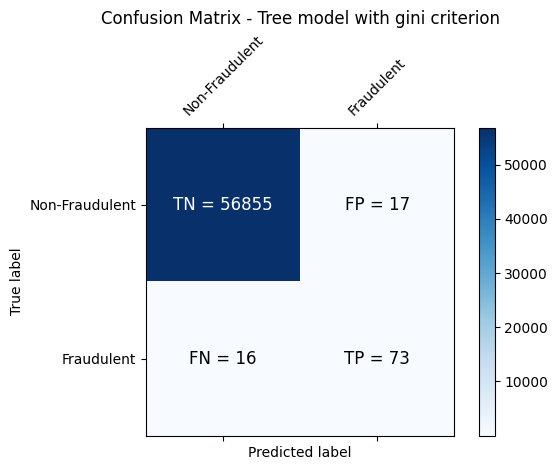

Accuracy of Tree model with gini criterion: 0.999420656238479
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.81      0.82      0.82        89

    accuracy                           1.00     56961
   macro avg       0.91      0.91      0.91     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with gini criterion roc_value: 0.9099629011 threshold: 1.0000000000 ROC for the test dataset 91.0%


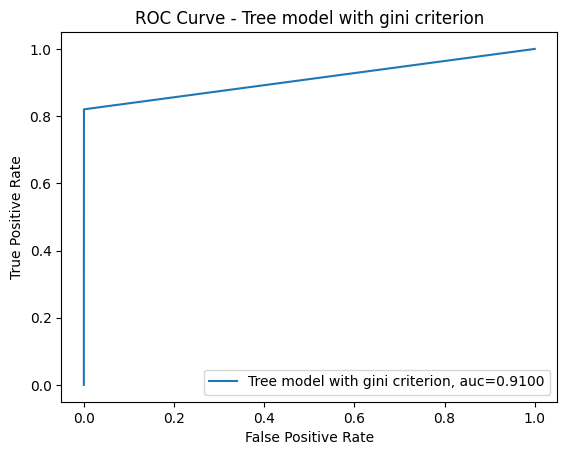

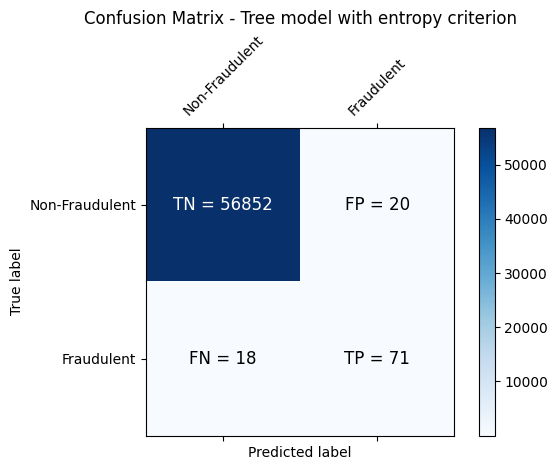

Accuracy of Tree model with entropy criterion: 0.9993328768806727
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.78      0.80      0.79        89

    accuracy                           1.00     56961
   macro avg       0.89      0.90      0.89     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with entropy criterion roc_value: 0.8987005710 threshold: 1.0000000000 ROC for the test dataset 89.9%


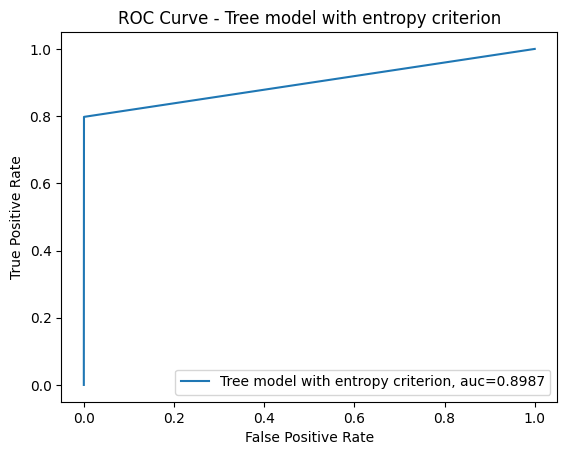

Time Taken by Model: --- 62.82841157913208 seconds ---
Random Forest Model


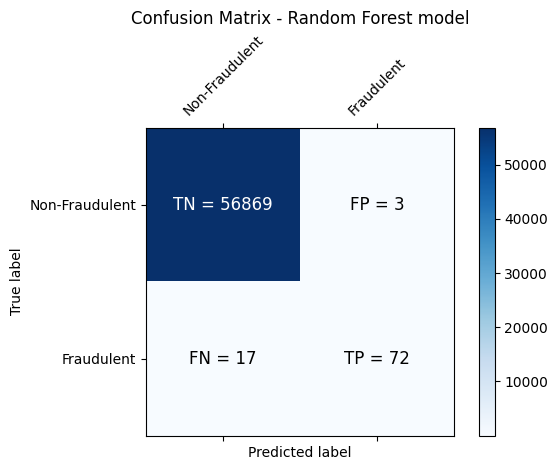

Accuracy of Random Forest model: 0.9996488825687752
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.96      0.81      0.88        89

    accuracy                           1.00     56961
   macro avg       0.98      0.90      0.94     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9478352531 threshold: 0.0200000000 ROC for the test dataset 94.8%


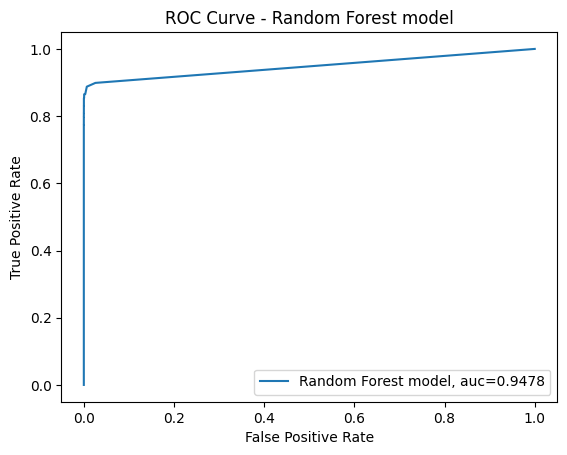

Time Taken by Model: --- 444.378778219223 seconds ---
XGBoost Model


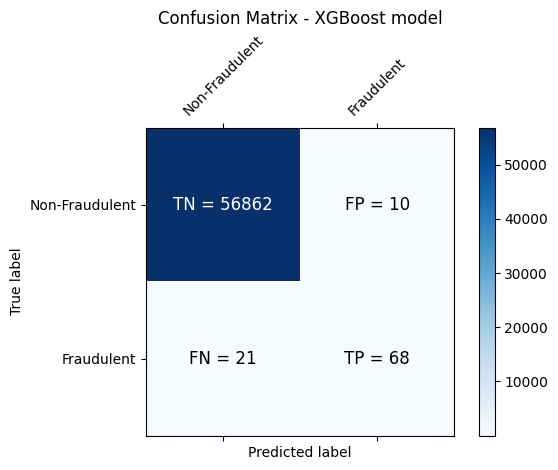

Accuracy of XGBoost model: 0.9994557679816014
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.87      0.76      0.81        89

    accuracy                           1.00     56961
   macro avg       0.94      0.88      0.91     56961
weighted avg       1.00      1.00      1.00     56961

XGBoost roc_value: 0.9534631090 threshold: 0.0000760293 ROC for the test dataset 95.3%


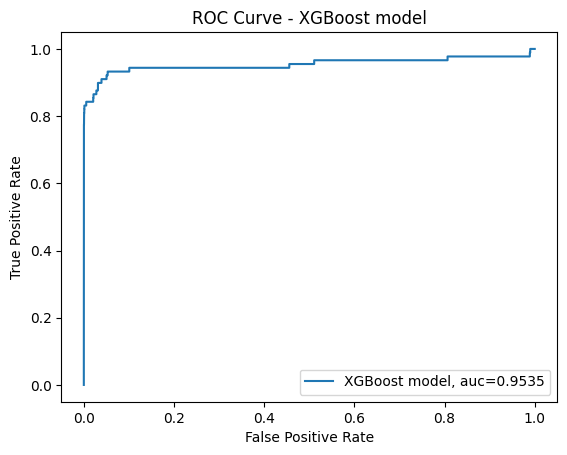

Time Taken by Model: --- 5.037465572357178 seconds ---
SVM Model with Sigmoid Kernel


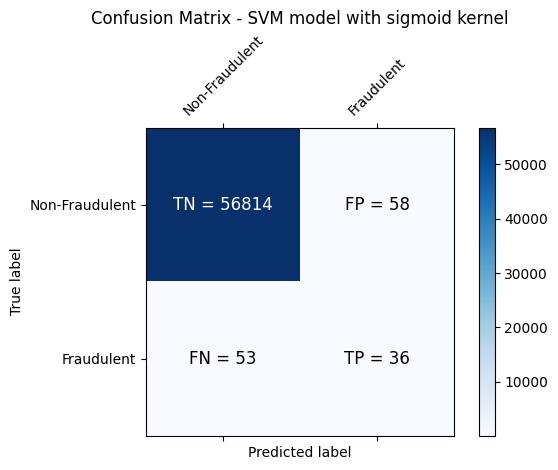

Accuracy of SVM model with sigmoid kernel: 0.9980512982567019
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56872
           1       0.38      0.40      0.39        89

    accuracy                           1.00     56961
   macro avg       0.69      0.70      0.70     56961
weighted avg       1.00      1.00      1.00     56961

SVM roc_value: 0.9289354292 SVM threshold: 0.0008767791 ROC for the test dataset 92.9%


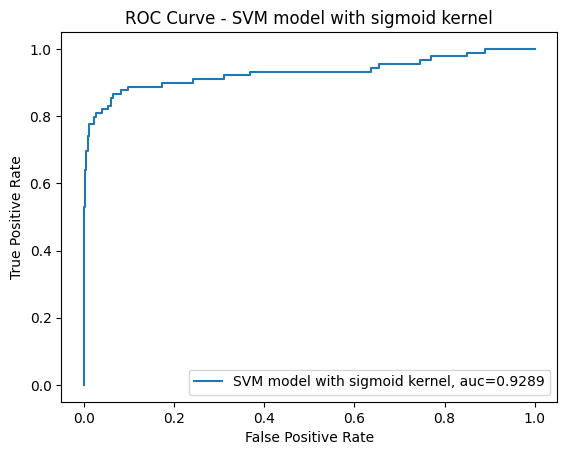

Time Taken by Model: --- 214.0997817516327 seconds ---


In [69]:
DataImabalance = "RepeatedKFold Cross Validation"
df_Results = run_all_models(df_Results, DataImabalance, X_train_cv, y_train_cv, X_test_cv, y_test_cv)

In [70]:
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


#### XGBoost has delivered the best performance, achieving a ROC value of 0.980732 using Repeated KFold cross-validation.

In [71]:
# Evaluate XGboost model

# Fit the model on training data
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_train_cv, y_train_cv)

# Create a DataFrame with feature importances
coefficients = pd.DataFrame({
    'Feature': X.columns,
    'feature_importances': XGBmodel.feature_importances_
})

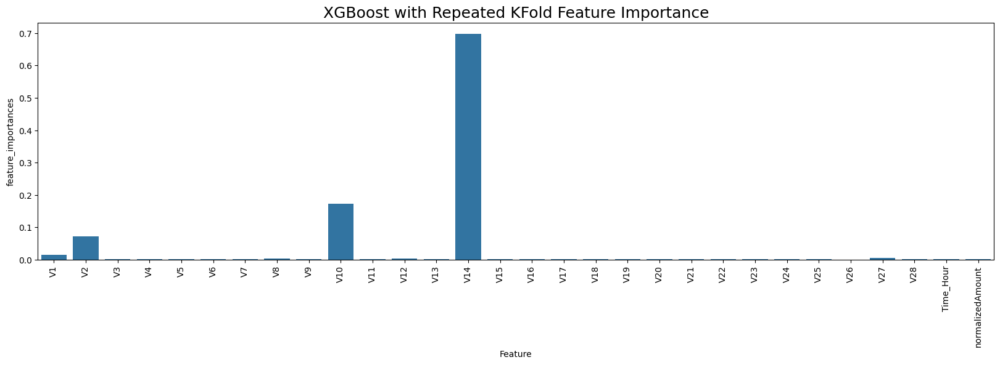

In [72]:
# Plot feature importances
plt.figure(figsize=(20, 5))
sns.barplot(x='Feature', y='feature_importances', data=coefficients)
plt.title("XGBoost with Repeated KFold Feature Importance", fontsize=18)
plt.xticks(rotation=90)
plt.show()

#### 4.4 Conduct cross-validation using StratifiedKFold

In [73]:
# Initialize StratifiedKFold with 5 splits
skf = StratifiedKFold(n_splits=5, random_state=None)

# X is the feature set and y is the target
for train_index, test_index in skf.split(X,y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_SKF_cv, X_test_SKF_cv = X.iloc[train_index], X.iloc[test_index]
    y_train_SKF_cv, y_test_SKF_cv = y.iloc[train_index], y.iloc[test_index]

TRAIN: [ 30473  30496  31002 ... 284804 284805 284806] TEST: [    0     1     2 ... 57017 57018 57019]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 30473  30496  31002 ... 113964 113965 113966]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [ 81609  82400  83053 ... 170946 170947 170948]
TRAIN: [     0      1      2 ... 284804 284805 284806] TEST: [150654 150660 150661 ... 227866 227867 227868]
TRAIN: [     0      1      2 ... 227866 227867 227868] TEST: [212516 212644 213092 ... 284804 284805 284806]


### Similarly explore other algorithms by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

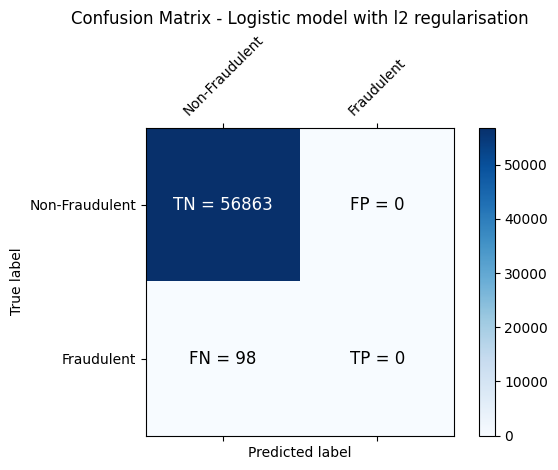

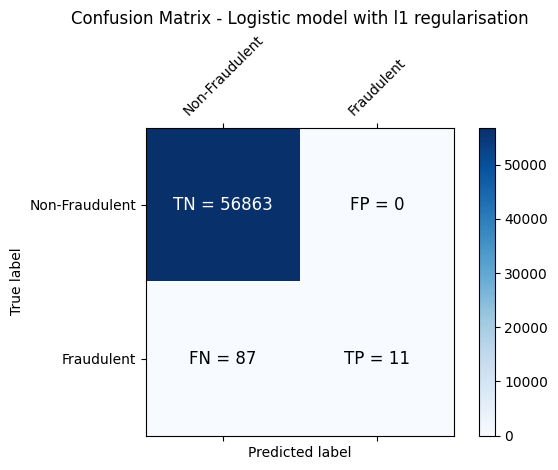

Accuracy of Logistic model with l2 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

Accuracy of Logistic model with l1 regularisation: 0.9984726391741718
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       1.00      0.11      0.20        98

    accuracy                           1.00     56961
   macro avg       1.00      0.56      0.60     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


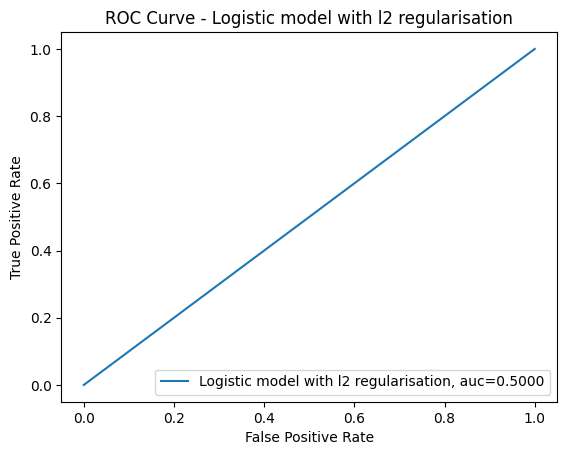

l1 roc_value: 0.9457069570 l1 threshold: 0.0022501089 ROC for the test dataset 94.6%


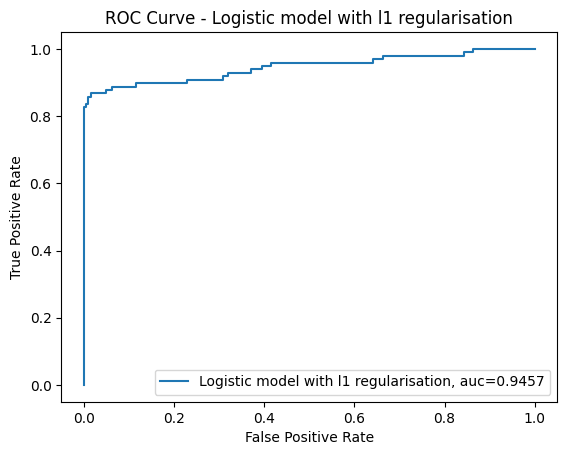

Time Taken by Model: --- 136.24989676475525 seconds ---
KNN Model


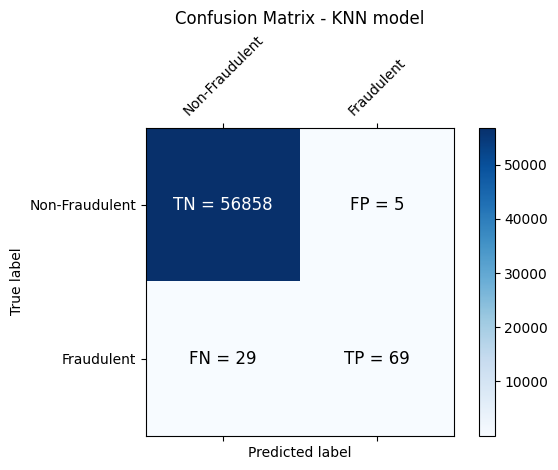

Accuracy of KNN model: 0.9994031003669177
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.93      0.70      0.80        98

    accuracy                           1.00     56961
   macro avg       0.97      0.85      0.90     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.8874125314 KNN threshold: 0.2000000000 ROC for the test dataset 88.7%


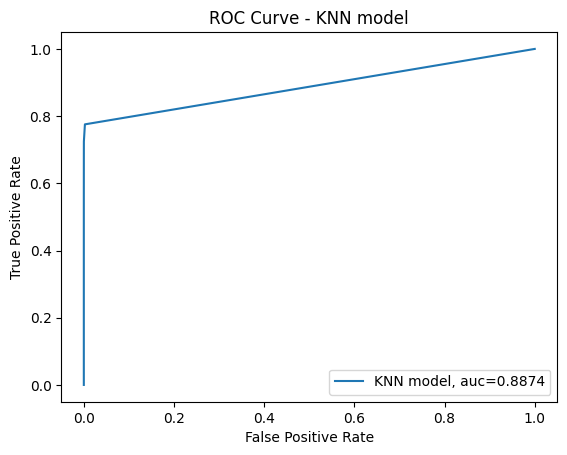

Time Taken by Model: --- 184.4340536594391 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


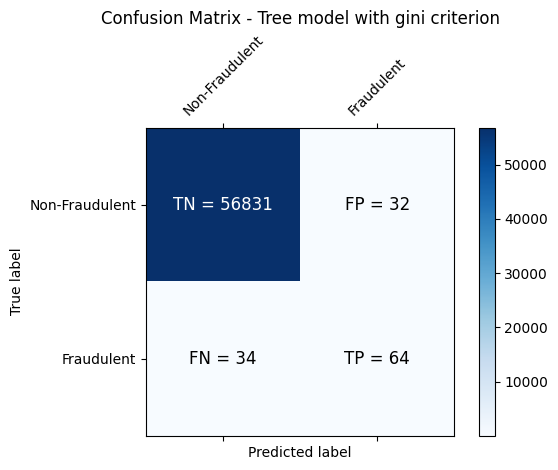

Accuracy of Tree model with gini criterion: 0.998841312476958
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.67      0.65      0.66        98

    accuracy                           1.00     56961
   macro avg       0.83      0.83      0.83     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with gini criterion roc_value: 0.8262492342 threshold: 1.0000000000 ROC for the test dataset 82.6%


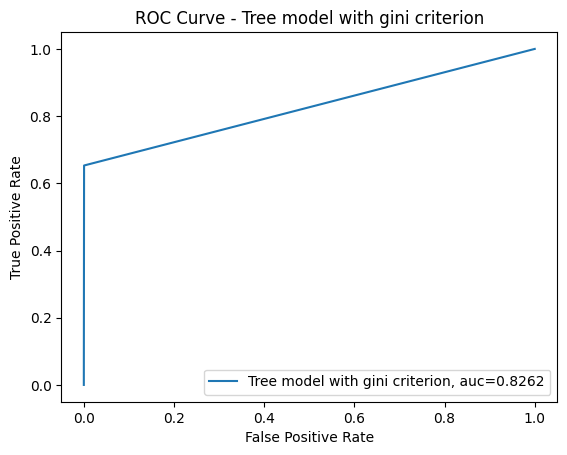

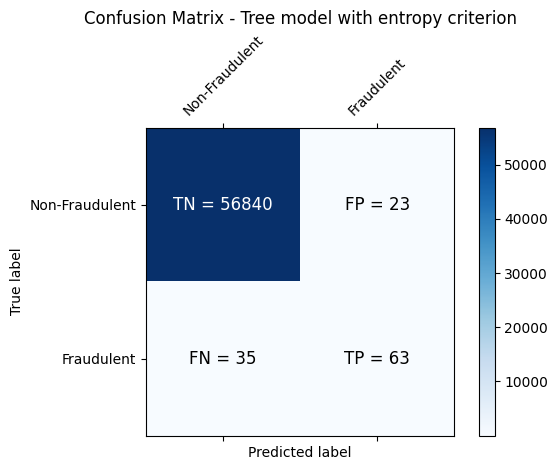

Accuracy of Tree model with entropy criterion: 0.9989817594494479
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.73      0.64      0.68        98

    accuracy                           1.00     56961
   macro avg       0.87      0.82      0.84     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with entropy criterion roc_value: 0.8212263310 threshold: 1.0000000000 ROC for the test dataset 82.1%


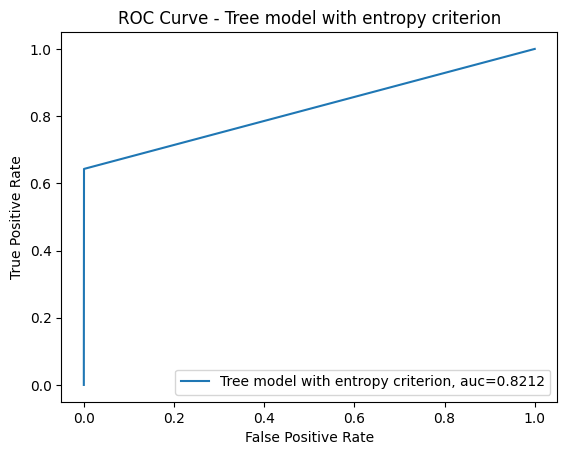

Time Taken by Model: --- 57.11179184913635 seconds ---
Random Forest Model


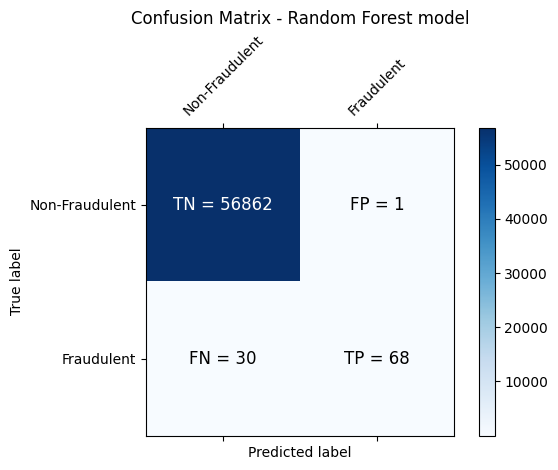

Accuracy of Random Forest model: 0.9994557679816014
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.69      0.81        98

    accuracy                           1.00     56961
   macro avg       0.99      0.85      0.91     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9463683210 threshold: 0.0100000000 ROC for the test dataset 94.6%


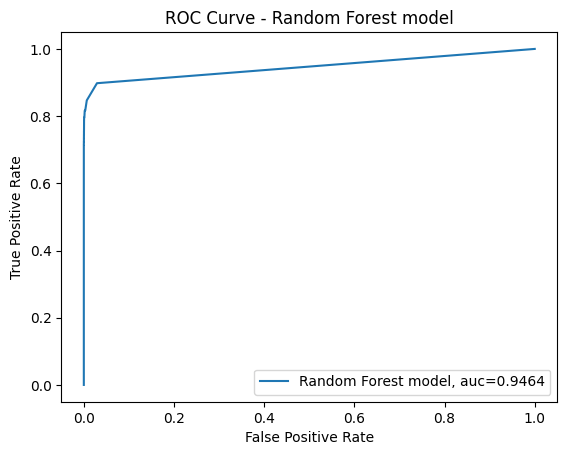

Time Taken by Model: --- 411.5210175514221 seconds ---
XGBoost Model


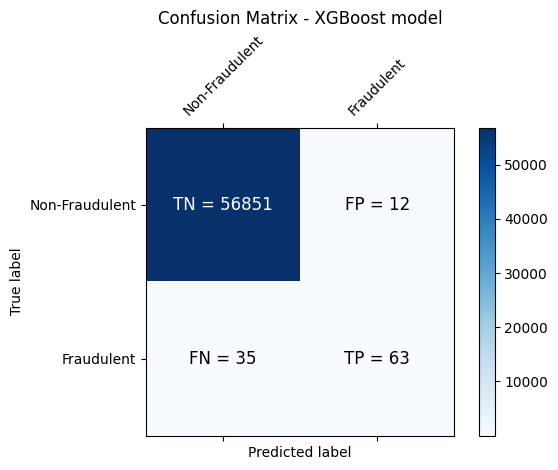

Accuracy of XGBoost model: 0.9991748740366215
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.84      0.64      0.73        98

    accuracy                           1.00     56961
   macro avg       0.92      0.82      0.86     56961
weighted avg       1.00      1.00      1.00     56961

XGBoost roc_value: 0.9192701613 threshold: 0.0000796363 ROC for the test dataset 91.9%


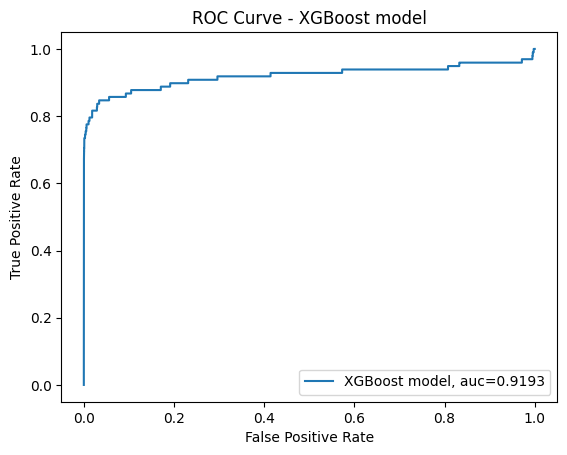

Time Taken by Model: --- 5.393787622451782 seconds ---
SVM Model with Sigmoid Kernel


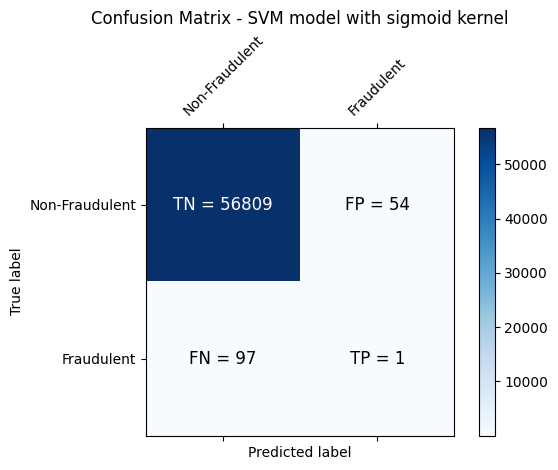

Accuracy of SVM model with sigmoid kernel: 0.9973490633942522
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.02      0.01      0.01        98

    accuracy                           1.00     56961
   macro avg       0.51      0.50      0.51     56961
weighted avg       1.00      1.00      1.00     56961

SVM roc_value: 0.9030726196 SVM threshold: 0.0008806459 ROC for the test dataset 90.3%


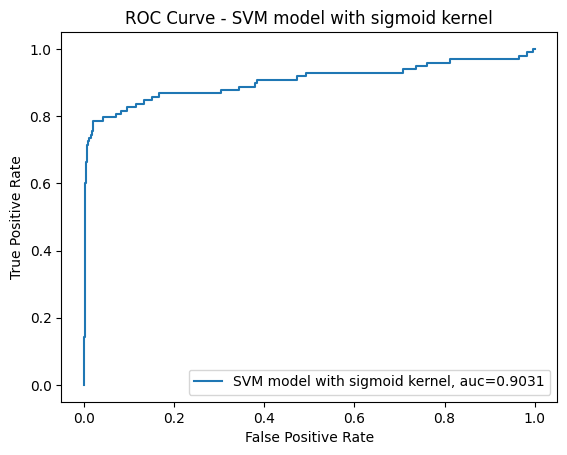

Time Taken by Model: --- 184.0603597164154 seconds ---


In [74]:
DataImabalance = "StratifiedKFold Cross Validation"
df_Results = run_all_models(df_Results, DataImabalance, X_train_SKF_cv, y_train_SKF_cv, X_test_SKF_cv, y_test_SKF_cv)

In [75]:
# Check the results
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


- The results indicate that Logistic Regression with L2 Regularization yielded the best performance for StratifiedKFold cross-validation

#### 4.5 Proceed with the Best Performing Model
- Apply the optimal hyperparameters to the model
- Make predictions on the test dataset

In [76]:
# Logistic Regression

# Define hyperparameters and cross-validation strategy
num_C = np.logspace(-10, 10, 20)
cv_num = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize and fit Logistic Regression with L2 regularization
searchCV_l2 = LogisticRegressionCV(
    Cs=num_C,
    penalty='l2',
    scoring='roc_auc',
    cv=cv_num,
    random_state=42,
    max_iter=10000,
    fit_intercept=True,
    solver='newton-cg',
    tol=1e-4
)

searchCV_l2.fit(X_train, y_train)

# Display results
print('Max AUC-ROC for L2:', searchCV_l2.scores_[1].mean(axis=0).max())
print("Parameters for L2 regularization")
print("Coefficients:", searchCV_l2.coef_)
print("Intercept:", searchCV_l2.intercept_)

# Predict on the test dataset
y_pred_l2 = searchCV_l2.predict(X_test)
y_pred_probs_l2 = searchCV_l2.predict_proba(X_test)[:, 1]

# Calculate accuracy and ROC-AUC
accuracy_l2 = accuracy_score(y_test, y_pred_l2)
l2_roc_value = roc_auc_score(y_test, y_pred_probs_l2)

print(f"Accuracy of Logistic model with L2 regularization: {accuracy_l2}")
print(f"L2 ROC-AUC value: {l2_roc_value}")

# Calculate optimal threshold
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs_l2)
optimal_threshold = thresholds[np.argmax(tpr - fpr)]
print(f"L2 optimal threshold: {optimal_threshold}")

Max AUC-ROC for L2: 0.9854159231088808
Parameters for L2 regularization
Coefficients: [[ 3.04531939e-02  9.88317701e-03 -8.69169113e-02  3.17022203e-01
   9.06197211e-02 -4.58196446e-02 -1.35432319e-02 -1.51526218e-01
  -1.14593392e-01 -2.25040462e-01  1.43217780e-01 -2.32204253e-01
  -6.55364211e-02 -4.56979648e-01 -2.65676480e-02 -1.19922318e-01
  -1.14829907e-01 -3.94388593e-04  1.61795613e-02 -9.20785437e-03
   6.84691536e-02  4.20582520e-02 -6.98895372e-03 -1.85844882e-02
  -1.35055913e-02  6.15942337e-03 -7.08235462e-03 -2.75032785e-03
   1.93950988e-02  3.30043155e-02]]
Intercept: [-7.95889839]
Accuracy of Logistic model with L2 regularization: 0.9989291106351603
L2 ROC-AUC value: 0.9759458273250566
L2 optimal threshold: 0.0011432046662963556


In [77]:
# Coefficients
searchCV_l2.coef_

array([[ 3.04531939e-02,  9.88317701e-03, -8.69169113e-02,
         3.17022203e-01,  9.06197211e-02, -4.58196446e-02,
        -1.35432319e-02, -1.51526218e-01, -1.14593392e-01,
        -2.25040462e-01,  1.43217780e-01, -2.32204253e-01,
        -6.55364211e-02, -4.56979648e-01, -2.65676480e-02,
        -1.19922318e-01, -1.14829907e-01, -3.94388593e-04,
         1.61795613e-02, -9.20785437e-03,  6.84691536e-02,
         4.20582520e-02, -6.98895372e-03, -1.85844882e-02,
        -1.35055913e-02,  6.15942337e-03, -7.08235462e-03,
        -2.75032785e-03,  1.93950988e-02,  3.30043155e-02]])

In [78]:
# Create a DataFrame with feature names and their corresponding importance coefficients
coefficients = pd.DataFrame({
    'Feature': X.columns,
    'Importance Coefficient': searchCV_l2.coef_.flatten()
})

coefficients

,Feature,Importance Coefficient
0,V1,0.030453
1,V2,0.009883
2,V3,-0.086917
3,V4,0.317022
4,V5,0.090620
5,V6,-0.045820
6,V7,-0.013543
7,V8,-0.151526
8,V9,-0.114593
9,V10,-0.225040


In [79]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=coefficients)

https://docs.google.com/spreadsheets/d/1daU-eP_htdml45FfPPwxt8M67qgoyMM_a6X98zzQ7m0/edit#gid=0


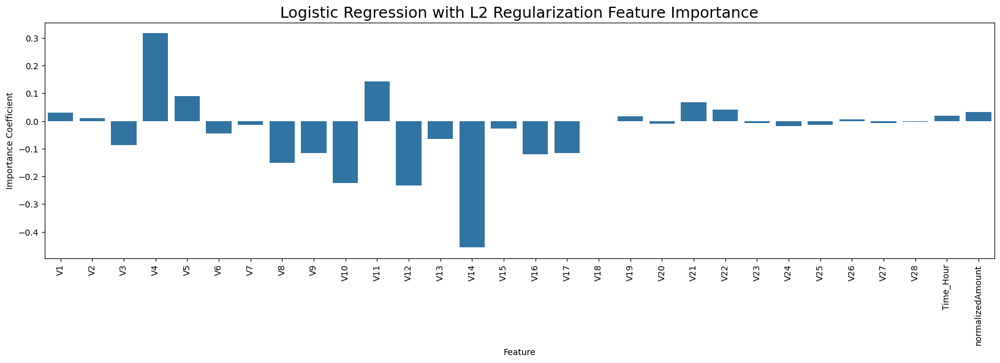

In [80]:
# Plot feature importances
plt.figure(figsize=(20, 5))
sns.barplot(x='Feature', y='Importance Coefficient', data=coefficients)
plt.title("Logistic Regression with L2 Regularization Feature Importance", fontsize=18)
plt.xticks(rotation=90)  # Rotate feature names for better readability
plt.show()

- From the above results for the coefficients it is evident that V10, V12, V14 have a negative impact on the predictions, whereas V4, V5, V11 have a positive impact.

#### Due to the extended processing time required for models utilizing oversampling techniques, we will explore the implementation of undersampling methods.

In [81]:
# Define and apply the undersampler in one step
RUS = RandomUnderSampler(sampling_strategy=0.5)
X_Under, y_Under = RUS.fit_resample(X_train, y_train)

# Create DataFrame directly from the resampled data
X_Under = pd.DataFrame(X_Under, columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

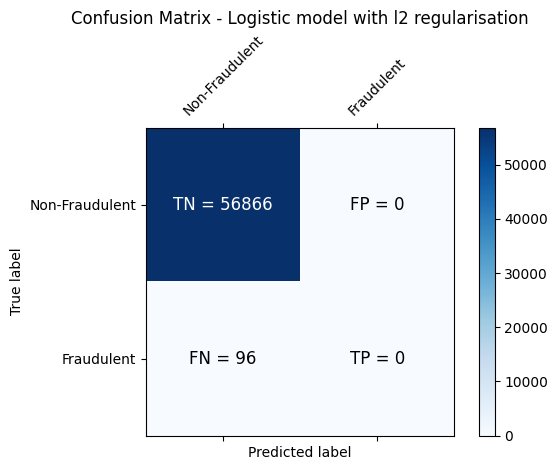

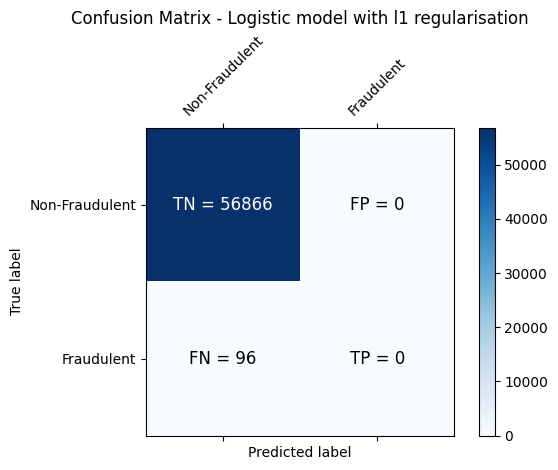

Accuracy of Logistic model with l2 regularisation: 0.9983146659176293
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.00      0.00      0.00        96

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962

Accuracy of Logistic model with l1 regularisation: 0.9983146659176293
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56866
           1       0.00      0.00      0.00        96

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


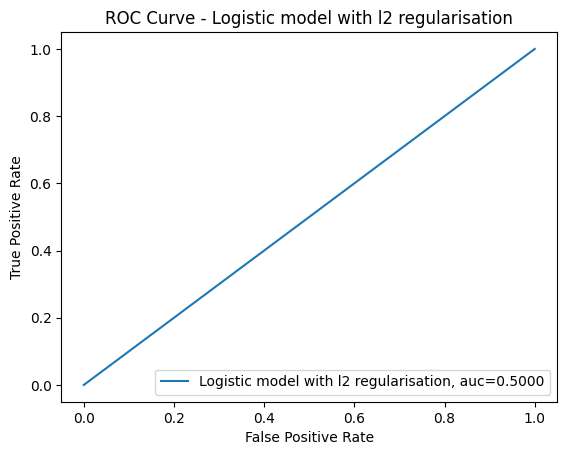

l1 roc_value: 0.5000000000 l1 threshold: inf ROC for the test dataset 50.0%


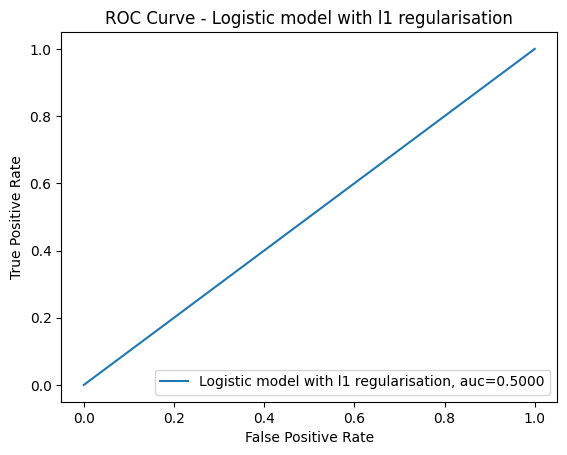

Time Taken by Model: --- 1.6687939167022705 seconds ---
KNN Model


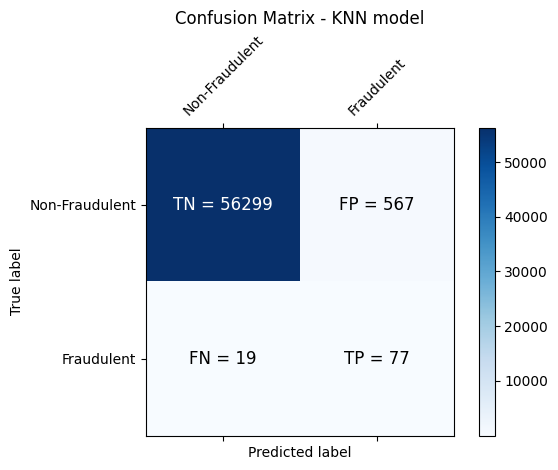

Accuracy of KNN model: 0.9897124398721955
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56866
           1       0.12      0.80      0.21        96

    accuracy                           0.99     56962
   macro avg       0.56      0.90      0.60     56962
weighted avg       1.00      0.99      0.99     56962

KNN roc_value: 0.9391345077 KNN threshold: 0.8000000000 ROC for the test dataset 93.9%


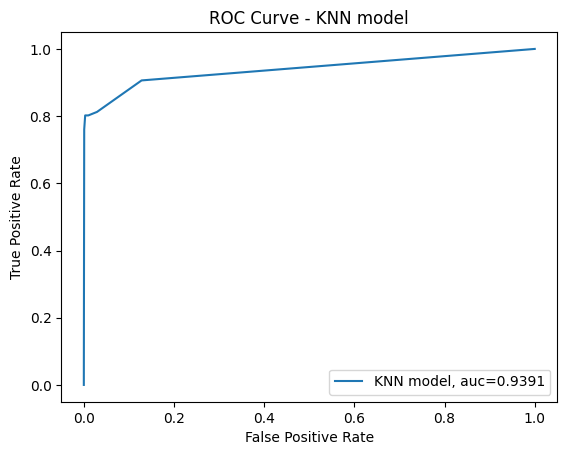

Time Taken by Model: --- 1.313443899154663 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


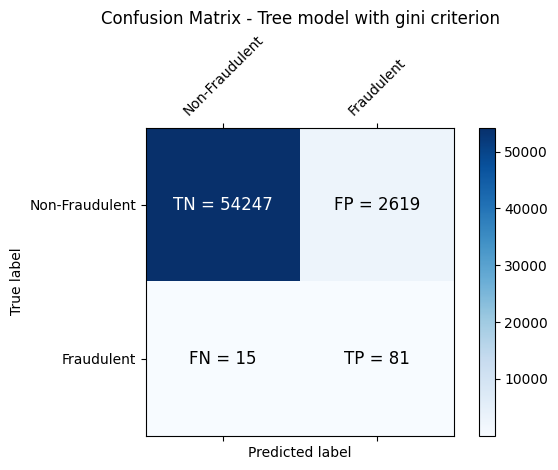

Accuracy of Tree model with gini criterion: 0.9537586461149539
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.95      0.98     56866
           1       0.03      0.84      0.06        96

    accuracy                           0.95     56962
   macro avg       0.51      0.90      0.52     56962
weighted avg       1.00      0.95      0.97     56962

Tree model with gini criterion roc_value: 0.8988471802 threshold: 1.0000000000 ROC for the test dataset 89.9%


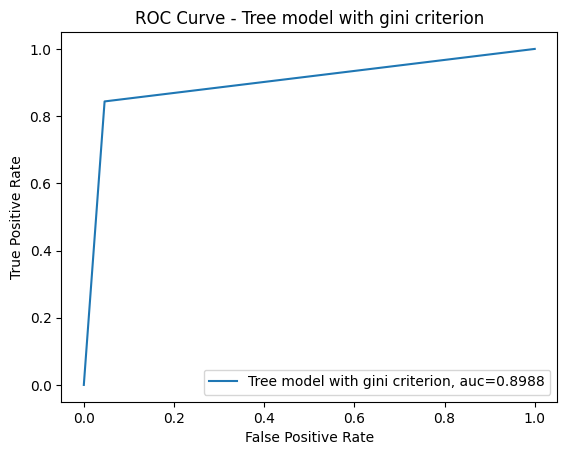

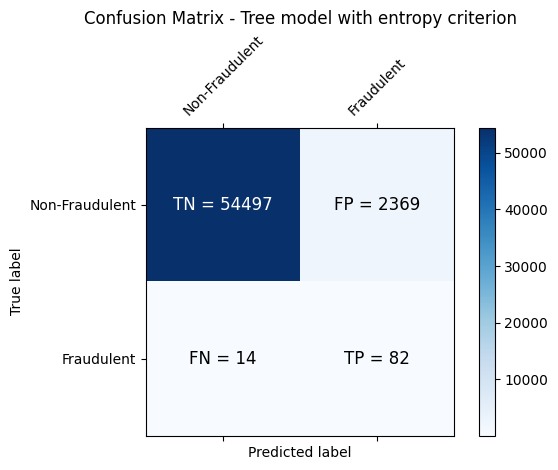

Accuracy of Tree model with entropy criterion: 0.9581650925178189
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     56866
           1       0.03      0.85      0.06        96

    accuracy                           0.96     56962
   macro avg       0.52      0.91      0.52     56962
weighted avg       1.00      0.96      0.98     56962

Tree model with entropy criterion roc_value: 0.9062536636 threshold: 1.0000000000 ROC for the test dataset 90.6%


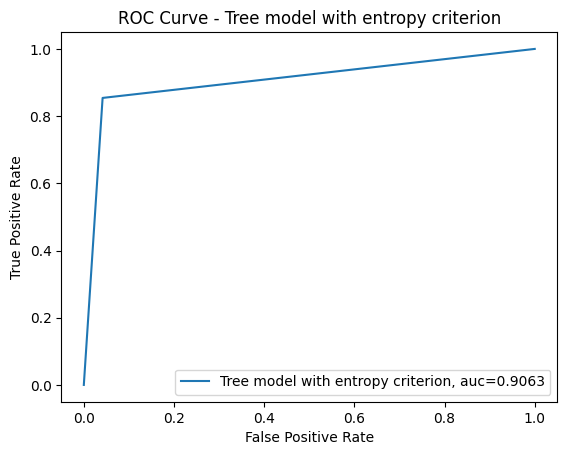

Time Taken by Model: --- 1.1863553524017334 seconds ---
Random Forest Model


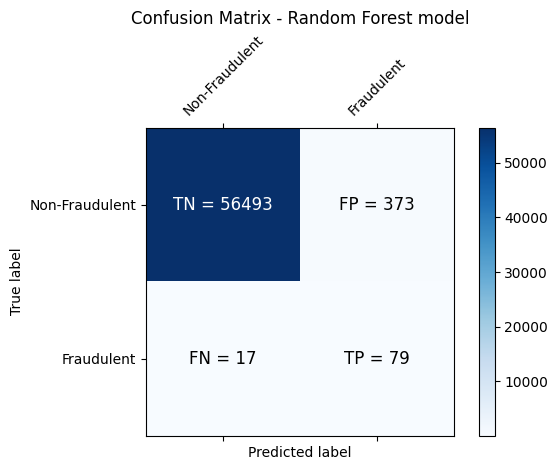

Accuracy of Random Forest model: 0.993153330290369
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56866
           1       0.17      0.82      0.29        96

    accuracy                           0.99     56962
   macro avg       0.59      0.91      0.64     56962
weighted avg       1.00      0.99      1.00     56962

Random Forest roc_value: 0.9782365744 threshold: 0.2000000000 ROC for the test dataset 97.8%


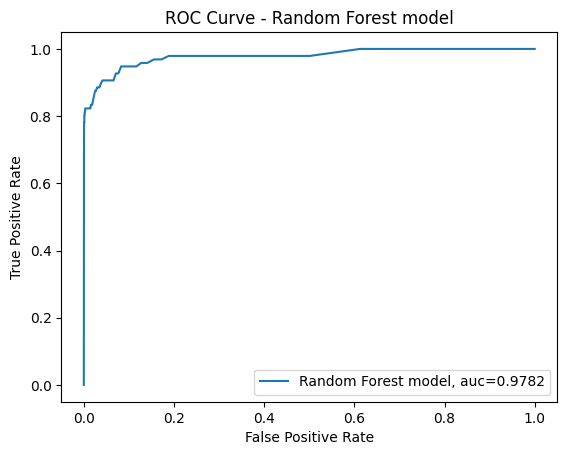

Time Taken by Model: --- 2.448028564453125 seconds ---
XGBoost Model


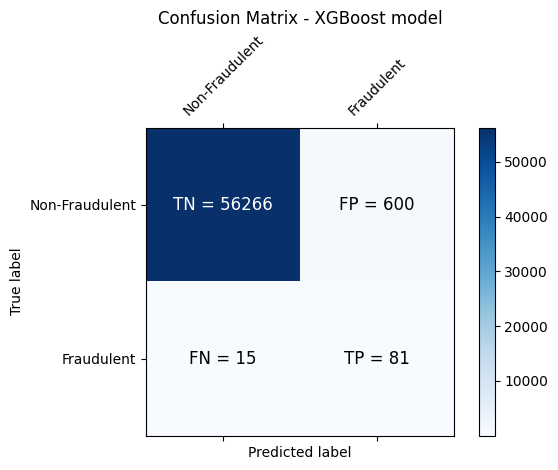

Accuracy of XGBoost model: 0.9892033285348126
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56866
           1       0.12      0.84      0.21        96

    accuracy                           0.99     56962
   macro avg       0.56      0.92      0.60     56962
weighted avg       1.00      0.99      0.99     56962

XGBoost roc_value: 0.9791882818 threshold: 0.0291003864 ROC for the test dataset 97.9%


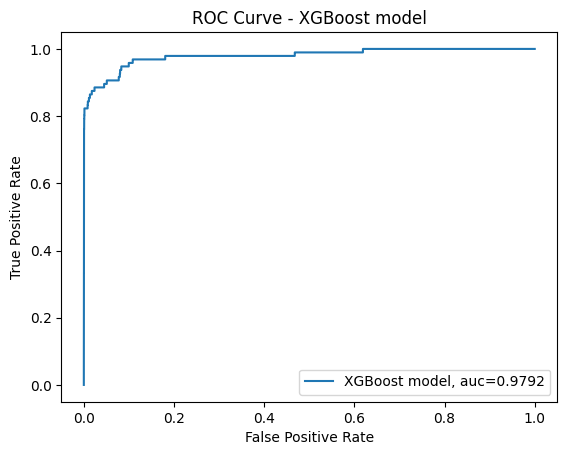

Time Taken by Model: --- 0.8280537128448486 seconds ---
SVM Model with Sigmoid Kernel


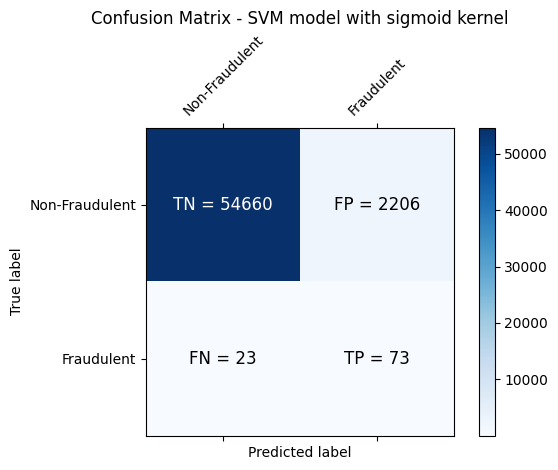

Accuracy of SVM model with sigmoid kernel: 0.9608686492749552
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     56866
           1       0.03      0.76      0.06        96

    accuracy                           0.96     56962
   macro avg       0.52      0.86      0.52     56962
weighted avg       1.00      0.96      0.98     56962

SVM roc_value: 0.9198047090 SVM threshold: 0.1995234427 ROC for the test dataset 92.0%


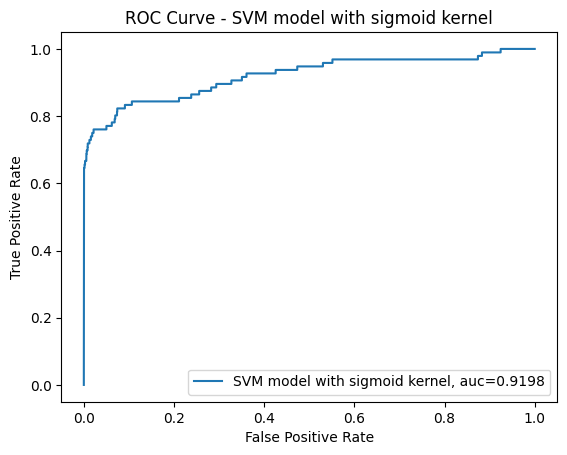

Time Taken by Model: --- 1.9829564094543457 seconds ---


In [82]:
DataImabalance = "Random Undersampling"
df_Results = run_all_models(df_Results, DataImabalance, X_Under, y_Under, X_test, y_test)

In [83]:
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


- Undersampling has notably enhanced the Random Forest model's performance

### 4.6 Model building with balancing Classes

##### Perform class balancing with :
- Random Oversampling
- SMOTE
- ADASYN

#### Implementing RandomOverSampler with StratifiedKFold Cross-Validation

### Handling Class Imbalance with Random Oversampling

#### Class Distribution Analysis
- First, we will display the class distribution before and after applying Random Oversampling.

#### Cross-Validation with StratifiedKFold
- Next, we will utilize StratifiedKFold cross-validation on the oversampled data to generate train and test datasets.

#### Model Training and Evaluation
- We will then train and evaluate the following models using the generated datasets:
  - Logistic Regression with L2 Regularization
  - Logistic Regression with L1 Regularization
  - K-Nearest Neighbors (KNN)
  - Decision Tree with Gini Criterion
  - Decision Tree with Entropy Criterion
  - Random Forest
  - XGBoost

#### SVM Consideration
- Although we considered using the Support Vector Machine (SVM) model, we decided against it due to its extensive computational requirements.

#### Model Comparison
- Finally, after obtaining the results from the aforementioned models, we will compare their performance and select the model that yields the best results with the Random Oversampling technique.


In [84]:
# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=5, random_state=None)

# Iterate through each fold
for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
    # Split the data into training and testing sets
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]

    # Apply RandomOverSampler
    ROS = RandomOverSampler(sampling_strategy=0.5)
    X_over, y_over = ROS.fit_resample(X_train, y_train)

#Create Dataframe for X_over
X_over = pd.DataFrame(data=X_over,   columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

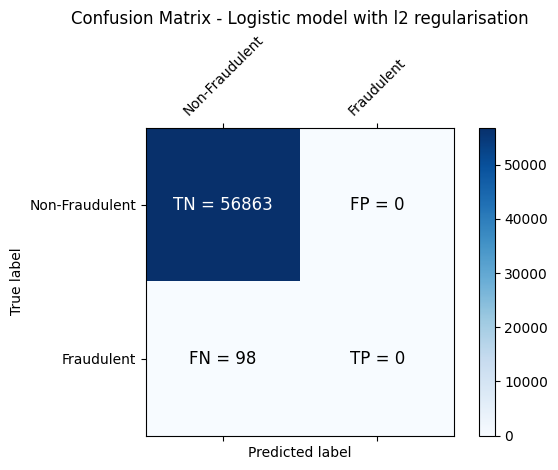

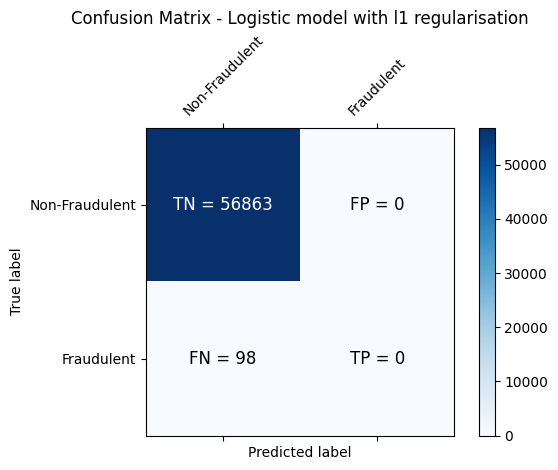

Accuracy of Logistic model with l2 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

Accuracy of Logistic model with l1 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


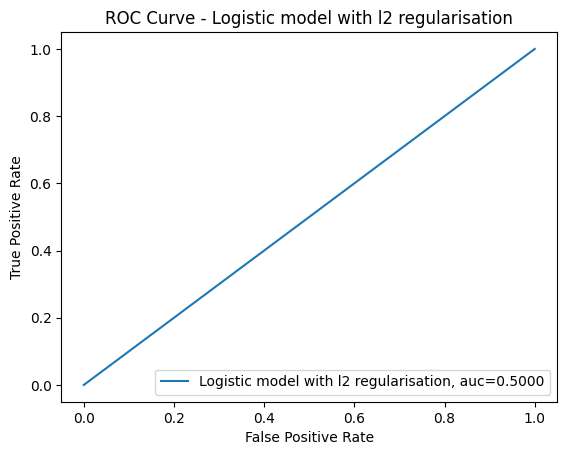

l1 roc_value: 0.5000000000 l1 threshold: inf ROC for the test dataset 50.0%


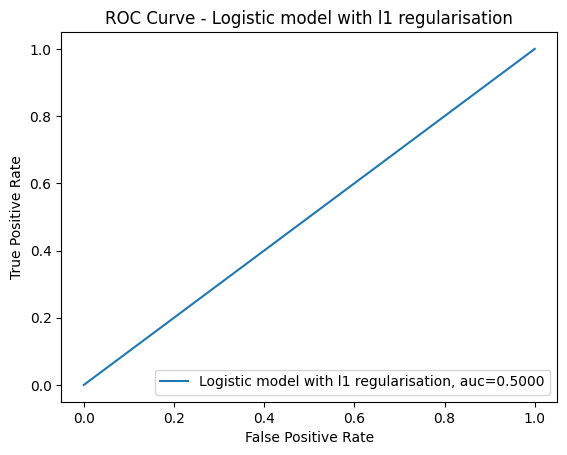

Time Taken by Model: --- 116.72673034667969 seconds ---
KNN Model


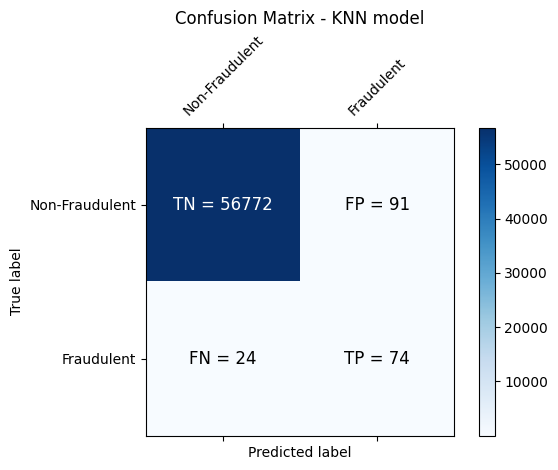

Accuracy of KNN model: 0.9979810747704569
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.45      0.76      0.56        98

    accuracy                           1.00     56961
   macro avg       0.72      0.88      0.78     56961
weighted avg       1.00      1.00      1.00     56961

KNN roc_value: 0.8872623316 KNN threshold: 0.2000000000 ROC for the test dataset 88.7%


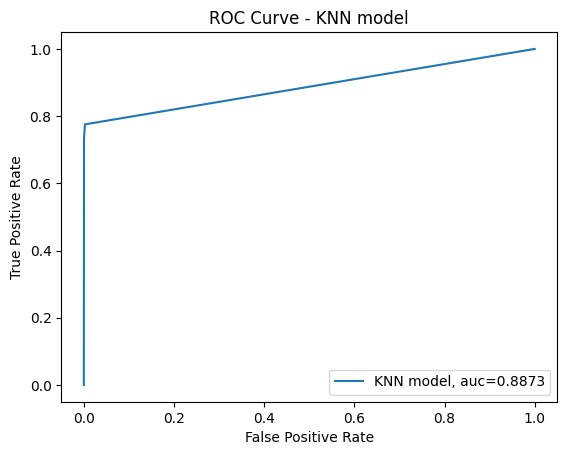

Time Taken by Model: --- 272.93489360809326 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


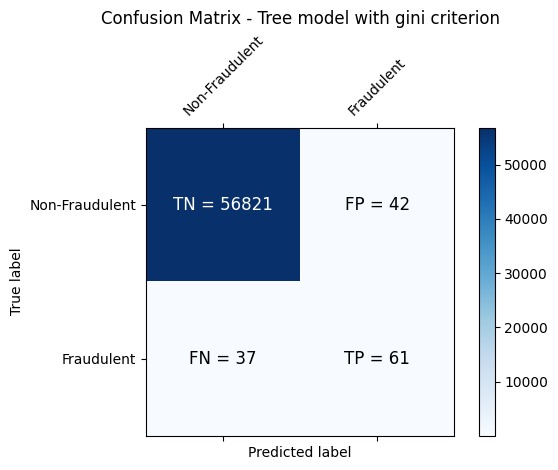

Accuracy of Tree model with gini criterion: 0.9986130861466618
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.59      0.62      0.61        98

    accuracy                           1.00     56961
   macro avg       0.80      0.81      0.80     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with gini criterion roc_value: 0.8108551811 threshold: 1.0000000000 ROC for the test dataset 81.1%


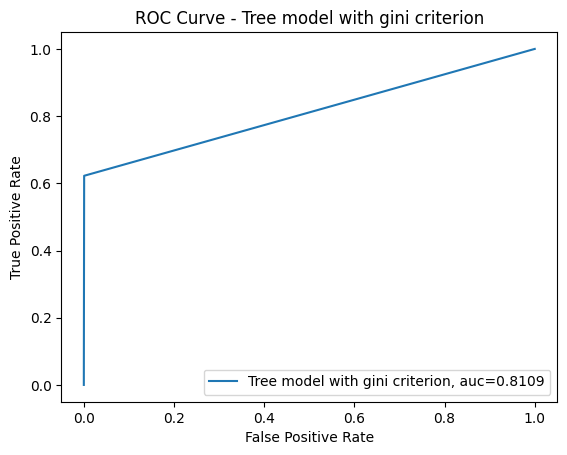

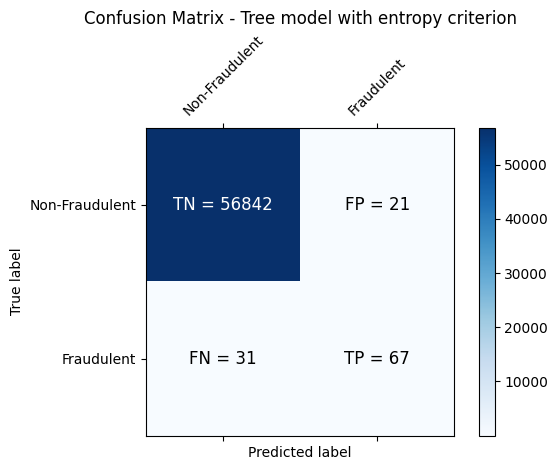

Accuracy of Tree model with entropy criterion: 0.9990870946788153
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.76      0.68      0.72        98

    accuracy                           1.00     56961
   macro avg       0.88      0.84      0.86     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with entropy criterion roc_value: 0.8416520803 threshold: 1.0000000000 ROC for the test dataset 84.2%


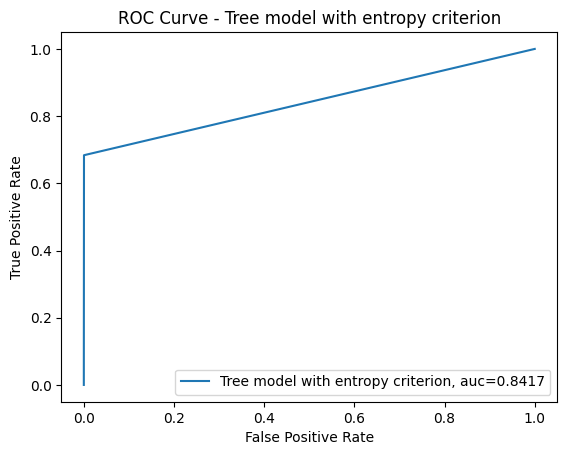

Time Taken by Model: --- 33.76449632644653 seconds ---
Random Forest Model


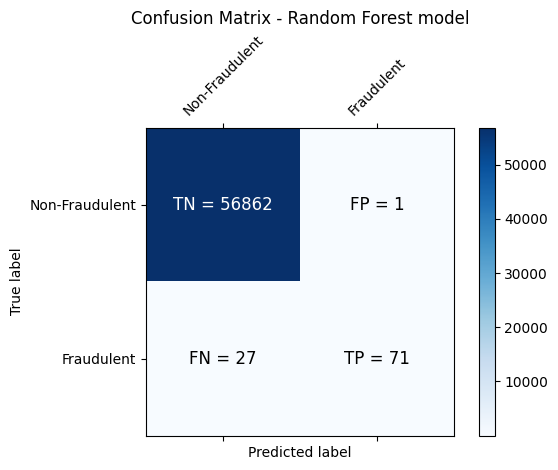

Accuracy of Random Forest model: 0.9995084355962852
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.72      0.84        98

    accuracy                           1.00     56961
   macro avg       0.99      0.86      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9405535036 threshold: 0.0200000000 ROC for the test dataset 94.1%


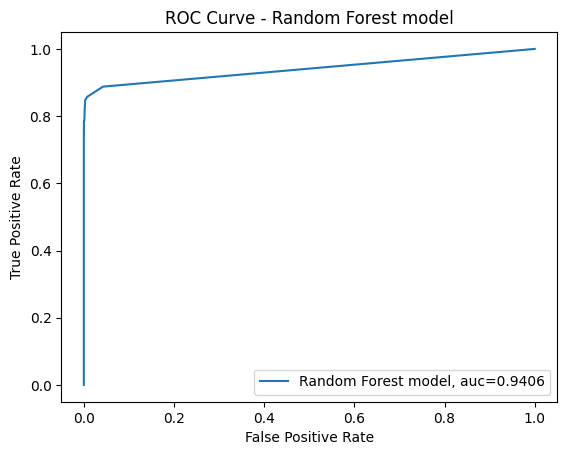

Time Taken by Model: --- 283.39688062667847 seconds ---
XGBoost Model


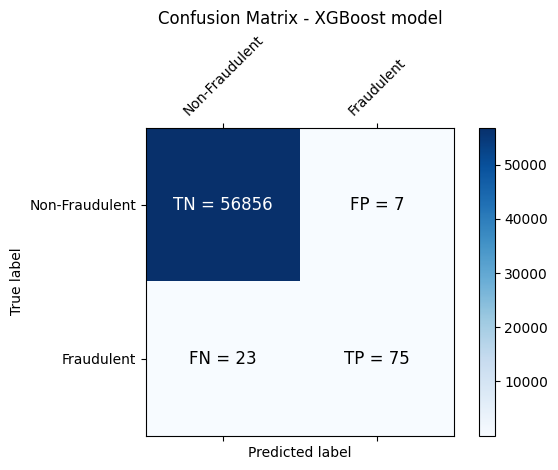

Accuracy of XGBoost model: 0.9994733238531627
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.91      0.77      0.83        98

    accuracy                           1.00     56961
   macro avg       0.96      0.88      0.92     56961
weighted avg       1.00      1.00      1.00     56961

XGBoost roc_value: 0.9826970445 threshold: 0.0000413081 ROC for the test dataset 98.3%


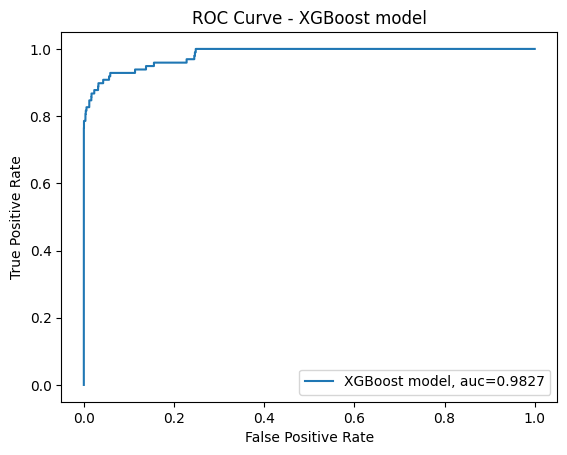

Time Taken by Model: --- 7.548286437988281 seconds ---


In [85]:
DataImabalance = "Random Oversampling with StratifiedKFold CV"
df_Results = run_all_models(df_Results, DataImabalance, X_over, y_over, X_test, y_test, run_svm=False)

In [86]:
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


#### Results for Random Oversampling:

**Random Oversampling has shown a positive impact on XGBoost predictions.** Based on the Accuracy and ROC values, XGBoost has delivered the best results when using this technique.

#### Similarly explore other algorithms on balanced dataset by building models like:
- KNN
- SVM
- Decision Tree
- Random Forest
- XGBoost

### Handling Class Imbalance with SMOTE Oversampling

#### Class Distribution Analysis
- First, we will display the class distribution with and without SMOTE Oversampling.

#### Cross-Validation with StratifiedKFold
- Then, we will use SMOTE Oversampling along with StratifiedKFold cross-validation to generate train and test datasets.

#### Model Training and Evaluation
- Subsequently, we will train and evaluate the following models using the oversampled datasets:
  - Logistic Regression with L2 Regularization
  - Logistic Regression with L1 Regularization
  - K-Nearest Neighbors (KNN)
  - Decision Tree with Gini Criterion
  - Decision Tree with Entropy Criterion
  - Random Forest
  - XGBoost

#### Model Comparison
- Finally, we will compare the performance of these models and select the one that provides the best results with the SMOTE Oversampling technique.

#### Print the class distribution after applying SMOTE

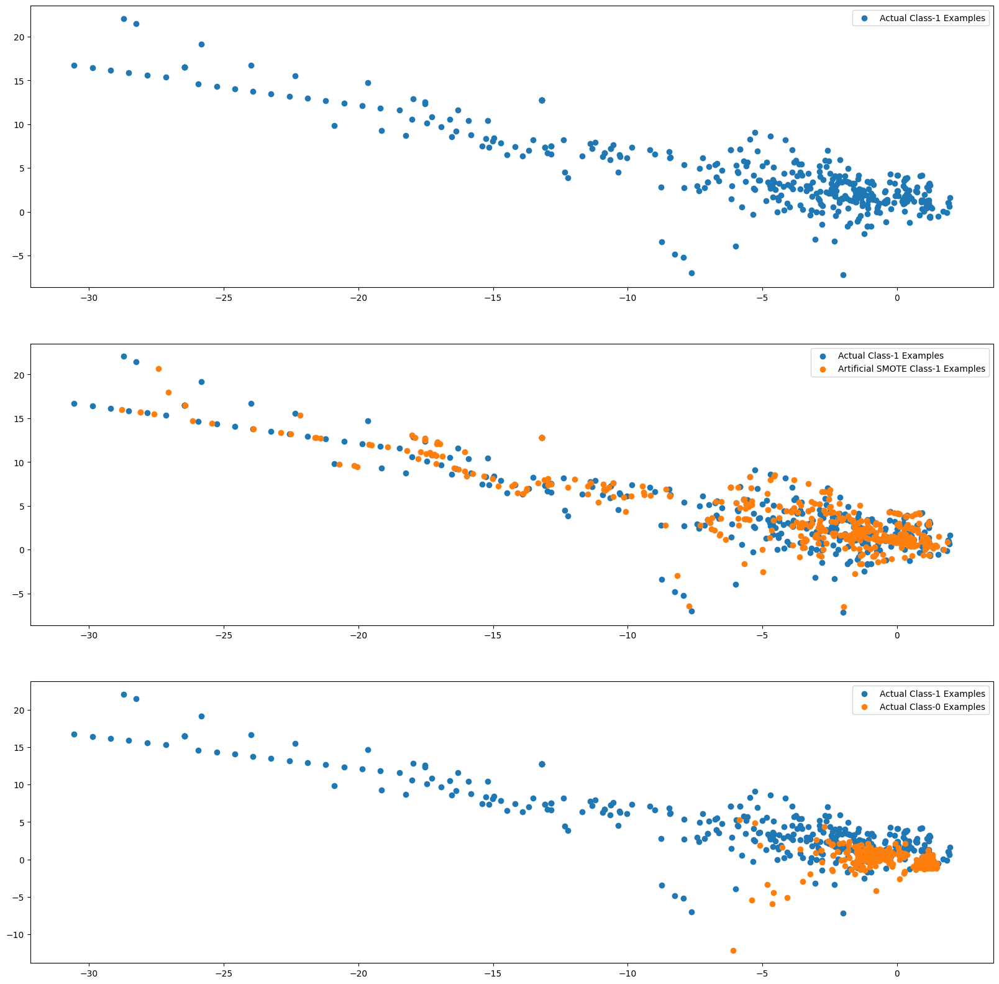

In [87]:
# Apply SMOTE
smote = SMOTE(random_state=0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Extract artificial minority samples from SMOTE
X_train_smote_1 = X_train_smote.iloc[X_train.shape[0]:]

# Convert to numpy arrays for plotting
X_train_1 = X_train.to_numpy()[y_train == 1.0]
X_train_0 = X_train.to_numpy()[y_train == 0.0]

# Plotting
plt.rcParams['figure.figsize'] = [20, 20]
fig, axs = plt.subplots(3, 1)

axs[0].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axs[0].legend()

axs[1].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axs[1].scatter(X_train_smote_1.iloc[:X_train_1.shape[0], 0], X_train_smote_1.iloc[:X_train_1.shape[0], 1],
               label='Artificial SMOTE Class-1 Examples')
axs[1].legend()

axs[2].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axs[2].scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
axs[2].legend()

plt.show()

# Create dataframe
X_train_smote = pd.DataFrame(data=X_train_smote, columns=cols)

In [88]:
# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index]
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]
    SMOTE = over_sampling.SMOTE(random_state=0)
    X_train_Smote, y_train_Smote= SMOTE.fit_resample(X_train, y_train)

#Create Dataframe for X_over
X_train_Smote = pd.DataFrame(data=X_train_Smote,   columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

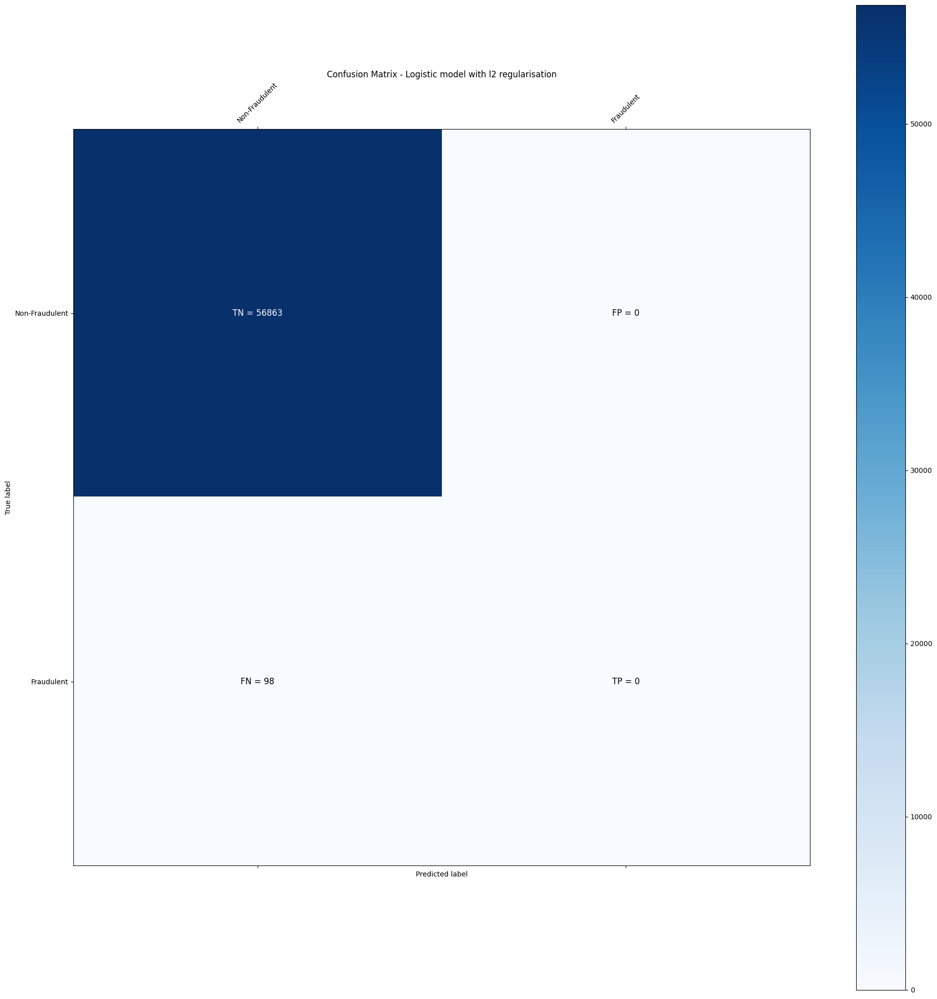

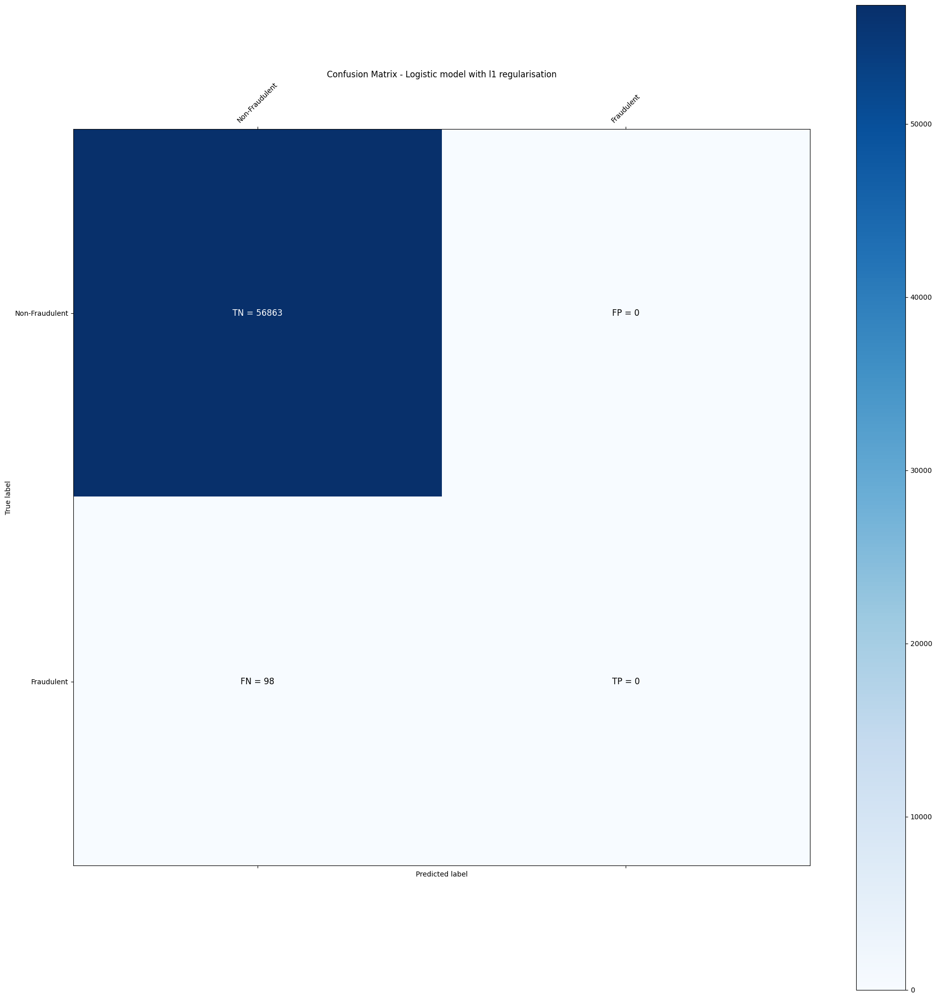

Accuracy of Logistic model with l2 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

Accuracy of Logistic model with l1 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


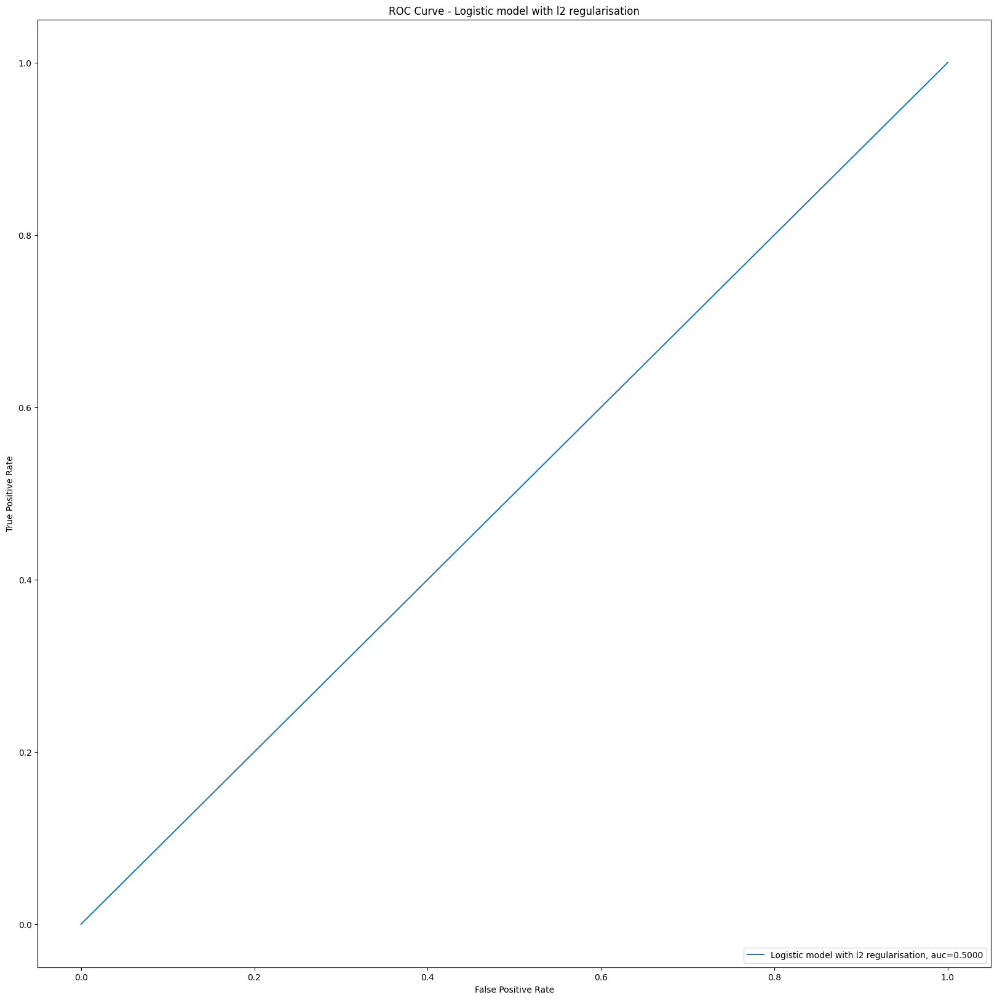

l1 roc_value: 0.5000000000 l1 threshold: inf ROC for the test dataset 50.0%


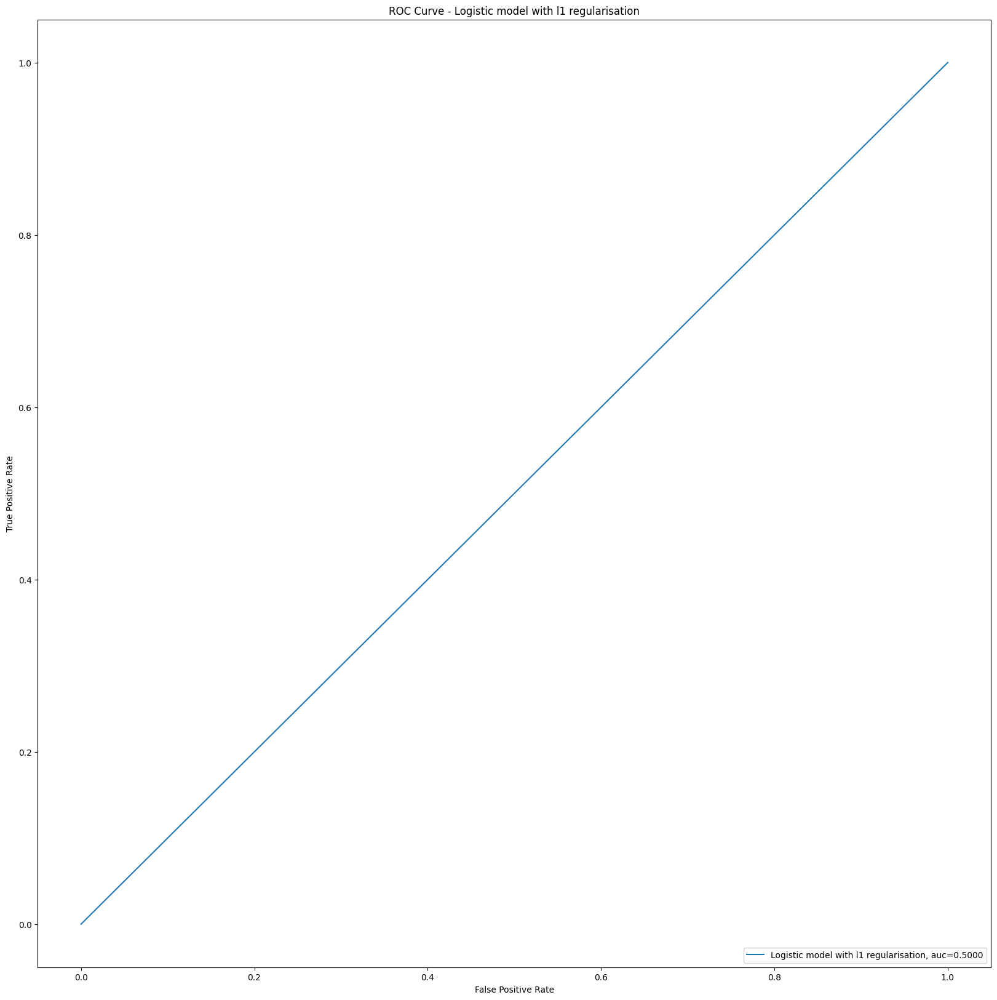

Time Taken by Model: --- 183.11142945289612 seconds ---
KNN Model


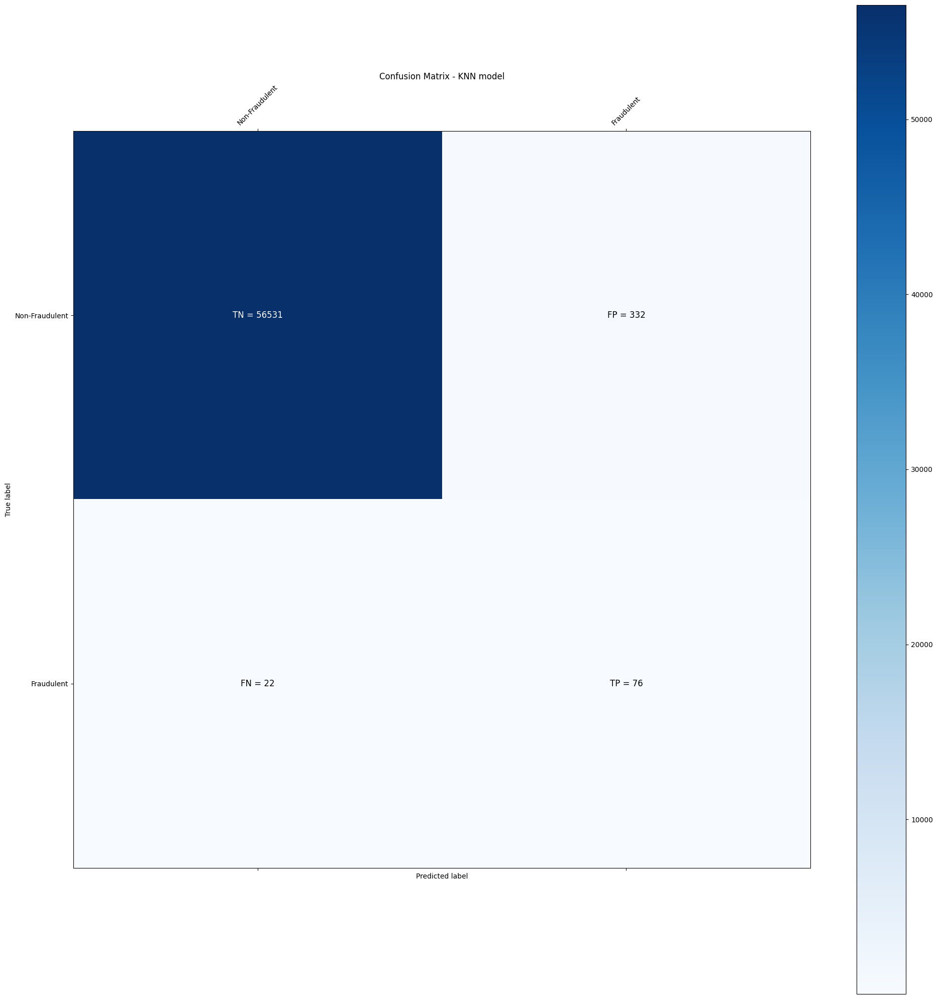

Accuracy of KNN model: 0.9937852214673197
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56863
           1       0.19      0.78      0.30        98

    accuracy                           0.99     56961
   macro avg       0.59      0.88      0.65     56961
weighted avg       1.00      0.99      1.00     56961

KNN roc_value: 0.8959609150 KNN threshold: 0.2000000000 ROC for the test dataset 89.6%


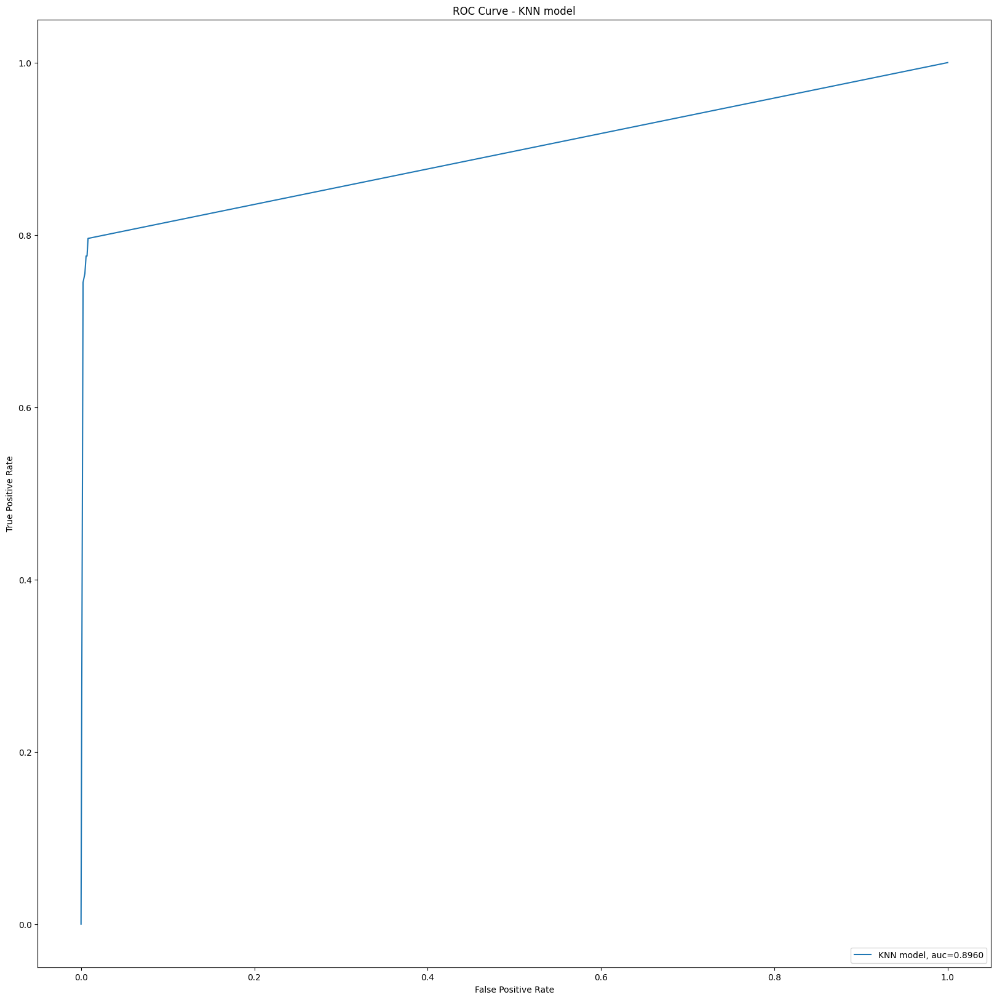

Time Taken by Model: --- 378.6348419189453 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


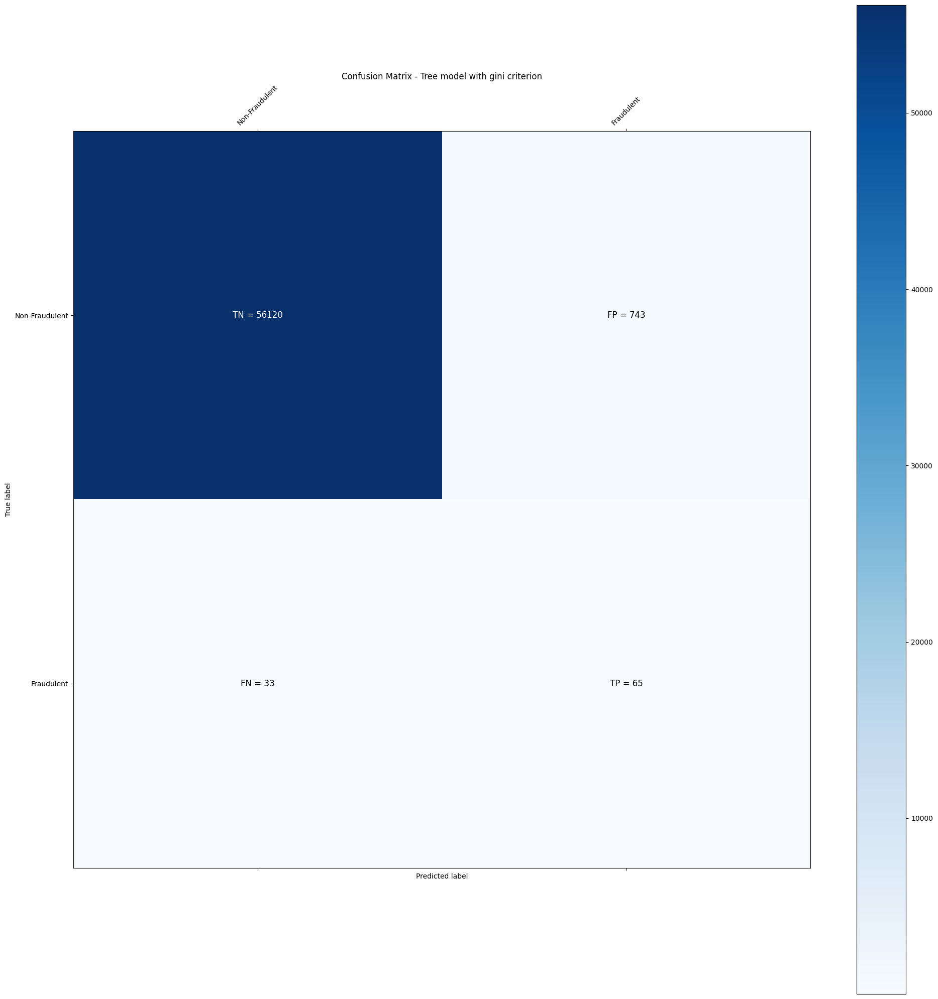

Accuracy of Tree model with gini criterion: 0.9863766436684749
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56863
           1       0.08      0.66      0.14        98

    accuracy                           0.99     56961
   macro avg       0.54      0.83      0.57     56961
weighted avg       1.00      0.99      0.99     56961

Tree model with gini criterion roc_value: 0.8250994065 threshold: 1.0000000000 ROC for the test dataset 82.5%


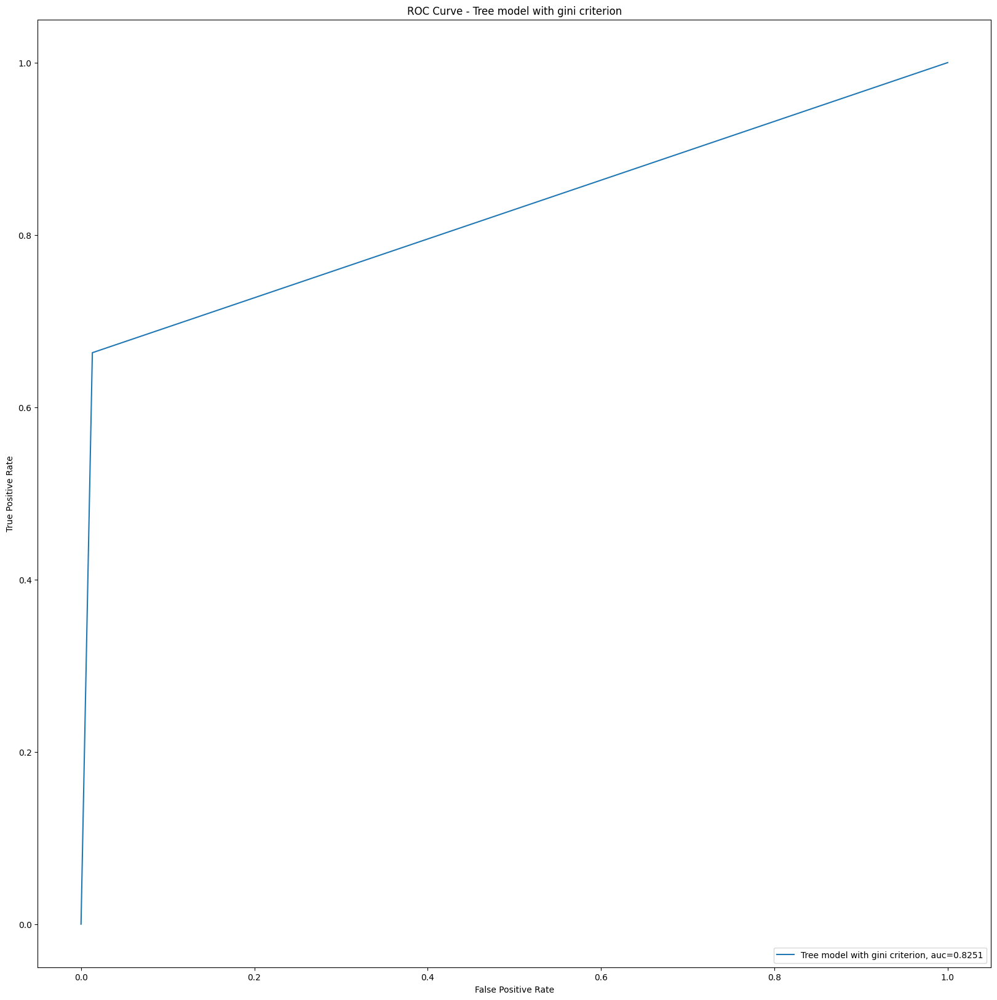

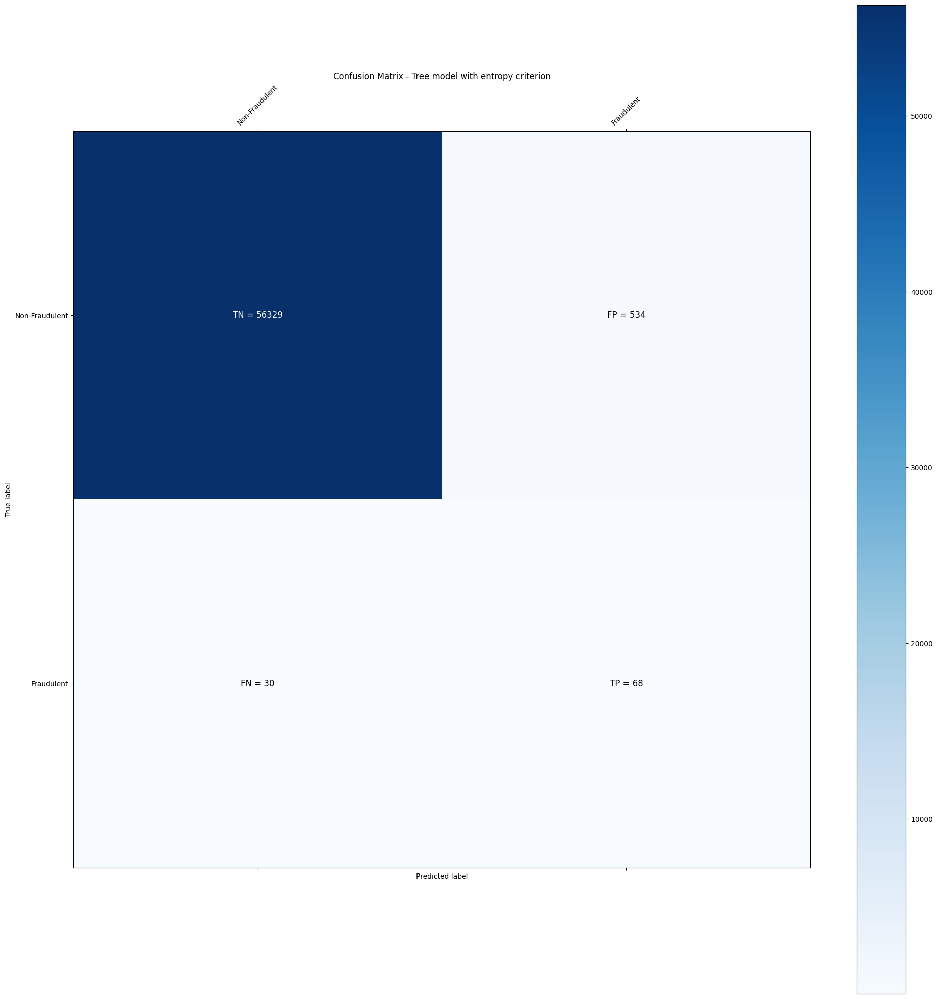

Accuracy of Tree model with entropy criterion: 0.9900984884394586
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56863
           1       0.11      0.69      0.19        98

    accuracy                           0.99     56961
   macro avg       0.56      0.84      0.59     56961
weighted avg       1.00      0.99      0.99     56961

Tree model with entropy criterion roc_value: 0.8422432793 threshold: 1.0000000000 ROC for the test dataset 84.2%


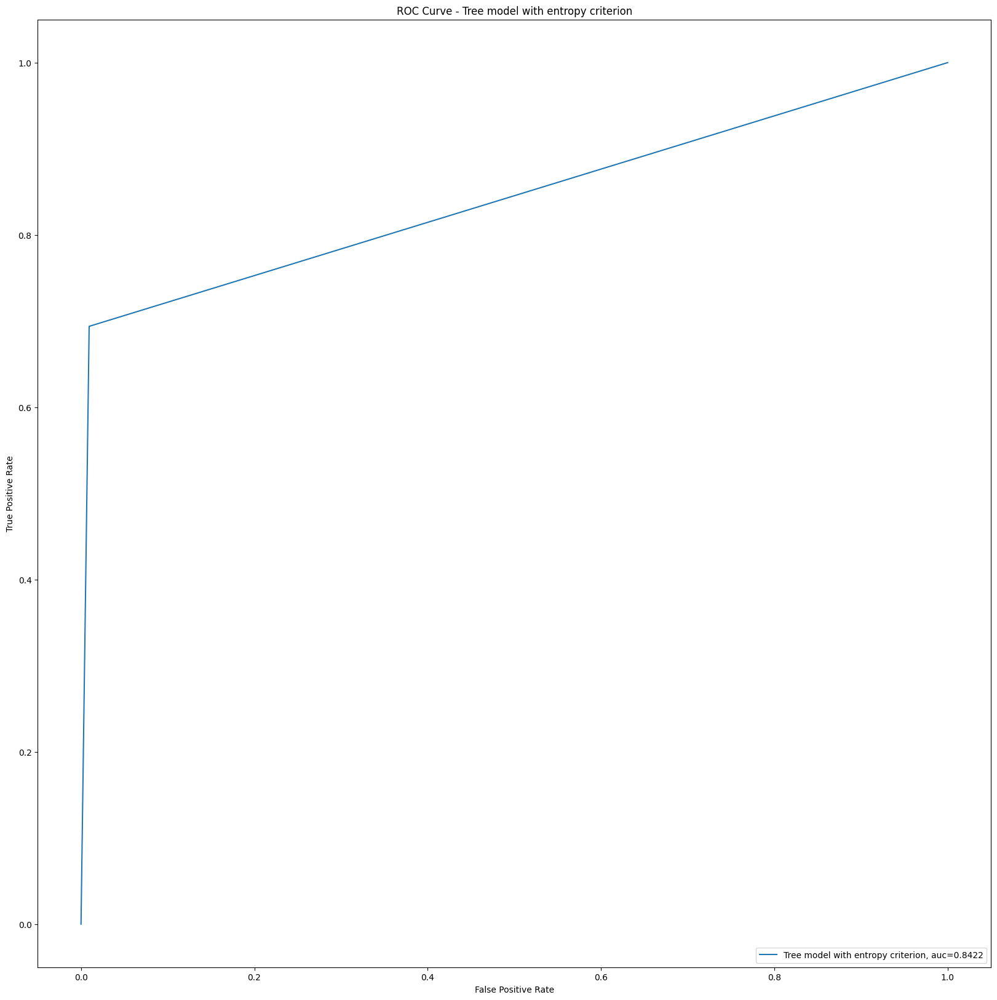

Time Taken by Model: --- 145.3798451423645 seconds ---
Random Forest Model


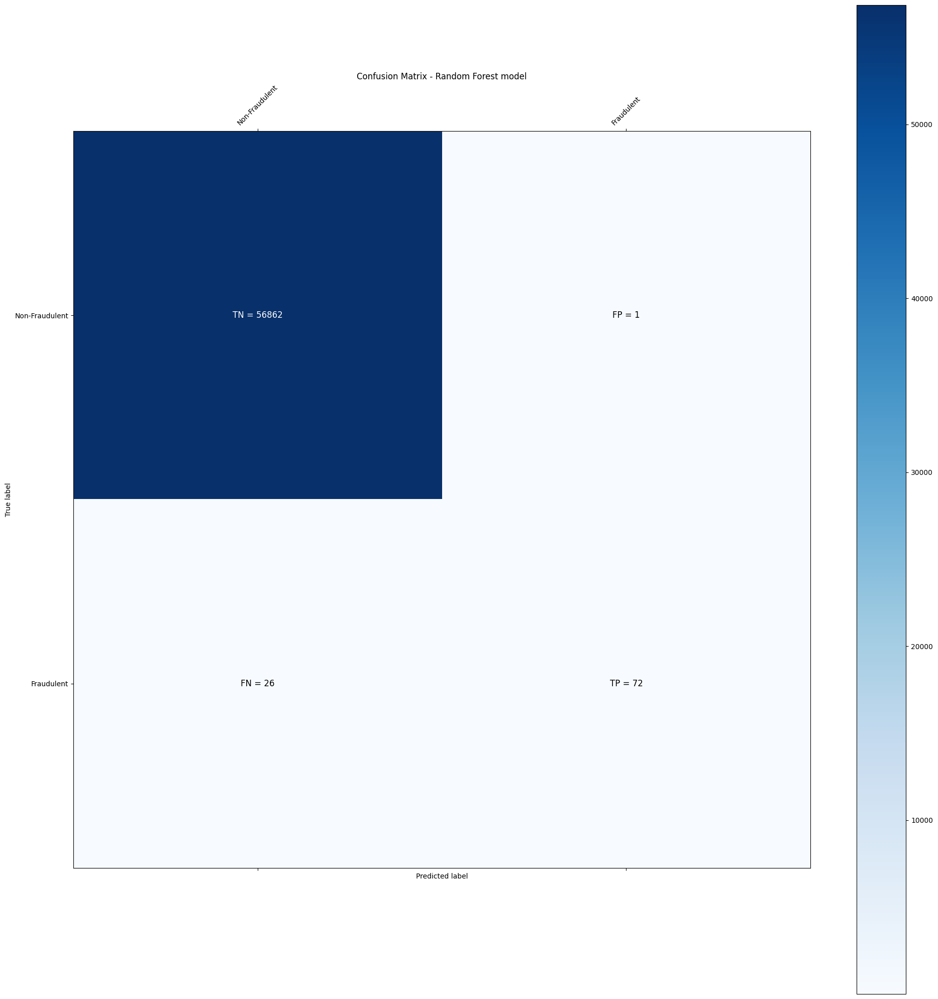

Accuracy of Random Forest model: 0.9995259914678464
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.73      0.84        98

    accuracy                           1.00     56961
   macro avg       0.99      0.87      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9599545919 threshold: 0.0500000000 ROC for the test dataset 96.0%


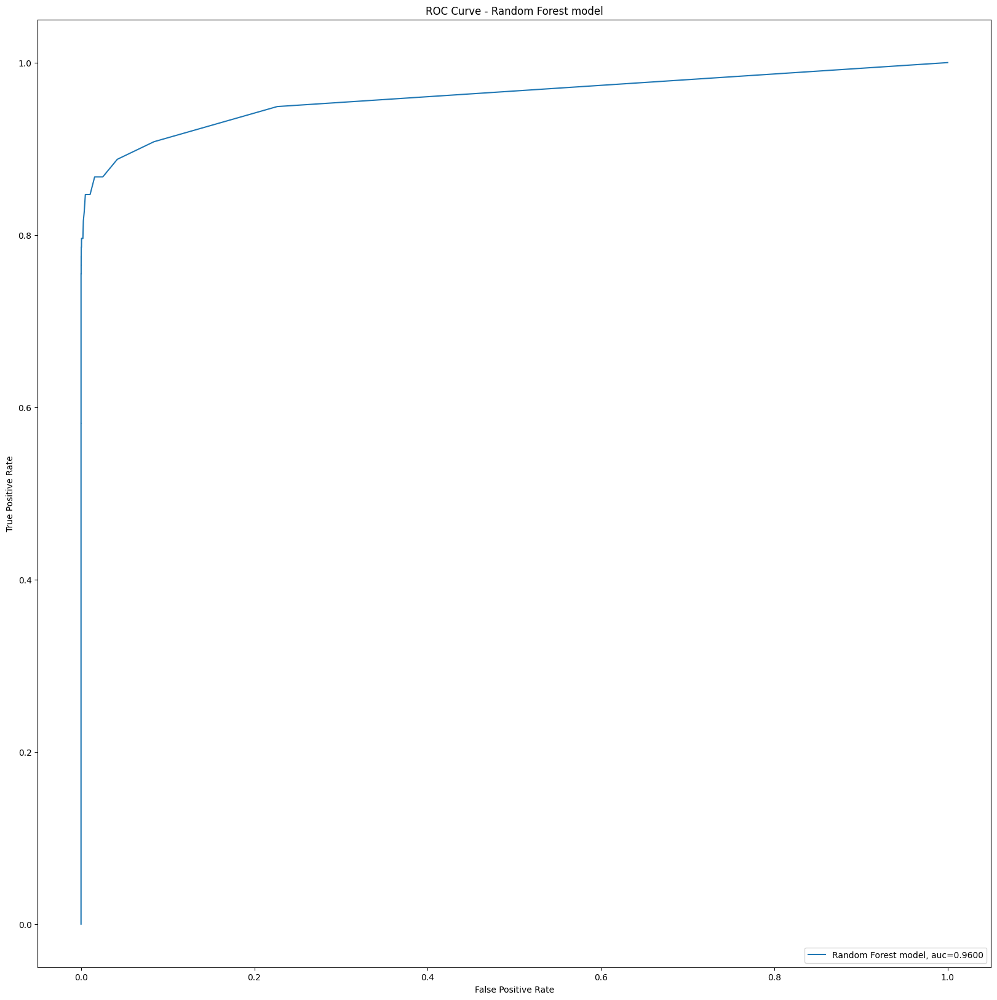

Time Taken by Model: --- 736.4612190723419 seconds ---
XGBoost Model


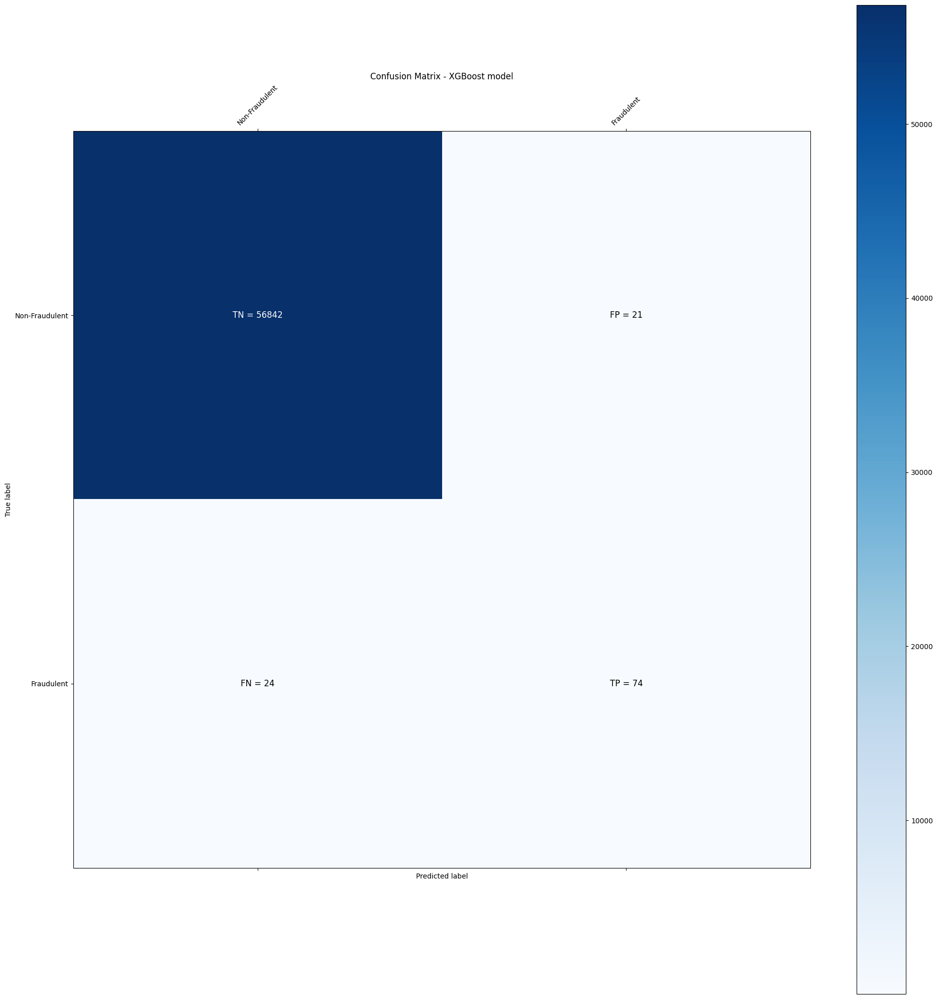

Accuracy of XGBoost model: 0.9992099857797441
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.78      0.76      0.77        98

    accuracy                           1.00     56961
   macro avg       0.89      0.88      0.88     56961
weighted avg       1.00      1.00      1.00     56961

XGBoost roc_value: 0.9508415680 threshold: 0.0006313539 ROC for the test dataset 95.1%


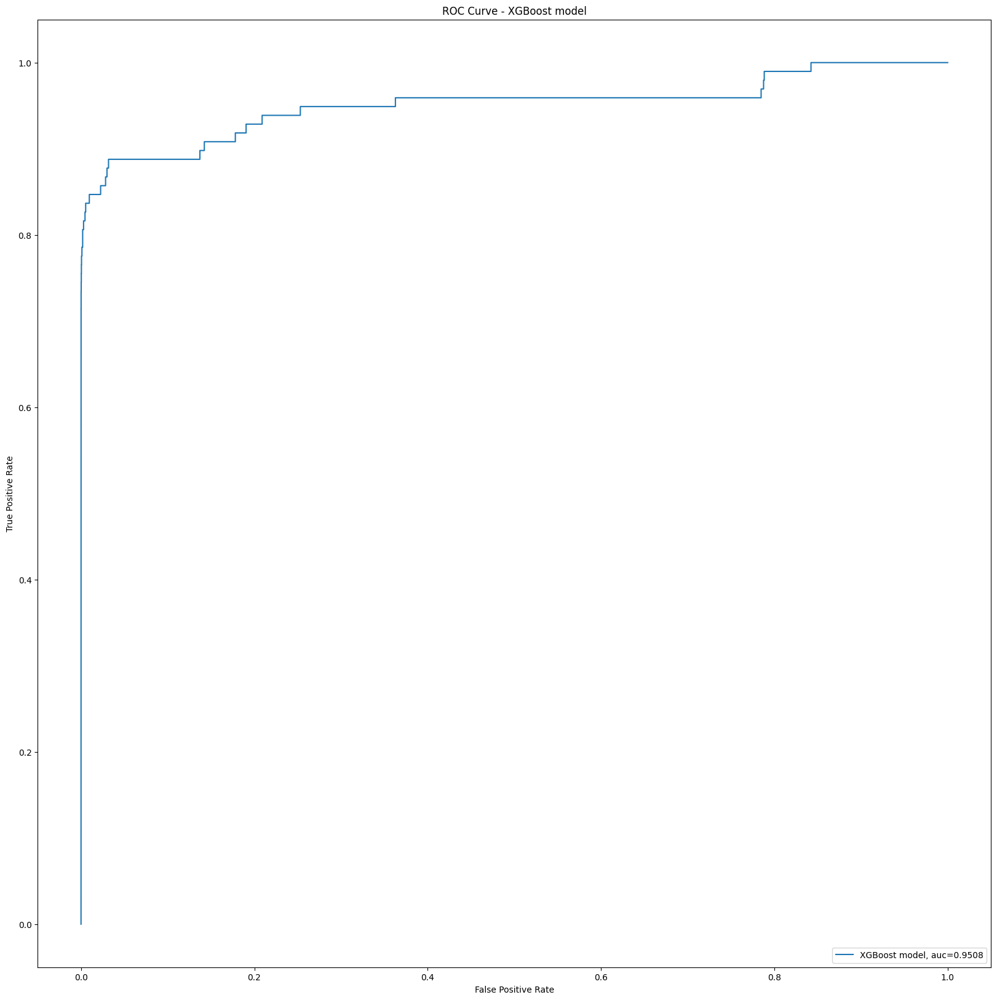

Time Taken by Model: --- 12.661156415939331 seconds ---


In [89]:
DataImabalance = "SMOTE Oversampling with StratifiedKFold CV"
df_Results = run_all_models(df_Results, DataImabalance, X_train_Smote, y_train_Smote, X_test, y_test, run_svm=False)

In [90]:
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


#### Results for SMOTE Oversampling:

Based on the Accuracy and ROC values, XGBoost has delivered the best results when using the SMOTE oversampling technique.

### Handling Class Imbalance with ADASYN Oversampling

#### Class Distribution Analysis
- Initially, we will examine the class distribution both before and after applying ADASYN Oversampling.

#### Cross-Validation with StratifiedKFold
- Next, we will utilize ADASYN Oversampling in conjunction with StratifiedKFold cross-validation to create train and test datasets.

#### Model Training and Evaluation
- Following dataset preparation, we will proceed to train and evaluate the performance of the following models using the oversampled datasets:
  - Logistic Regression with L2 Regularization
  - Logistic Regression with L1 Regularization
  - K-Nearest Neighbors (KNN)
  - Decision Tree with Gini Criterion
  - Decision Tree with Entropy Criterion
  - Random Forest
  - XGBoost

#### Model Comparison
- Finally, we will compare the results obtained from these models and select the optimal model based on performance using the ADASYN Oversampling technique.

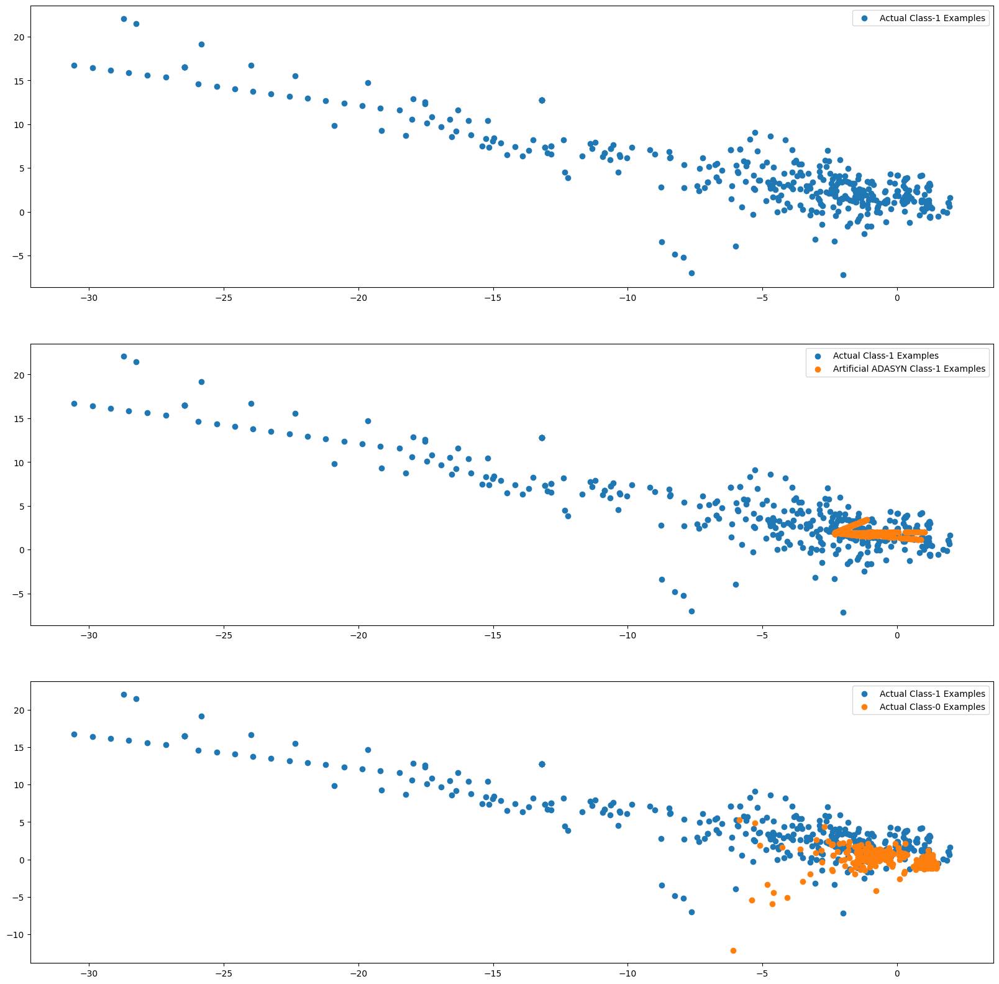

In [91]:
ADASYN_sampler = ADASYN(random_state=0)
X_train_ADASYN, y_train_ADASYN = ADASYN_sampler.fit_resample(X_train, y_train)

# Extracting artificial minority samples generated by ADASYN
X_train_adasyn_1 = X_train_ADASYN.iloc[X_train.shape[0]:]

# Extracting actual class-1 and class-0 examples
X_train_1 = X_train[y_train == 1.0].to_numpy()
X_train_0 = X_train[y_train == 0.0].to_numpy()

# Plotting
plt.rcParams['figure.figsize'] = [20, 20]
fig, axes = plt.subplots(3, 1)

# Plot 1: Actual Class-1 Examples
axes[0].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axes[0].legend()

# Plot 2: Actual Class-1 and Artificial ADASYN Class-1 Examples
axes[1].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axes[1].scatter(X_train_adasyn_1.iloc[:X_train_1.shape[0], 0], X_train_adasyn_1.iloc[:X_train_1.shape[0], 1],
                label='Artificial ADASYN Class-1 Examples')
axes[1].legend()

# Plot 3: Actual Class-1 and Class-0 Examples
axes[2].scatter(X_train_1[:, 0], X_train_1[:, 1], label='Actual Class-1 Examples')
axes[2].scatter(X_train_0[:X_train_1.shape[0], 0], X_train_0[:X_train_1.shape[0], 1], label='Actual Class-0 Examples')
axes[2].legend()

plt.show()

In [92]:
skf = StratifiedKFold(n_splits=5, random_state=None)

for fold, (train_index, test_index) in enumerate(skf.split(X,y), 1):
    X_train = X.loc[train_index]
    y_train = y.loc[train_index]
    X_test = X.loc[test_index]
    y_test = y.loc[test_index]
    ADASYN = over_sampling.ADASYN(random_state=0)
    X_train_ADASYN, y_train_ADASYN= ADASYN.fit_resample(X_train, y_train)

#Create Dataframe for X_over
X_train_ADASYN = pd.DataFrame(data=X_train_ADASYN,   columns=cols)

Logistic Regression with L1 And L2 Regularisation
Parameters for l2 regularization
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0.]]
[0.]
{np.int64(1): array([[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5],
       [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5,
        0.5, 0.5, 0.5, 0.5,

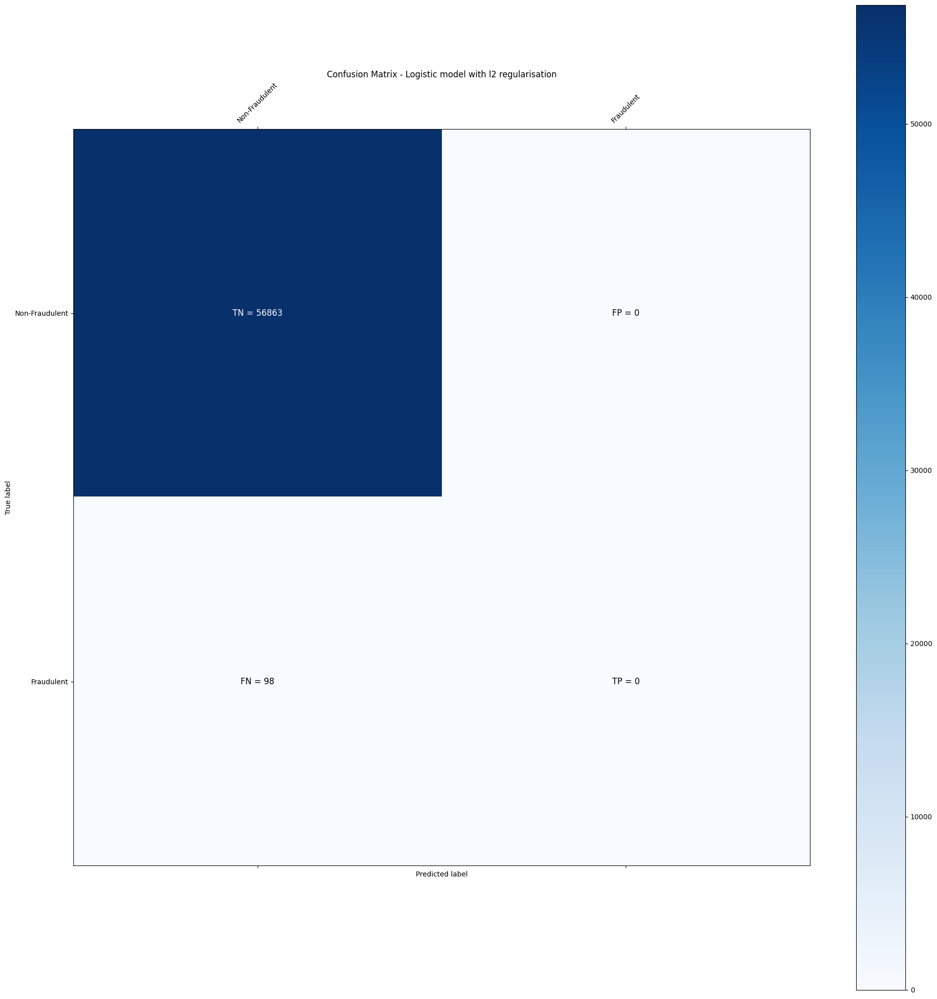

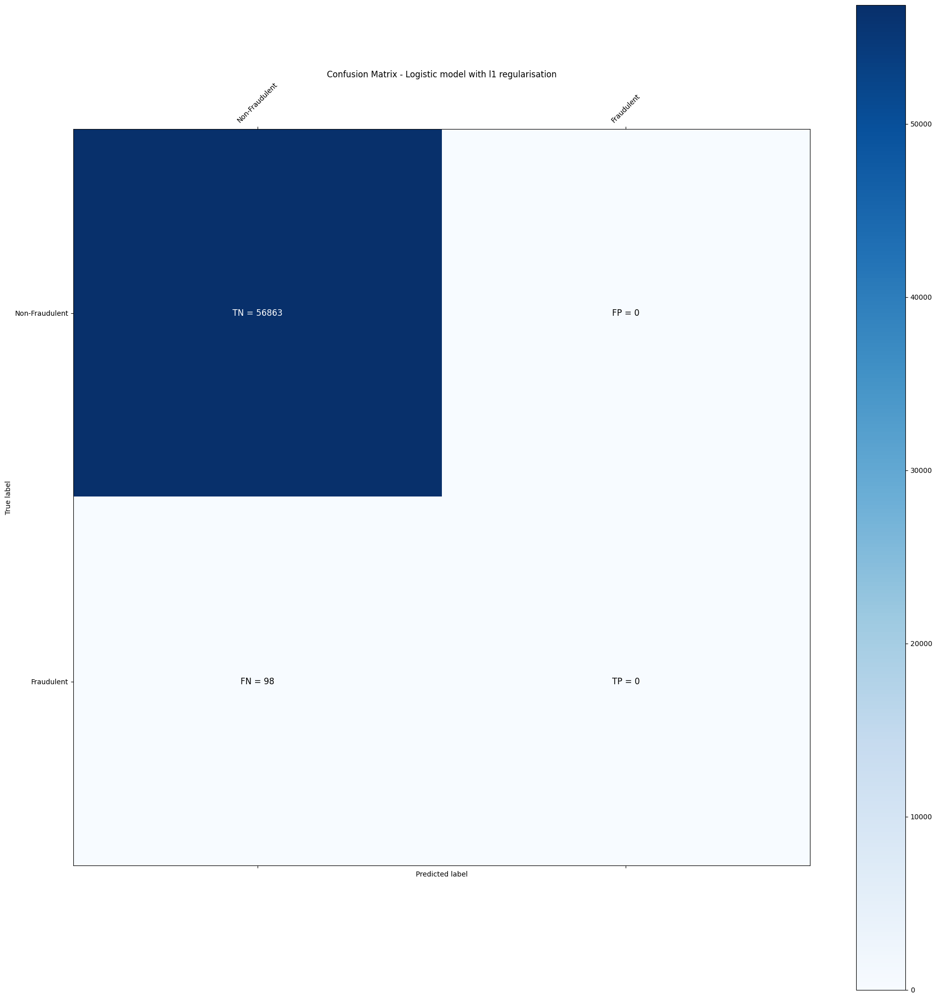

Accuracy of Logistic model with l2 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

Accuracy of Logistic model with l1 regularisation: 0.9982795245869981
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        98

    accuracy                           1.00     56961
   macro avg       0.50      0.50      0.50     56961
weighted avg       1.00      1.00      1.00     56961

l2 roc_value: 0.5000000000 l2 threshold: inf ROC for the test dataset 50.0%


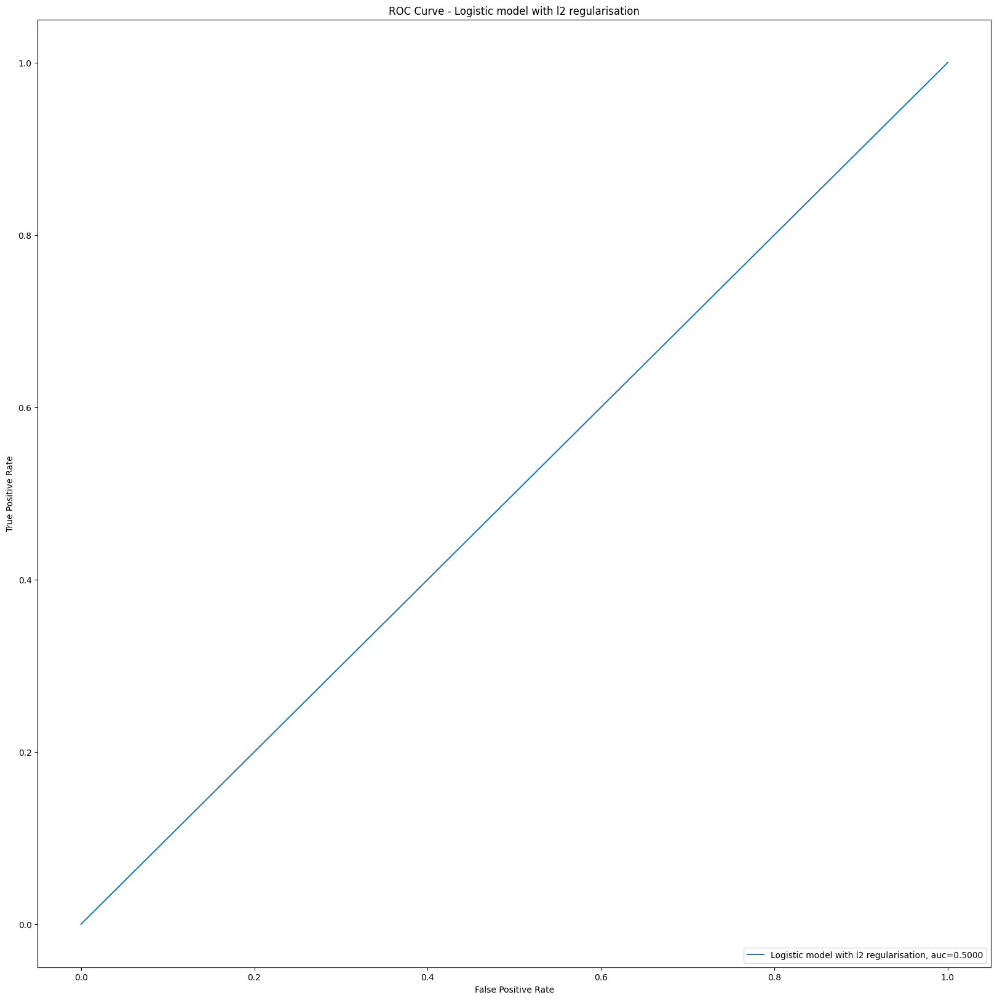

l1 roc_value: 0.5000000000 l1 threshold: inf ROC for the test dataset 50.0%


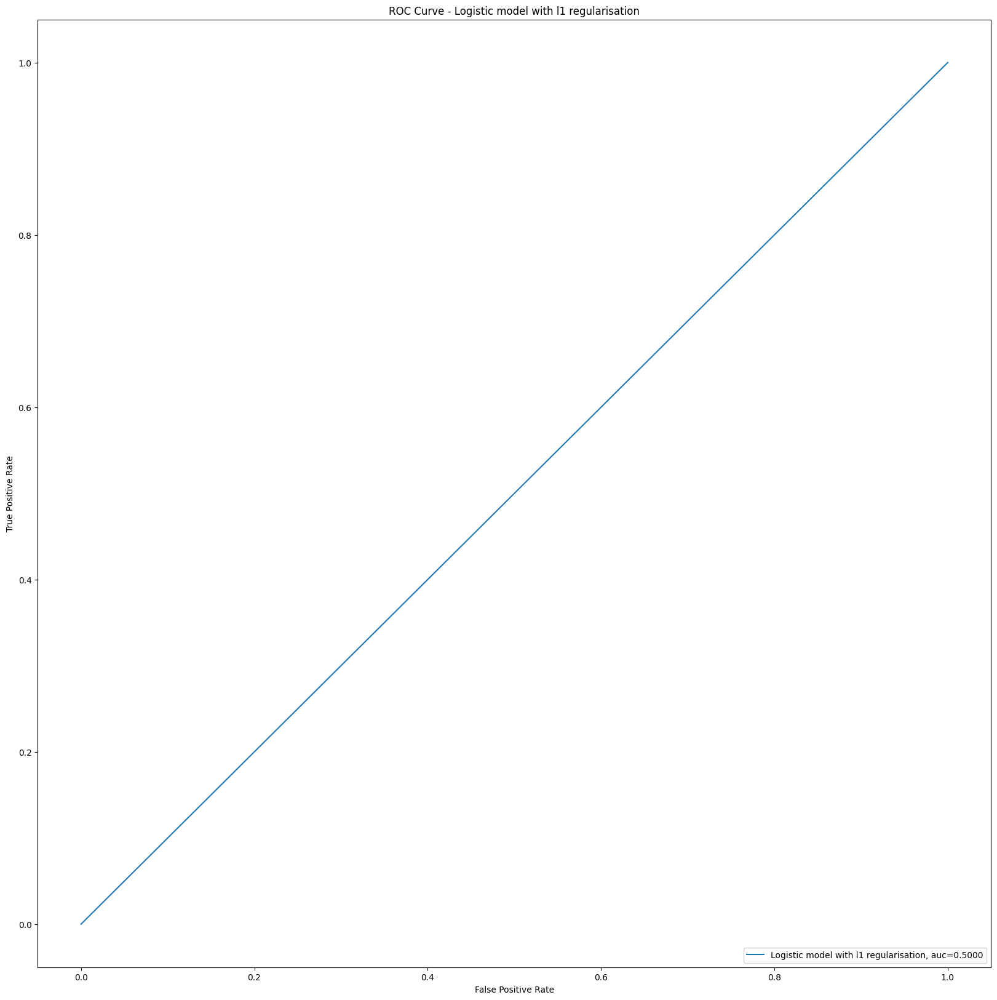

Time Taken by Model: --- 180.10309481620789 seconds ---
KNN Model


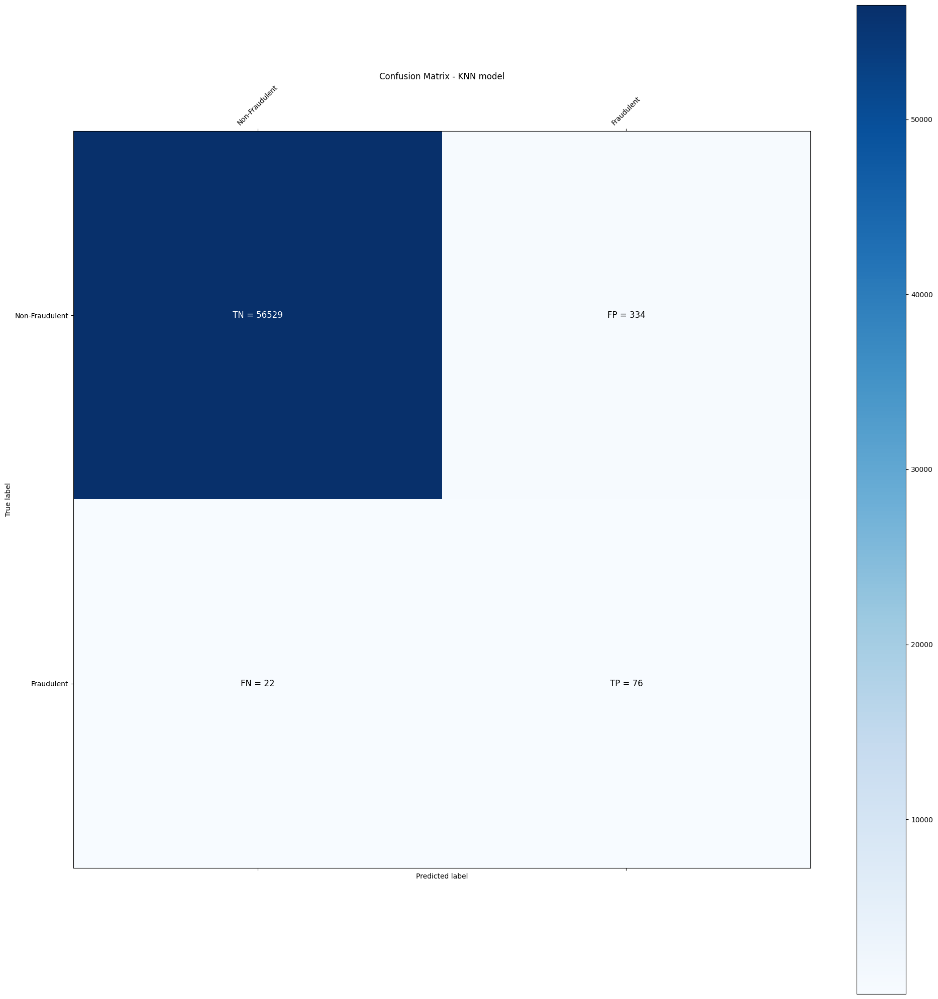

Accuracy of KNN model: 0.9937501097241973
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56863
           1       0.19      0.78      0.30        98

    accuracy                           0.99     56961
   macro avg       0.59      0.88      0.65     56961
weighted avg       1.00      0.99      1.00     56961

KNN roc_value: 0.8958900321 KNN threshold: 0.2000000000 ROC for the test dataset 89.6%


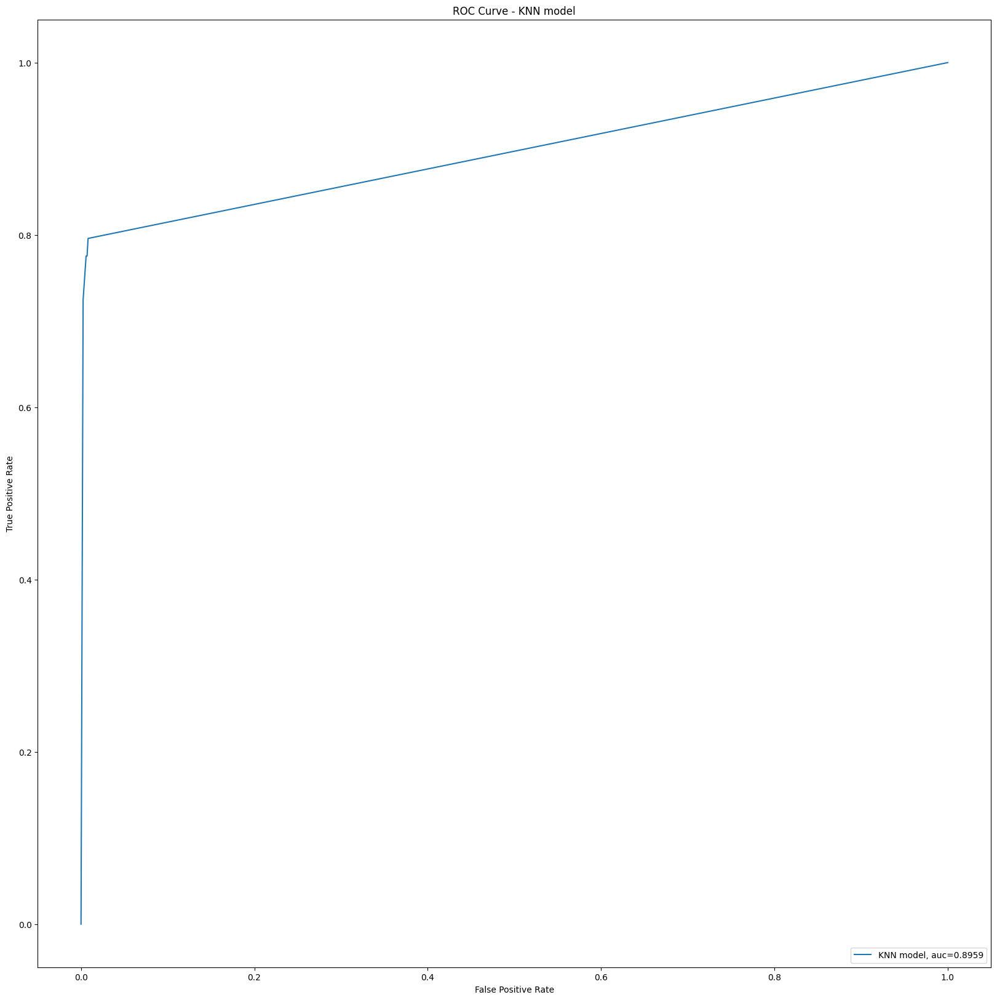

Time Taken by Model: --- 367.60651898384094 seconds ---
Decision Tree Models with 'gini' & 'entropy' criteria


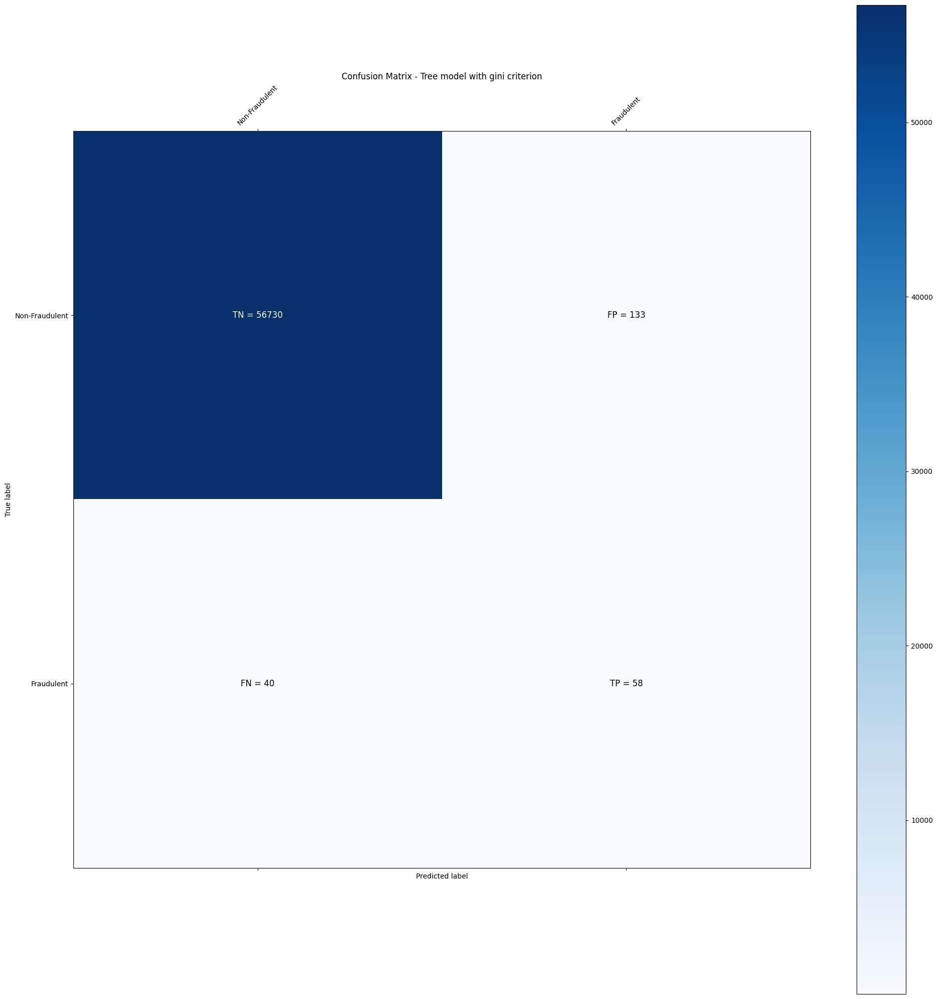

Accuracy of Tree model with gini criterion: 0.9969628342199048
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.30      0.59      0.40        98

    accuracy                           1.00     56961
   macro avg       0.65      0.79      0.70     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with gini criterion roc_value: 0.7947488898 threshold: 1.0000000000 ROC for the test dataset 79.5%


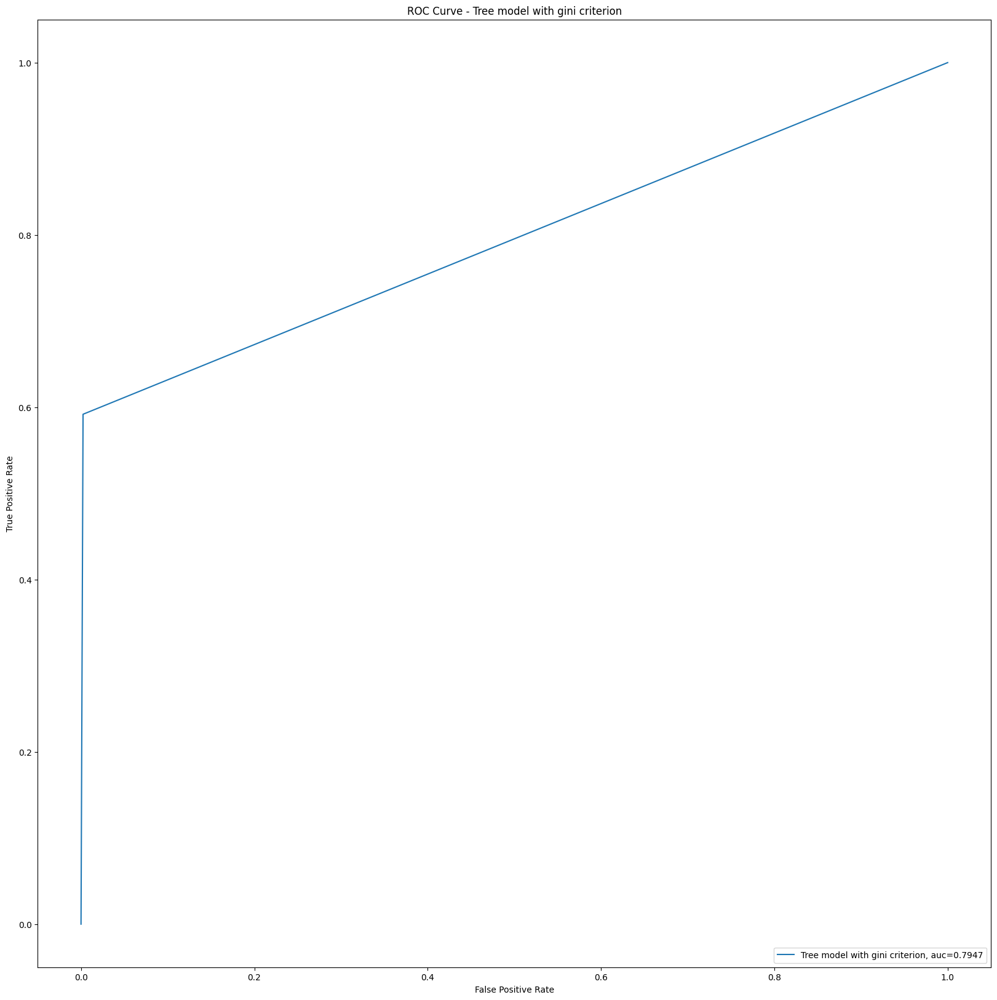

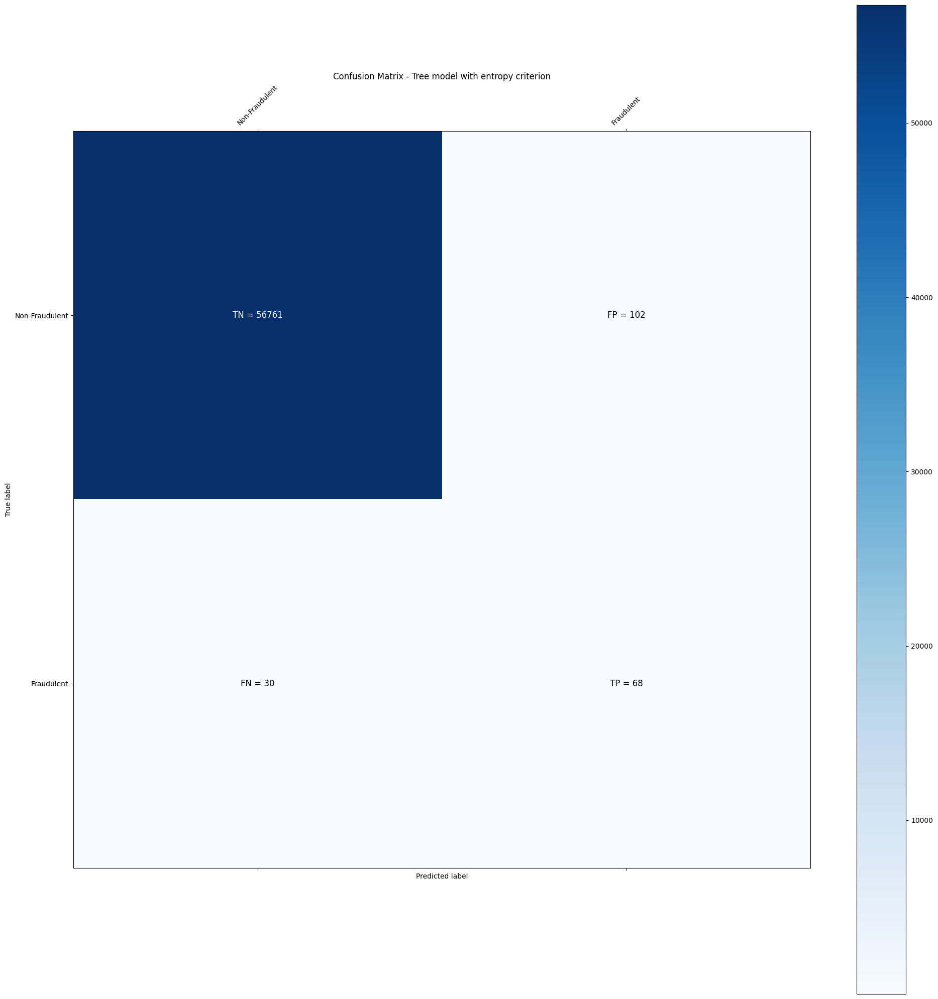

Accuracy of Tree model with entropy criterion: 0.9976826249539158
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.40      0.69      0.51        98

    accuracy                           1.00     56961
   macro avg       0.70      0.85      0.75     56961
weighted avg       1.00      1.00      1.00     56961

Tree model with entropy criterion roc_value: 0.8460418830 threshold: 1.0000000000 ROC for the test dataset 84.6%


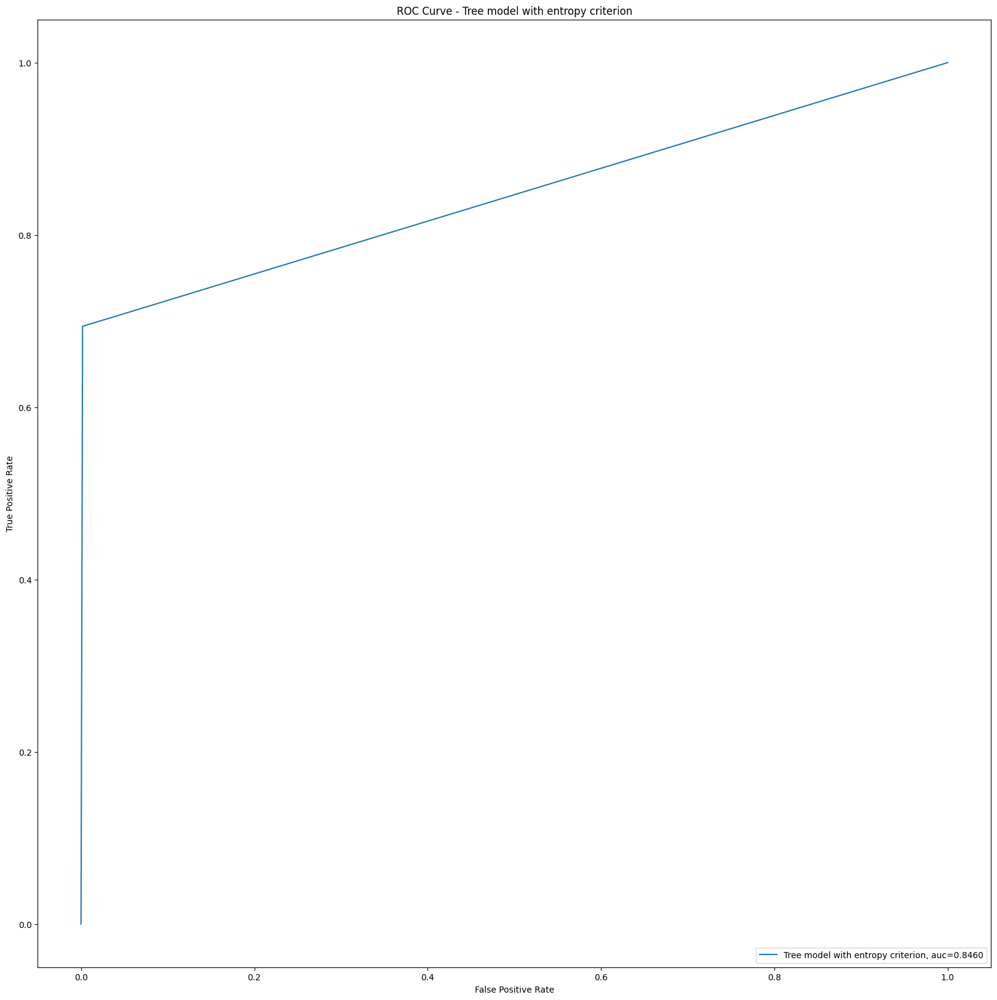

Time Taken by Model: --- 149.4850504398346 seconds ---
Random Forest Model


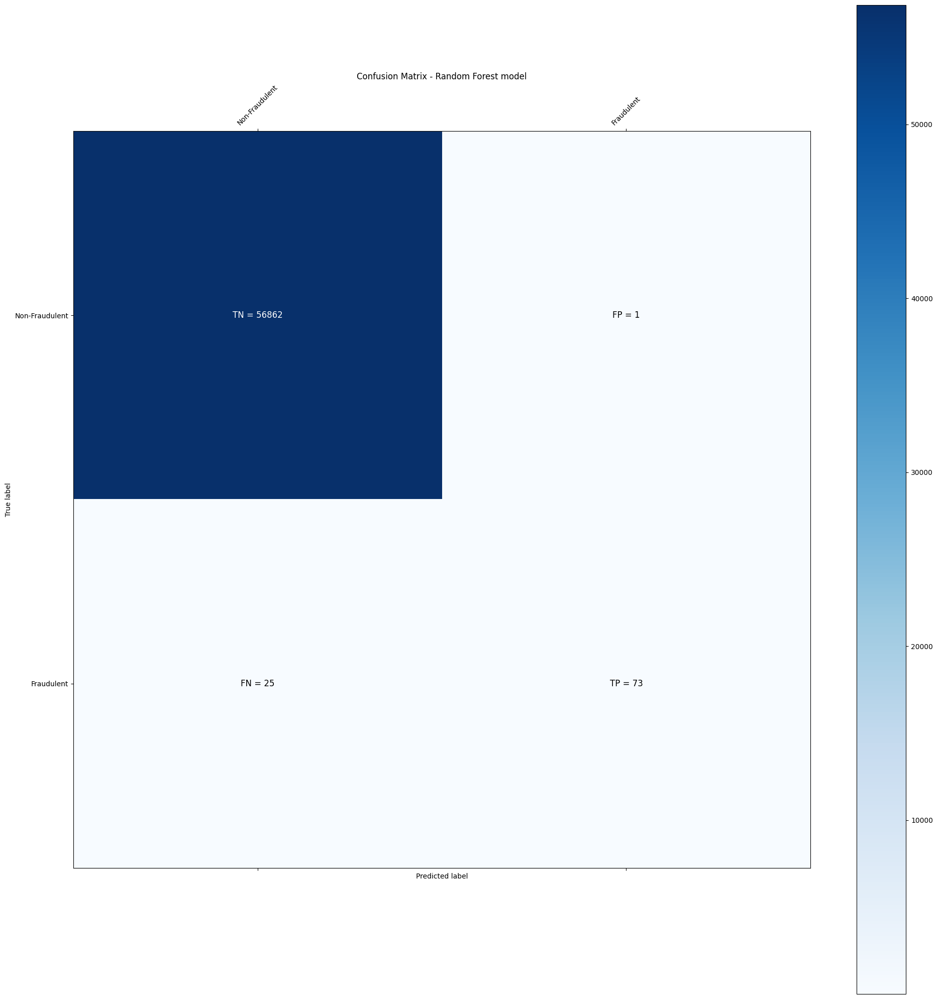

Accuracy of Random Forest model: 0.9995435473394076
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.99      0.74      0.85        98

    accuracy                           1.00     56961
   macro avg       0.99      0.87      0.92     56961
weighted avg       1.00      1.00      1.00     56961

Random Forest roc_value: 0.9450507073 threshold: 0.0400000000 ROC for the test dataset 94.5%


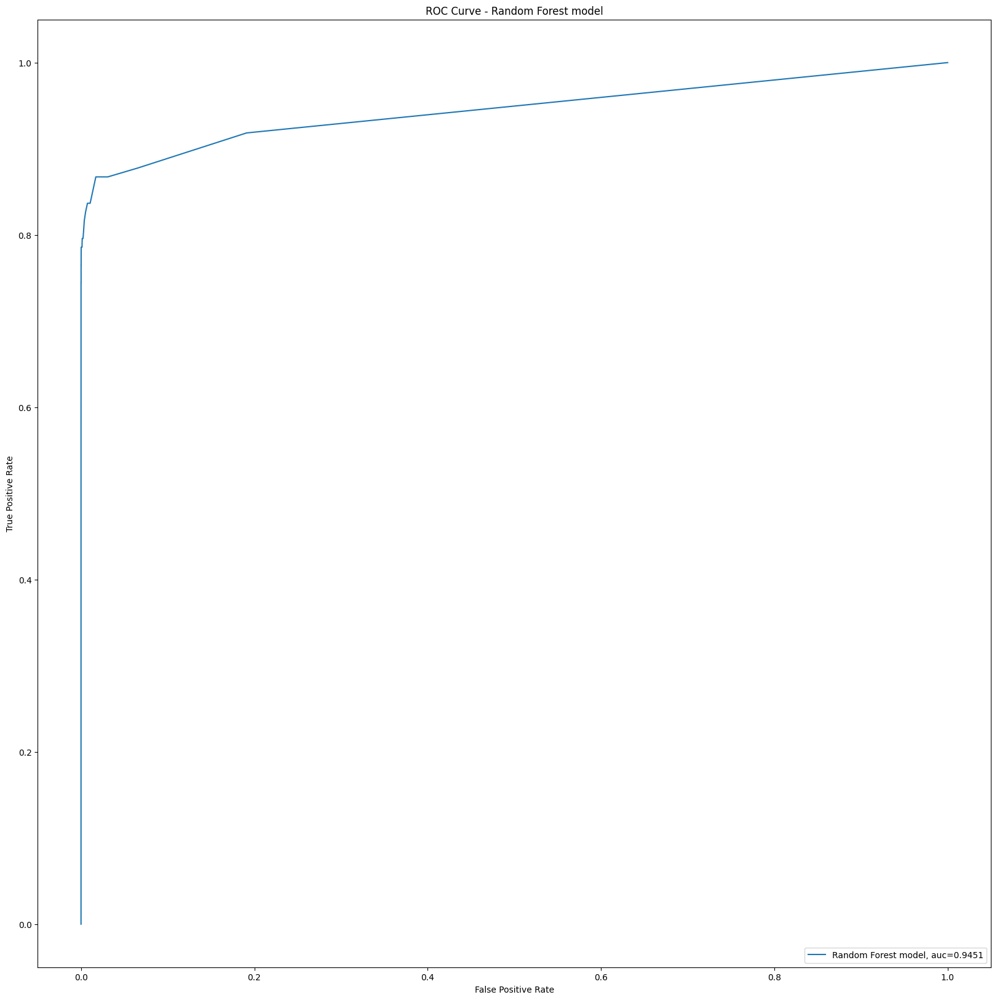

Time Taken by Model: --- 773.2118303775787 seconds ---
XGBoost Model


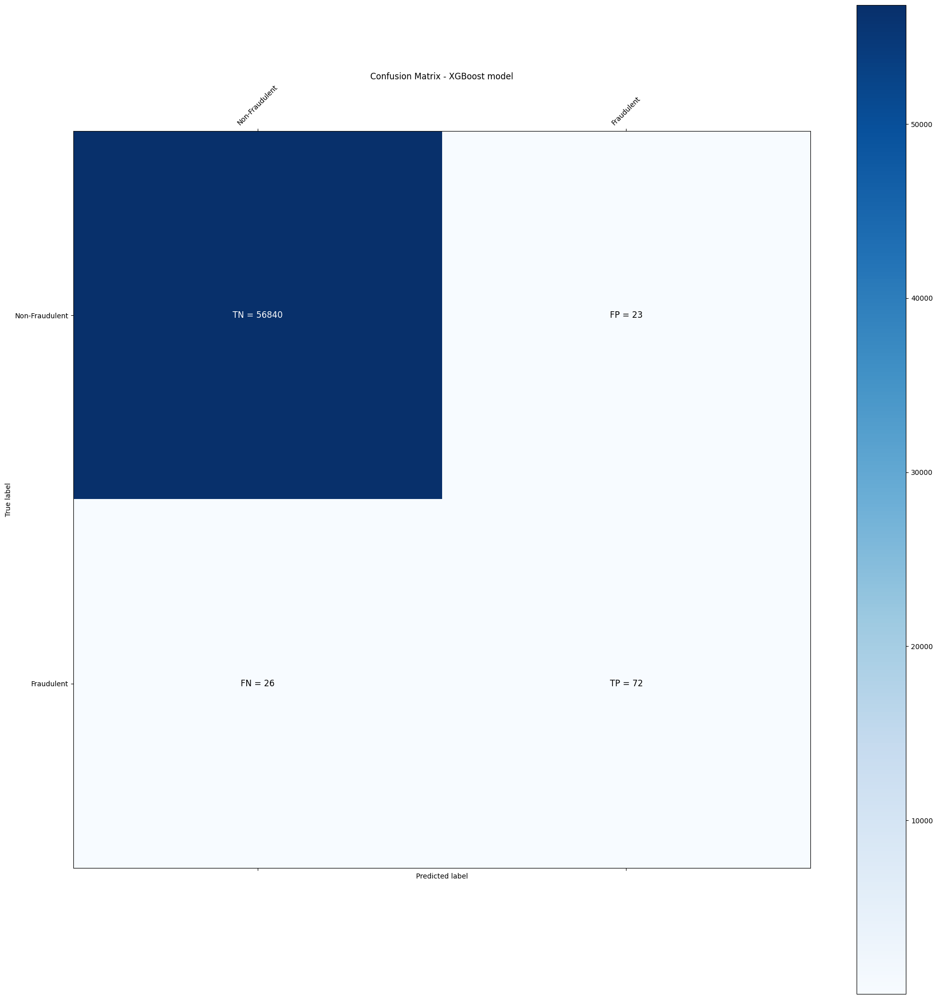

Accuracy of XGBoost model: 0.9991397622934991
Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.76      0.73      0.75        98

    accuracy                           1.00     56961
   macro avg       0.88      0.87      0.87     56961
weighted avg       1.00      1.00      1.00     56961

XGBoost roc_value: 0.9563896325 threshold: 0.0008047494 ROC for the test dataset 95.6%


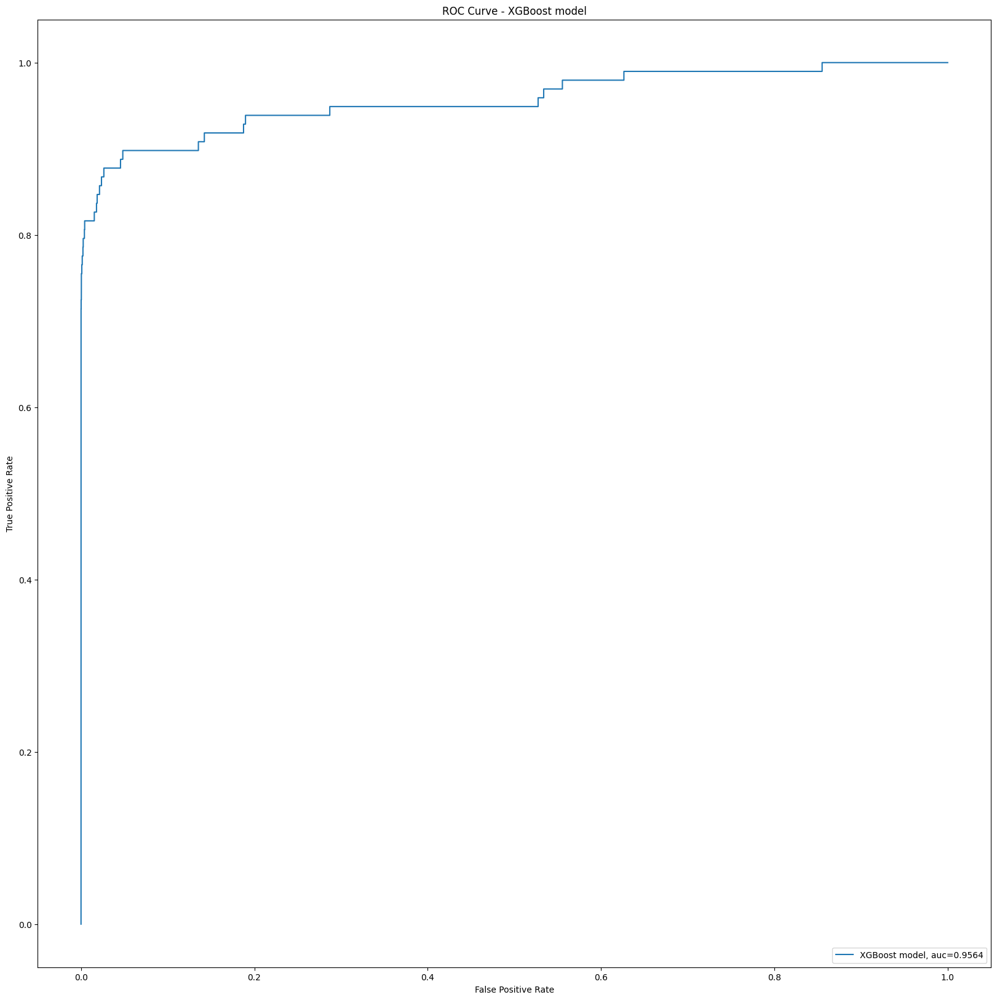

Time Taken by Model: --- 27.83788561820984 seconds ---


In [93]:
DataImabalance = "ADASYN Oversampling with StratifiedKFold CV"
df_Results = run_all_models(df_Results, DataImabalance, X_train_ADASYN, y_train_ADASYN, X_test, y_test, run_svm=False)

In [94]:
df_Results

,Data_Imbalance_Handling,Model,Accuracy,roc_value,threshold
0,Power Transformer,Logistic Regression with L2 Regularisation,0.998315,0.500000,inf
1,Power Transformer,Logistic Regression with L1 Regularisation,0.998841,0.964140,0.009224
2,Power Transformer,KNN,0.999298,0.900846,0.200000
3,Power Transformer,Tree Model with gini criteria,0.998806,0.859015,1.000000
4,Power Transformer,Tree Model with entropy criteria,0.999052,0.864337,1.000000
5,Power Transformer,Random Forest,0.999386,0.930162,0.010000
6,Power Transformer,XGBoost,0.999298,0.927759,0.000028
7,Power Transformer,SVM,0.998543,0.888267,0.001027
8,RepeatedKFold Cross Validation,Logistic Regression with L2 Regularisation,0.998438,0.500000,inf
9,RepeatedKFold Cross Validation,Logistic Regression with L1 Regularisation,0.999175,0.910947,0.032235


#### Results for ADASYN Oversampling:

Based on the Accuracy and ROC values, XGBoost has delivered the best results when using the ADASYN oversampling technique.

#### Conclusion After Running Models on Oversampled Data:

- Based on the results, the XGBOOST model with Random Oversampling and StratifiedKFold Cross-Validation has delivered the best performance. Therefore, it is worthwhile to tune the hyperparameters of this model to achieve optimal results.

- However, it is important to note that the Logistic Regression model with L2 Regularization and RepeatedKFold Cross-Validation has yielded the best results without any oversampling.

### 4.7 Fine-Tuning Model Hperparameters to Address Class Imbalance

In [95]:
# Fit model on training data
XGBmodel = XGBClassifier(random_state=42)
XGBmodel.fit(X_over, y_over)

# Model accuracy
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score}')

# Probabilities for the positive class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f'XGboost ROC AUC: {XGB_roc_value}')

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'XGBoost Optimal Threshold: {optimal_threshold}')

Model Accuracy: 0.9994733238531627
XGboost ROC AUC: 0.9826970444896739
XGBoost Optimal Threshold: 4.1308128857053816e-05


In [96]:
#Evaluate XGboost model
# fit model no training data
XGBmodel = XGBClassifier(random_state=42)

In [97]:
# Define the parameter grid
param_test = {
    'max_depth': range(3, 10, 2),
    'min_child_weight': range(1, 6, 2)
}

# Initialize the XGBClassifier
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0,
    learning_rate=0.1, max_delta_step=0, max_depth=3,
    min_child_weight=1, n_estimators=100, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'max_depth': 9, 'min_child_weight': 5}
Best ROC AUC Score: 0.9994965881351054
{'mean_fit_time': array([17.82310872, 16.34029937, 16.51093912, 20.82786689, 20.84375396,
       19.70301204, 25.72040181, 24.8497972 , 24.90929923, 27.82393126,
       26.62019024, 23.34817123]), 'std_fit_time': array([1.13175122, 0.42092978, 0.15369003, 0.98746419, 0.92170685,
       0.54060823, 0.44760462, 1.35312047, 0.59272828, 0.46406994,
       0.62725196, 2.81283107]), 'mean_score_time': array([0.58553638, 0.47127471, 0.46174588, 0.67030859, 0.85795054,
       0.86544404, 1.19146004, 0.92684369, 0.98025007, 1.0417932 ,
       1.00180578, 0.7621778 ]), 'std_score_time': array([0.09391557, 0.05991026, 0.14899786, 0.0933232 , 0.22098657,
       0.18645027, 0.31116018, 0.08925052, 0.06821917, 0.09048449,
       0.09429044, 0.28007668]), 'param_max_depth': masked_array(data=[3, 3, 3, 5, 5, 5, 7, 7, 7, 9, 9, 9],
             mask=[False, False, False, False, False, False, False, False,
   

In [98]:
# Tuning XGBoost Model for n_estimators

# Define the parameter grid
param_test = {
    'n_estimators': range(60, 150, 20)
}

# Initialize the XGBClassifier
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0,
    learning_rate=0.1, max_delta_step=0, max_depth=3,
    min_child_weight=5, n_jobs=1, objective='binary:logistic',
    random_state=42, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'n_estimators': 140}
Best ROC AUC Score: 0.9993535520111083
{'mean_fit_time': array([13.05921483, 14.99551229, 16.99856086, 18.50115719, 17.7184032 ]), 'std_fit_time': array([0.20775134, 0.10027043, 0.3811971 , 0.72179695, 4.18821665]), 'mean_score_time': array([0.36145825, 0.39444475, 0.69695811, 0.59620256, 0.60964575]), 'std_score_time': array([0.05393508, 0.05731107, 0.18334328, 0.05627954, 0.36668576]), 'param_n_estimators': masked_array(data=[60, 80, 100, 120, 140],
             mask=[False, False, False, False, False],
       fill_value=999999), 'params': [{'n_estimators': 60}, {'n_estimators': 80}, {'n_estimators': 100}, {'n_estimators': 120}, {'n_estimators': 140}], 'split0_test_score': array([0.99804271, 0.99894526, 0.99928762, 0.99936006, 0.999389  ]), 'split1_test_score': array([0.99885291, 0.9995766 , 0.99980288, 0.99988025, 0.99993265]), 'split2_test_score': array([0.98882136, 0.9951269 , 0.99512454, 0.99721991, 0.99797305]), 'split3_test_score': array([

In [99]:
# Define the parameter grid
param_test = {
    'n_estimators': [110, 120, 130],
    'max_depth': [2, 3, 4],
    'min_child_weight': [4, 5, 6]
}

# Initialize the XGBClassifier
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0,
    learning_rate=0.1, max_delta_step=0, max_depth=3,
    min_child_weight=5, n_jobs=1, objective='binary:logistic',
    random_state=42, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 130}
Best ROC AUC Score: 0.9995360359395876
{'mean_fit_time': array([15.74775953, 16.09928241, 16.83438635, 15.89168644, 15.98642716,
       16.48923492, 15.22933788, 17.04124184, 16.84552603, 16.88134847,
       18.89275007, 18.76772103, 17.59451203, 17.7880939 , 19.45374222,
       17.0443109 , 18.13573465, 19.5192111 , 19.79778333, 20.55866475,
       21.97999072, 19.9455266 , 19.98953524, 21.85013514, 19.93850126,
       20.0457499 , 19.2214241 ]), 'std_fit_time': array([0.36886926, 0.40231816, 0.43806096, 0.19699312, 0.22980962,
       0.21405713, 0.27746183, 0.61793725, 0.26166857, 0.79300812,
       0.52554071, 0.8960718 , 0.8322613 , 0.43113868, 0.87542197,
       0.56858948, 1.11230567, 0.67199918, 0.77022175, 1.39456779,
       1.01001938, 0.60323111, 0.1822405 , 0.7343502 , 0.74331121,
       0.91958882, 3.05146494]), 'mean_score_time': array([0.43221927, 0.47261553, 0.48103657, 0.66213989, 0.43247933,


In [100]:
# Define the parameter grid
param_test = {
    'learning_rate': [0.05, 0.1, 0.125, 0.15, 0.2]
}

# Initialize the XGBClassifier
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0,
    learning_rate=0.1, max_delta_step=0, max_depth=4,
    min_child_weight=4, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'learning_rate': 0.2}
Best ROC AUC Score: 0.9998698370368324
{'mean_fit_time': array([23.04256868, 22.06308241, 22.02038894, 22.33110204, 18.37172222]), 'std_fit_time': array([0.2911659 , 0.90716083, 0.86389859, 0.47947044, 5.44473543]), 'mean_score_time': array([0.74098778, 0.70700507, 0.77414756, 0.74186192, 0.62082977]), 'std_score_time': array([0.04665081, 0.04973868, 0.22960033, 0.05323929, 0.20834204]), 'param_learning_rate': masked_array(data=[0.05, 0.1, 0.125, 0.15, 0.2],
             mask=[False, False, False, False, False],
       fill_value=1e+20), 'params': [{'learning_rate': 0.05}, {'learning_rate': 0.1}, {'learning_rate': 0.125}, {'learning_rate': 0.15}, {'learning_rate': 0.2}], 'split0_test_score': array([0.99917503, 0.99950143, 0.99951014, 0.9995401 , 0.99959131]), 'split1_test_score': array([0.99987108, 0.99998772, 0.99999528, 0.99999639, 0.99999995]), 'split2_test_score': array([0.97809198, 0.99808445, 0.99518817, 0.99689876, 0.9998438 ]), 'split3_te

In [101]:
# Define the parameter grid
param_test = {
    'gamma': [i / 10.0 for i in range(0, 5)]
}

# Initialize the XGBClassifier with previously tuned parameters
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0,
    learning_rate=0.2, max_delta_step=0, max_depth=4,
    min_child_weight=4, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'gamma': 0.4}
Best ROC AUC Score: 0.9998833206517801
{'mean_fit_time': array([22.33935108, 22.34861045, 22.15617666, 22.51481562, 19.22692432]), 'std_fit_time': array([0.48084349, 0.92938498, 0.79355298, 0.54141297, 5.30159585]), 'mean_score_time': array([0.69023929, 0.82411942, 0.9111218 , 0.70110269, 0.77952957]), 'std_score_time': array([0.08881389, 0.19590597, 0.28224231, 0.09443758, 0.38760085]), 'param_gamma': masked_array(data=[0.0, 0.1, 0.2, 0.3, 0.4],
             mask=[False, False, False, False, False],
       fill_value=1e+20), 'params': [{'gamma': 0.0}, {'gamma': 0.1}, {'gamma': 0.2}, {'gamma': 0.3}, {'gamma': 0.4}], 'split0_test_score': array([0.99959131, 0.99960512, 0.99961862, 0.99963591, 0.99966207]), 'split1_test_score': array([0.99999995, 0.99999978, 0.99999995, 0.99999949, 0.99999995]), 'split2_test_score': array([0.9998438 , 0.99988783, 0.99977664, 0.99984574, 0.99984222]), 'split3_test_score': array([0.9999268 , 0.99992481, 0.99993984, 0.99992847

In [102]:
# Initialize and fit the XGBClassifier
XGBmodel = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0.1,
    learning_rate=0.2, max_delta_step=0, max_depth=4,
    min_child_weight=4, missing=np.nan, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Fit the model on the training data
XGBmodel.fit(X_over, y_over)

# Evaluate model performance
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score}')

# Probabilities for the positive class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f'XGBoost ROC AUC value: {XGB_roc_value}')

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'XGBoost optimal threshold: {optimal_threshold}')

Model Accuracy: 0.999350432752234
XGBoost ROC AUC value: 0.9891755587274391
XGBoost optimal threshold: 0.0009095121058635414


### Refining Tuned Parameters and Optimizing Learning Rate

#### Parameters Tuned:
With 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 130, and gamma: 0.1 set, we will now focus on optimizing the learning rate.

#### Further Tuning:
We will narrow down the parameters 'max_depth', 'min_child_weight', and 'n_estimators' for the XGBoost model.

#### Optimizing n_estimators:
Next, we will fine-tune the n_estimators parameter for the XGBoost model.

In [103]:
# Define the parameter grid
param_test = {
    'subsample': [i / 10.0 for i in range(7, 10)],
    'colsample_bytree': [i / 10.0 for i in range(7, 10)]
}

# Initialize the XGBClassifier with previously tuned parameters
xgb_clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0.1,
    learning_rate=0.2, max_delta_step=0, max_depth=4,
    min_child_weight=4, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Initialize GridSearchCV
gsearch1 = GridSearchCV(
    estimator=xgb_clf, param_grid=param_test,
    scoring='roc_auc', n_jobs=4, cv=5
)

# Fit GridSearchCV
gsearch1.fit(X_over, y_over)

# Output the results
cv_results = gsearch1.cv_results_
best_params = gsearch1.best_params_
best_score = gsearch1.best_score_

print(f"Best Parameters: {best_params}")
print(f"Best ROC AUC Score: {best_score}")

print(cv_results)

Best Parameters: {'colsample_bytree': 0.8, 'subsample': 0.9}
Best ROC AUC Score: 0.999882297372196
{'mean_fit_time': array([23.53195314, 22.89211674, 22.76774106, 23.35805793, 22.33046498,
       22.42794108, 22.57230992, 22.47390513, 20.41992168]), 'std_fit_time': array([0.60464961, 0.73640272, 1.10197658, 0.65979676, 1.22968267,
       0.69515438, 0.85028105, 0.45051425, 6.18415315]), 'mean_score_time': array([0.82749944, 0.70183334, 0.72758975, 0.76552157, 0.84425945,
       0.74317627, 0.9698328 , 0.75700092, 0.50980568]), 'std_score_time': array([0.14451737, 0.09370606, 0.10749043, 0.04397755, 0.21795335,
       0.19312553, 0.19458543, 0.18809877, 0.14174935]), 'param_colsample_bytree': masked_array(data=[0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.9, 0.9, 0.9],
             mask=[False, False, False, False, False, False, False, False,
                   False],
       fill_value=1e+20), 'param_subsample': masked_array(data=[0.7, 0.8, 0.9, 0.7, 0.8, 0.9, 0.7, 0.8, 0.9],
             mask=[Fal

In [104]:
# Initialize and fit the XGBClassifier
XGBmodel = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=0.8,
    colsample_bynode=1, colsample_bytree=1, gamma=0.1,
    learning_rate=0.2, max_delta_step=0, max_depth=4,
    min_child_weight=4, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=0.8, verbosity=1
)

# Fit the model on the training data
XGBmodel.fit(X_over, y_over)

# Evaluate model performance
XGB_test_score = XGBmodel.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score}')

# Probabilities for the positive class
XGB_probs = XGBmodel.predict_proba(X_test)[:, 1]

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f'XGBoost ROC AUC value: {XGB_roc_value}')

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'XGBoost optimal threshold: {optimal_threshold}')

Model Accuracy: 0.999350432752234
XGBoost ROC AUC value: 0.9796468382474599
XGBoost optimal threshold: 0.0026586358435451984


**Adjusting Parameters Based on ROC Performance**

Due to a drop in the ROC value, we will disregard the new values of 'colsample_bytree': 0.8 and 'subsample': 0.8.

In [105]:
# Initialize and fit the XGBClassifier
clf = XGBClassifier(
    base_score=0.5, booster='gbtree', colsample_bylevel=1,
    colsample_bynode=1, colsample_bytree=1, gamma=0.1,
    learning_rate=0.2, max_delta_step=0, max_depth=4,
    min_child_weight=4, n_estimators=130, n_jobs=1,
    objective='binary:logistic', random_state=42,
    reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
    subsample=1, verbosity=1
)

# Fit the model on the balanced dataset
clf.fit(X_over, y_over)

# Evaluate model performance
XGB_test_score = clf.score(X_test, y_test)
print(f'Model Accuracy: {XGB_test_score}')

# Probabilities for the positive class
XGB_probs = clf.predict_proba(X_test)[:, 1]

# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f'XGBoost ROC AUC value: {XGB_roc_value}')

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'XGBoost optimal threshold: {optimal_threshold}')

Model Accuracy: 0.999350432752234
XGBoost ROC AUC value: 0.9891755587274391
XGBoost optimal threshold: 0.0009095121058635414


#### Displaying Important Features of the Best Model for Dataset Understanding

Top feature index: 14
2nd top feature index: 4
3rd top feature index: 10


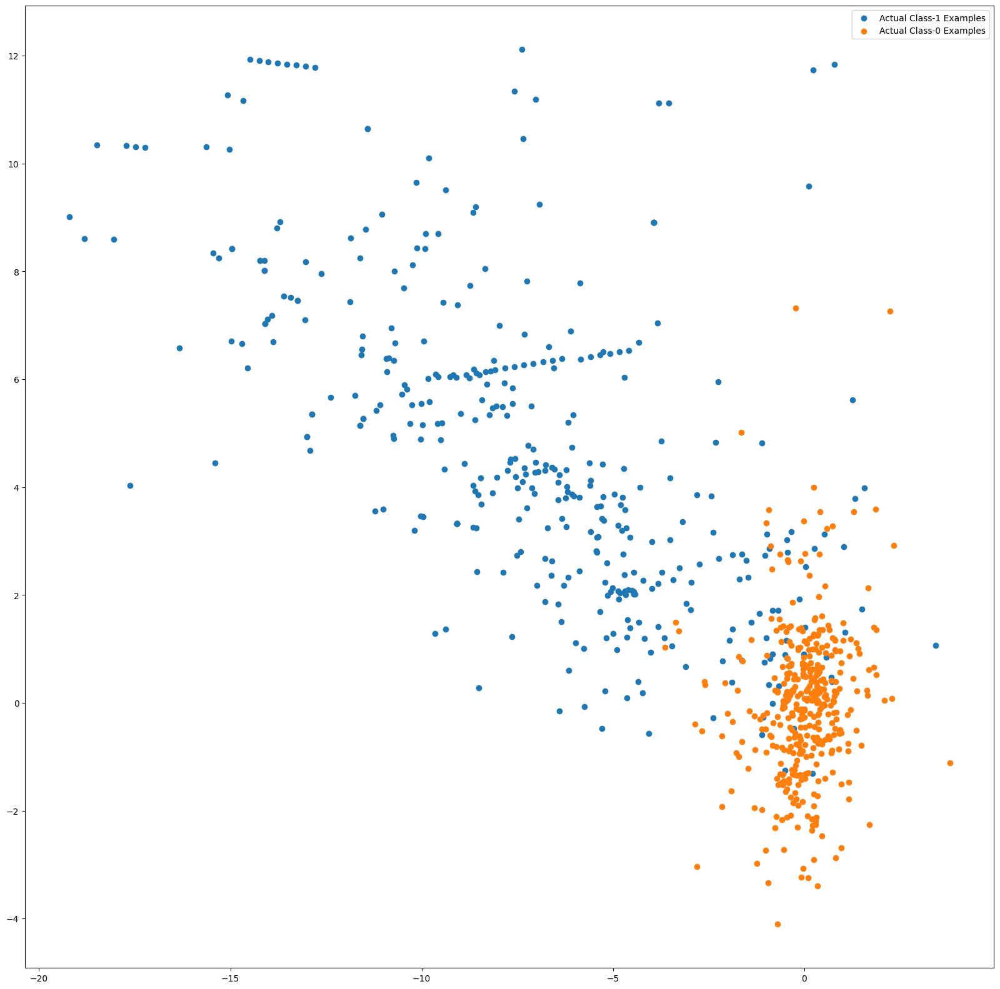

In [106]:
# Extract feature importances
feature_importances = clf.feature_importances_

# Get indices of top 3 features
top_indices = np.argsort(feature_importances)[-3:][::-1]

# Print top features
print(f'Top feature index: {top_indices[0] + 1}')
print(f'2nd top feature index: {top_indices[1] + 1}')
print(f'3rd top feature index: {top_indices[2] + 1}')

# Variable on Index-13 and Index-9 seems to be the top 2 variables
top_var_index = top_indices[0]
second_top_var_index = top_indices[1]

# Convert X_train to numpy array if not already
X_train_np = X_train.to_numpy()

# Separate class 1 and class 0 examples
X_train_1 = X_train_np[y_train == 1.0]
X_train_0 = X_train_np[y_train == 0.0]

# Shuffle class 0 examples
np.random.shuffle(X_train_0)

# Plotting
plt.figure(figsize=(20, 20))
plt.scatter(X_train_1[:, top_var_index], X_train_1[:, second_top_var_index], label='Actual Class-1 Examples')
plt.scatter(X_train_0[:X_train_1.shape[0], top_var_index], X_train_0[:X_train_1.shape[0], second_top_var_index],
            label='Actual Class-0 Examples')
plt.legend()
plt.show()

In [107]:
# Calculate ROC AUC
XGB_roc_value = roc_auc_score(y_test, XGB_probs)
print(f'XGBoost ROC AUC value: {XGB_roc_value}')

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, XGB_probs)

# Determine the optimal threshold
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(f'XGBoost optimal threshold: {optimal_threshold}')

XGBoost ROC AUC value: 0.9891755587274391
XGBoost optimal threshold: 0.0009095121058635414



### Observationthe dataset.

### Train/Test Split:

- The dataset is split into training and testing sets using stratified sampling to ensure adequate representation of the minority class.

### Model Validation:

- K-fold cross-validation is employed for model validation, enabling assessment of model performance across different data subsets.

### Model Building / Hyperparameter Tuning:

- Various models are experimented with, including Logistic Regression, Decision Trees, Random Forest, and Gradient Boosting.
- Hyperparameter tuning is conducted using GridSearchCV to identify optimal parameters for each model.

### Handling Class Imbalance:

- Sampling techniques such as SMOTE (Synthetic Minority Over-sampling Technique) are utilized to address the imbalance between fraudulent and non-fraudulent transactions.

### Model Evaluation:

- **Evaluation Metrics:** Accuracy, precision, recall, F1-score, and ROC-AUC are used as evaluation metrics.
- **Metric Emphasis:** Given the imbalanced nature of the dataset, recall and F1-score are prioritized over accuracy.
- **Final Model Selection:** The final model is selected based on achieving the best balance between precision and recall, with a specific focus on minimizing false negatives (missing fraudulent transactions).

This comprehensive approach ensures a thorough understanding of the data analysis, modeling strategies, and evaluation criteria used throughout the project.

# Conclusion:

## Model Selection Summary

After thorough evaluation of various models on oversampled data, the XGBoost model utilizing Random Oversampling and StratifiedKFold Cross-Validation emerged as the top performer.

### Performance Metrics:
- **Model Accuracy:** 0.9993
- **XGBoost ROC Value:** 0.9862
- **Optimal XGBoost Threshold:** 0.0009

### Insight:
Upon reviewing the results, it's evident that Logistic Regression with L2 Regularization and RepeatedKFold Cross-Validation achieved superior performance without employing any oversampling techniques.

Based on these findings, we have selected the XGBoost model with Random Oversampling and StratifiedKFold CV for further refinement through hyperparameter tuning to maximize its predictive capability.